# Initailize

In [20]:
from itertools import compress

import matplotlib.pyplot as plt
import numpy as np

import mne
import os
import pandas as pd

# Load Data

In [68]:
dir = 'C:/Users/USER/Desktop/fNIRS/nirx_data/'

# Load the data
folder_list = os.listdir(dir)
file_list = []
for i in range(len(folder_list)):
    file_list.append(folder_list[i] + '/' + folder_list[i] + '.snirf')

print(file_list)

['2024-05-02_001/2024-05-02_001.snirf', '2024-05-21_001/2024-05-21_001.snirf', '2024-05-23_001/2024-05-23_001.snirf', '2024-05-23_002/2024-05-23_002.snirf']


# MNE-fNIRS

preprocessing pipeline

In [422]:
# Load data

def read_raw(file_name):
    raw = mne.io.read_raw_snirf(file_name)
    print(raw.info)
    print('\n', raw.annotations)

    return raw

In [423]:
# Preprocessing

def annotation(raw, anno_dict={'1': 'Target', '2': 'Non-target', '10': 'Non-target_session', '11': 'Target_session'}, duration=5):
    raw.annotations.rename(anno_dict)
    # raw.annotations.set_durations(duration)

    return raw

def mbll(raw):
    raw = raw.resample(10)
    raw = annotation(raw)
    
    return raw

def preprocess(raw):
    raw = raw.resample(10)
    raw = mbll(raw)

    # MBLL
    raw_od = mne.preprocessing.nirs.optical_density(raw)
    # raw_od.plot(n_channels=len(raw_od.ch_names), duration=500, show_scrollbars=False)

    sci = mne.preprocessing.nirs.scalp_coupling_index(raw_od)
    raw_od.info['bads'] = list(compress(raw_od.ch_names, sci < 0.5))
    
    raw_haemo = mne.preprocessing.nirs.beer_lambert_law(raw_od, ppf=0.1)
    # raw_haemo.plot(n_channels=len(raw_haemo.ch_names),  duration=600, show_scrollbars=False)

    raw_haemo = raw_haemo.filter(0, 0.2, h_trans_bandwidth=0.2)

    #short_chs = get_short_channels(raw_haemo)
    # raw_haemo = get_long_channels(raw_haemo)

    return raw_haemo

In [447]:
def epoching(raw_haemo, tmin=0, tmax=30):
    events, ids = mne.events_from_annotations(raw_haemo)
    nt_id = ids['Non-target_session']
    t_id = ids['Target_session']
    nt_epochs = mne.Epochs(raw_haemo, events, nt_id, tmin, tmax, reject_by_annotation=True,
                    proj=True, baseline=(0, 0), preload=True, detrend=None, verbose=True)
    t_epochs = mne.Epochs(raw_haemo, events, t_id, tmin, tmax, reject_by_annotation=True,
                    proj=True, baseline=(0, 0), preload=True, detrend=None, verbose=True)
    # epochs.plot_drop_log()

    return nt_epochs, t_epochs

In [448]:
for i in range(len(file_list)):
    raw = read_raw(dir + file_list[i])
    raw_haemo = preprocess(raw)
    nt_epochs, t_epochs = epoching(raw_haemo)

Loading C:\Users\USER\Desktop\fNIRS\nirx_data\2024-05-02_001\2024-05-02_001.snirf
<Info | 9 non-empty values
 bads: []
 ch_names: S1_D1 760, S1_D2 760, S2_D1 760, S2_D3 760, S3_D2 760, S3_D3 ...
 chs: 40 fNIRS (CW amplitude)
 custom_ref_applied: False
 dig: 300 items (2 Cardinal, 298 EEG)
 highpass: 0.0 Hz
 lowpass: 5.1 Hz
 meas_date: 2024-05-02 20:01:47 UTC
 nchan: 40
 projs: []
 sfreq: 10.2 Hz
 subject_info: 2 items (dict)
>

 <Annotations | 213 segments: 1 (31), 10 (5), 11 (5), 2 (169), 4 (3)>
Sampling frequency of the instance is already 10.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 0.20 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.30 Hz)
- Filter leng

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Sampling frequency of the instance is already 10.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 0.20 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.30 Hz)
- Filter length: 165 samples (16.500 s)

Used Annotations descriptions: ['4', 'Non-target', 'Non-target_session', 'Target', 'Target_session']
Not setting metadata
5 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 5 events and 301 original time points ...
0 bad epochs dropped
Not setting metadata
5 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 5 events a

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Sampling frequency of the instance is already 10.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 0.20 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.30 Hz)
- Filter length: 165 samples (16.500 s)

Used Annotations descriptions: ['4', 'Non-target', 'Non-target_session', 'Target', 'Target_session']
Not setting metadata
5 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 5 events and 301 original time points ...
0 bad epochs dropped
Not setting metadata
5 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 5 events a

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Sampling frequency of the instance is already 10.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 0.20 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.30 Hz)
- Filter length: 165 samples (16.500 s)

Used Annotations descriptions: ['4', 'Non-target', 'Non-target_session', 'Target', 'Target_session']
Not setting metadata
5 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 5 events and 301 original time points ...
0 bad epochs dropped
Not setting metadata
5 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 5 events a

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


# Feature Extract

In [428]:
import scipy.io
from scipy.stats import skew, kurtosis

cal_ssc = lambda x: (x >= 0).astype(float)

def feture_extraction(ch, mat):
    y = 1 # target
    target_data = np.empty((0, 10))

    for i in range(ch):
        channel = mat[:, i]
        train_data = np.empty((0, 10))
        # feature extraction
        f_aam = np.max(np.abs(channel))
        f_mean = channel.mean()
        f_std = channel.std()
        f_med = np.median(channel)
        f_skew = skew(channel)
        f_kurto = kurtosis(channel)
        f_ssc = sum(cal_ssc(-np.diff(channel, prepend=1)[1:-1]*np.diff(channel)[1:]))
        f_power = 0
        for j in range(len(channel)):
            f_power = f_power + channel[j]*channel[j]
        f_power = f_power / len(channel)
        f_energy = np.sum(np.abs(channel)*np.abs(channel))
        #f_def = abs(np.max(channel) - np.min(channel))
        #f_len = len(channel)

        train_data = np.array([[f_aam, f_mean, f_std, f_med, f_skew, f_kurto, f_ssc, f_power, f_energy, i]])
        target_data = np.append(target_data, train_data, axis=0)
    return target_data

In [248]:
nt_epochs[0].ch_names

['S1_D1 hbo',
 'S1_D2 hbo',
 'S2_D1 hbo',
 'S2_D3 hbo',
 'S3_D2 hbo',
 'S3_D3 hbo',
 'S3_D4 hbo',
 'S4_D2 hbo',
 'S4_D4 hbo',
 'S4_D5 hbo',
 'S5_D3 hbo',
 'S5_D4 hbo',
 'S5_D6 hbo',
 'S6_D4 hbo',
 'S6_D5 hbo',
 'S6_D6 hbo',
 'S7_D5 hbo',
 'S7_D7 hbo',
 'S8_D6 hbo',
 'S8_D7 hbo',
 'S1_D1 hbr',
 'S1_D2 hbr',
 'S2_D1 hbr',
 'S2_D3 hbr',
 'S3_D2 hbr',
 'S3_D3 hbr',
 'S3_D4 hbr',
 'S4_D2 hbr',
 'S4_D4 hbr',
 'S4_D5 hbr',
 'S5_D3 hbr',
 'S5_D4 hbr',
 'S5_D6 hbr',
 'S6_D4 hbr',
 'S6_D5 hbr',
 'S6_D6 hbr',
 'S7_D5 hbr',
 'S7_D7 hbr',
 'S8_D6 hbr',
 'S8_D7 hbr']

In [251]:
len(data[0])

361

In [271]:
f_slop = np.gradient(data[0])

f_slop

array([ 2.25445139e-07,  1.89374875e-07,  1.17563624e-07,  4.66664416e-08,
       -2.19981266e-08, -8.68134352e-08, -1.46024164e-07, -1.98127374e-07,
       -2.42445137e-07, -2.77574310e-07, -3.02759244e-07, -3.18473886e-07,
       -3.24965959e-07, -3.21890370e-07, -3.09405223e-07, -2.89027732e-07,
       -2.61931611e-07, -2.29194466e-07, -1.92485895e-07, -1.54184317e-07,
       -1.16087378e-07, -7.91587734e-08, -4.53960912e-08, -1.65812556e-08,
        6.35291965e-09,  2.17680979e-08,  2.81696761e-08,  2.49685911e-08,
        1.23079468e-08, -9.40067308e-09, -3.99493527e-08, -7.81079352e-08,
       -1.22810033e-07, -1.73057737e-07, -2.27297592e-07, -2.83268887e-07,
       -3.38173638e-07, -3.90696882e-07, -4.38646151e-07, -4.78878636e-07,
       -5.10069445e-07, -5.31134111e-07, -5.40381600e-07, -5.36462704e-07,
       -5.18611006e-07, -4.87257640e-07, -4.42553459e-07, -3.84519845e-07,
       -3.14539721e-07, -2.34406180e-07, -1.46343691e-07, -5.21030371e-08,
        4.65910007e-08,  

In [276]:
peaks, _ = find_peaks(data[i])
f_peak_value = data[i][peaks]

f_peak_value

array([ 9.78737669e-07, -2.86610915e-06,  4.28338020e-05,  5.06753033e-05,
        4.06668975e-05])

In [277]:
max(f_peak_value)

5.0675303347348405e-05

In [449]:
import scipy.io
from scipy.stats import skew, kurtosis
from scipy.signal import find_peaks

def epochs2df(epoch):
    data = epoch.get_data()
    data = data.squeeze(0)
    # df = pd.DataFrame(data, index=epoch.ch_names)

    return data

def feature(data, epoch):
    feature_data = []

    for i in range(len(epoch.ch_names)):
        features = []
        f_mean = data[i].mean()
        f_std = data[i].std()
        # f_slop = np.gradient(data[i])
        f_skew = skew(data[i])
        f_kurt = kurtosis(data[i])
        peaks, _ = find_peaks(data[i])
        f_peak_value = max(data[i][peaks])
        f_min = data[i].min()
        # ch = epoch.ch_names[i]


        features = [f_mean, f_std, f_skew, f_kurt, f_peak_value, f_min] # i
        feature_data.append(features)

    return feature_data

In [450]:
from itertools import product

ch_list = raw_haemo.ch_names
f_list = ['f_mean', 'f_std', 'f_skew', 'f_kurt', 'f_peak_value', 'f_min']

col = list(product(ch_list, f_list))

col_list = []
for i in range(len(col)):
    col_name = '_'.join(col[i])
    col_list.append(col_name)

print(col_list)

['S1_D1 hbo_f_mean', 'S1_D1 hbo_f_std', 'S1_D1 hbo_f_skew', 'S1_D1 hbo_f_kurt', 'S1_D1 hbo_f_peak_value', 'S1_D1 hbo_f_min', 'S1_D2 hbo_f_mean', 'S1_D2 hbo_f_std', 'S1_D2 hbo_f_skew', 'S1_D2 hbo_f_kurt', 'S1_D2 hbo_f_peak_value', 'S1_D2 hbo_f_min', 'S2_D1 hbo_f_mean', 'S2_D1 hbo_f_std', 'S2_D1 hbo_f_skew', 'S2_D1 hbo_f_kurt', 'S2_D1 hbo_f_peak_value', 'S2_D1 hbo_f_min', 'S2_D3 hbo_f_mean', 'S2_D3 hbo_f_std', 'S2_D3 hbo_f_skew', 'S2_D3 hbo_f_kurt', 'S2_D3 hbo_f_peak_value', 'S2_D3 hbo_f_min', 'S3_D2 hbo_f_mean', 'S3_D2 hbo_f_std', 'S3_D2 hbo_f_skew', 'S3_D2 hbo_f_kurt', 'S3_D2 hbo_f_peak_value', 'S3_D2 hbo_f_min', 'S3_D3 hbo_f_mean', 'S3_D3 hbo_f_std', 'S3_D3 hbo_f_skew', 'S3_D3 hbo_f_kurt', 'S3_D3 hbo_f_peak_value', 'S3_D3 hbo_f_min', 'S3_D4 hbo_f_mean', 'S3_D4 hbo_f_std', 'S3_D4 hbo_f_skew', 'S3_D4 hbo_f_kurt', 'S3_D4 hbo_f_peak_value', 'S3_D4 hbo_f_min', 'S4_D2 hbo_f_mean', 'S4_D2 hbo_f_std', 'S4_D2 hbo_f_skew', 'S4_D2 hbo_f_kurt', 'S4_D2 hbo_f_peak_value', 'S4_D2 hbo_f_min', 'S4_D4 

In [317]:
len(col_list)

240

In [451]:
def feature_extract(epochs):
    feature_list = []

    for i in range(len(epochs)):
        data = epochs2df(epochs[i])

        li = feature(data, epochs[i])
        feature_list.append(li)
    
    # print(len(feature_list), len(feature_list[0]))
    # print(feature_list)
    # feature_df = pd.DataFrame(feature_list.reshape() , columns=['f_mean', 'f_std', 'f_skew', 'f_kurt', 'f_peak_value', 'f_min', 'ch'])
    print(feature_list)
    feature_list = np.array(feature_list).reshape(-1, 240) # 7(features + ch) or 240(features * channels)

    return feature_list

In [303]:
nt_feature

array([[ 2.01741292e-05,  1.93670957e-05, -6.39918721e-02, ...,
         5.06753033e-05, -1.01484293e-05,  0.00000000e+00],
       [ 1.25412610e-05,  1.51479079e-05, -1.27604414e-01, ...,
         3.79254876e-05, -1.08360902e-05,  1.00000000e+00],
       [ 2.00836347e-05,  1.82987024e-05,  1.19551493e-01, ...,
         5.25225555e-05, -3.31257349e-06,  2.00000000e+00],
       ...,
       [-9.42562948e-06,  5.58382287e-06,  2.80862070e-01, ...,
        -3.43800505e-09, -1.65188650e-05,  3.70000000e+01],
       [-5.05085584e-06,  3.51968267e-06,  1.17395041e-01, ...,
         1.05707125e-08, -9.44323665e-06,  3.80000000e+01],
       [-4.69362638e-06,  2.71039627e-06,  1.96442723e-01, ...,
         1.67825320e-10, -7.98761999e-06,  3.90000000e+01]])

In [452]:
nt_df = []
t_df = []

for i in range(len(file_list)):
    raw = read_raw(dir + file_list[i])
    raw_haemo = preprocess(raw)
    nt_epochs, t_epochs = epoching(raw_haemo)

    nt_feature = feature_extract(nt_epochs)
    t_feature = feature_extract(t_epochs)

    nt_df.append(nt_feature)
    t_df.append(t_feature)

nt_df = np.array(nt_df).reshape(-1, 240) # 7 or 280
t_df = np.array(t_df).reshape(-1, 240)

nt_df = pd.DataFrame(nt_df, columns=col_list) # ['f_mean', 'f_std', 'f_skew', 'f_kurt', 'f_peak_value', 'f_min', 'ch']
t_df = pd.DataFrame(t_df, columns=col_list)

Loading C:\Users\USER\Desktop\fNIRS\nirx_data\2024-05-02_001\2024-05-02_001.snirf
<Info | 9 non-empty values
 bads: []
 ch_names: S1_D1 760, S1_D2 760, S2_D1 760, S2_D3 760, S3_D2 760, S3_D3 ...
 chs: 40 fNIRS (CW amplitude)
 custom_ref_applied: False
 dig: 300 items (2 Cardinal, 298 EEG)
 highpass: 0.0 Hz
 lowpass: 5.1 Hz
 meas_date: 2024-05-02 20:01:47 UTC
 nchan: 40
 projs: []
 sfreq: 10.2 Hz
 subject_info: 2 items (dict)
>

 <Annotations | 213 segments: 1 (31), 10 (5), 11 (5), 2 (169), 4 (3)>
Sampling frequency of the instance is already 10.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 0.20 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.30 Hz)
- Filter leng

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


[[[1.3332339699710432e-05, 1.4362065972274766e-05, -0.09392179514820424, -0.7642577434959641, 3.044896093462951e-05, -1.7406372323522022e-05], [1.0530274362972034e-05, 8.199981323280532e-06, 0.012057924585960616, -1.0717474445946835, 2.1251073577369658e-05, -4.940820431223677e-06], [2.2189048155380132e-05, 1.49711820830019e-05, -0.4352461949287934, -1.0438616893748462, 4.319895283631787e-05, -6.741514097340967e-06], [3.5913417213070495e-05, 1.853507834767159e-05, -0.5326267160202836, -1.128585826874532, 6.0129886216575554e-05, 0.0], [6.250328386656311e-06, 5.812676490815828e-06, 0.4624010210149217, -0.43374321905549174, 2.0060942937901098e-05, -3.093728897305295e-06], [3.1431897165161563e-05, 1.5951845691269218e-05, -0.5464365813518358, -1.1337530138786929, 4.9602968136537285e-05, 0.0], [1.6658102206194072e-05, 7.569129015287995e-06, 0.006493807338844215, -0.9004839952075505, 3.19405449966604e-05, 0.0], [1.2511554238312015e-05, 8.619081407727903e-06, 0.4201520330034224, -0.684435671238

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


[[[-6.858223994464914e-07, 1.034030195143268e-05, -0.19547826662883708, -1.2374323005643177, 1.518133099553136e-05, -2.422748660718312e-05], [-3.600187910035916e-06, 1.4066361568562671e-05, 0.15492844233288378, -0.9089940753462873, 2.8400660588336344e-05, -3.408601786949286e-05], [2.3328839980568985e-05, 1.6040103657178424e-05, -0.5251599722376629, -1.1620344342885018, 4.46249106685544e-05, -1.1465156496743485e-05], [-6.855335972020839e-06, 1.612109061648795e-05, -0.4662058400623306, 0.8702284186482543, 2.2694416208642146e-05, -5.8589274580402216e-05], [5.594119298450655e-06, 9.383295633167096e-06, -0.6620439424446709, -0.4033130640897853, 1.972648978068608e-05, -1.879289110315885e-05], [4.679293598838912e-05, 2.0971461173951603e-05, -0.1361245523650392, -1.1426704409989101, 8.197374482373866e-05, 0.0], [1.4551225458444244e-05, 1.6362716956492215e-05, -0.020187972754927314, -0.975363568506618, 3.8788992883269277e-05, -1.9016765233151434e-05], [3.814561909933059e-06, 9.803308002066769e-

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


[[[-2.6218718681185617e-05, 1.6668846277300618e-05, 0.08377183320806393, -1.3195083940932755, -6.003744315476037e-07, -5.2961232175627434e-05], [6.758234660407134e-06, 5.916243974172066e-06, 0.3533110236694883, -0.7823118886456566, 1.86144678557848e-05, -1.9921583372861643e-06], [-3.672247099719916e-06, 5.4242817914186355e-06, -0.35209523892289174, 0.05515320288548953, 5.9684460654148446e-06, -1.7549651225957753e-05], [-9.353159665684247e-06, 1.307133863555267e-05, 0.2715905674919499, -1.0654440025071357, 1.388217236317768e-05, -3.053642260762558e-05], [2.1473040992922282e-05, 1.1032031563226686e-05, -1.133179183972657, -0.13797893369199876, 3.288489740699396e-05, -1.8088192299344668e-06], [1.1324008753952784e-05, 1.0089975121164407e-05, 0.01748237475973426, -0.776646100864113, 3.114677613500584e-05, -6.692738866611743e-06], [1.725675507649017e-05, 1.048277184960625e-05, -0.38254027894655585, -0.9985664791579798, 3.273432039567359e-05, -1.0471480818454464e-06], [2.316137713421545e-05, 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


[[[-1.8050148022734425e-05, 1.3099052478791364e-05, -0.01943350967591145, -1.6543424838901393, 9.89681726049947e-07, -3.663747029725158e-05], [-1.1789418615498362e-05, 1.1510258937180422e-05, 0.19036527536184603, -0.9619398695374883, 1.1024066366522509e-05, -3.1822589605147774e-05], [-6.928424859817783e-06, 5.310813813224039e-06, 0.3554543018785934, -0.37835330758090713, 4.659445119588219e-06, -1.6842926641550864e-05], [-1.7580971849227925e-05, 1.6692898568536502e-05, 0.24468424495240262, -1.1763004217462767, 1.4397637492745026e-05, -4.1544882611367294e-05], [-6.658801749401418e-06, 6.740562704467465e-06, 0.32193911030371997, -0.6135559037394067, 7.412291966658227e-06, -1.9077855689174706e-05], [-8.742126015595989e-06, 1.0228893090487463e-05, 0.047124757886410545, -0.9143266148104772, 1.0083057430126388e-05, -2.7262020074628375e-05], [-8.164438795390116e-07, 7.786228396526677e-06, 0.5692597076990807, -0.22568984915129597, 1.680458680583594e-05, -1.2807193110799922e-05], [-6.64166919424

In [433]:
t_df

,S1_D1 hbo_f_mean,S1_D1 hbo_f_std,S1_D1 hbo_f_skew,S1_D1 hbo_f_kurt,S1_D1 hbo_f_peak_value,S1_D1 hbo_f_min,S1_D2 hbo_f_mean,S1_D2 hbo_f_std,S1_D2 hbo_f_skew,S1_D2 hbo_f_kurt,...,S8_D6 hbr_f_skew,S8_D6 hbr_f_kurt,S8_D6 hbr_f_peak_value,S8_D6 hbr_f_min,S8_D7 hbr_f_mean,S8_D7 hbr_f_std,S8_D7 hbr_f_skew,S8_D7 hbr_f_kurt,S8_D7 hbr_f_peak_value,S8_D7 hbr_f_min
0,1.662274e-05,0.000016,-0.206773,-0.934929,4.254684e-05,-0.000017,1.248085e-05,0.000009,-0.068023,-1.091256,...,-0.443511,-1.055341,1.252541e-05,-3.105956e-06,6.248673e-06,3.850236e-06,-0.670476,-0.444262,1.147442e-05,-2.582147e-06
1,-1.632927e-05,0.000006,0.347139,-0.352473,-6.781835e-06,-0.000026,-1.303410e-05,0.000007,-0.058693,-1.318854,...,0.747022,-0.577405,-2.617868e-06,-6.451639e-06,-3.297391e-06,1.391820e-06,1.131985,0.841937,2.895698e-07,-4.973478e-06
2,-4.054871e-06,0.000010,0.044538,-0.883093,1.657428e-05,-0.000022,-1.229145e-05,0.000008,0.097784,-1.042913,...,-0.596206,-0.383805,3.368385e-06,-6.630454e-06,-1.143575e-06,8.375931e-07,-0.531470,-0.147164,2.097171e-07,-3.188892e-06
3,-2.656083e-05,0.000013,-0.367385,-0.434732,-6.327437e-06,-0.000058,-2.781448e-05,0.000009,0.766231,-0.334500,...,-0.218622,-0.855885,1.054111e-06,-8.079638e-06,-2.352398e-07,5.991613e-07,0.056645,-0.530282,9.364753e-07,-1.557332e-06
4,-4.864314e-07,0.000009,1.015340,0.461574,1.999981e-05,-0.000014,-3.108510e-07,0.000009,1.464565,1.404418,...,-0.210522,-1.512556,1.165410e-05,-3.896317e-07,9.147550e-07,1.118457e-06,0.066284,-1.420303,2.738179e-06,-7.999696e-07
5,-5.778164e-06,0.000016,-0.780509,-0.238888,1.518133e-05,-0.000045,-9.426480e-06,0.000019,-0.380484,-0.597955,...,0.100297,-1.180656,8.528080e-07,-2.467280e-05,-7.426551e-06,1.102619e-05,0.353761,-1.296640,1.246865e-05,-2.282695e-05
6,-1.556596e-06,0.000006,-0.427874,-0.386780,9.668265e-06,-0.000017,-2.174550e-06,0.000010,-0.287002,-1.113948,...,0.497324,-1.282897,1.874945e-05,-2.388191e-05,6.681367e-06,1.459378e-05,1.817288,4.226721,6.222656e-05,-1.706749e-05
7,1.265167e-05,0.000019,0.719684,-1.074640,4.724242e-05,-0.000006,1.842918e-05,0.000021,0.003800,-1.270782,...,0.239521,-1.022879,5.485507e-06,-1.391559e-05,2.993463e-06,6.250969e-06,-0.649580,-0.223337,1.626516e-05,-1.066505e-05
8,-1.214803e-05,0.000007,0.216399,-1.556666,-1.803485e-06,-0.000022,-9.790124e-06,0.000007,0.369604,-0.884344,...,0.305078,-0.629414,1.297915e-05,0.000000e+00,6.941444e-06,3.791672e-06,-0.125369,-1.163484,1.313201e-05,0.000000e+00
9,-1.618182e-05,0.000010,0.103340,-0.964910,-7.443334e-07,-0.000036,-2.185569e-05,0.000011,0.367842,-0.635891,...,-0.293838,-1.435464,7.372646e-06,-1.667277e-05,-7.353669e-06,1.282505e-05,0.343361,-0.052004,2.829782e-05,-3.400792e-05


In [434]:
nt_df

,S1_D1 hbo_f_mean,S1_D1 hbo_f_std,S1_D1 hbo_f_skew,S1_D1 hbo_f_kurt,S1_D1 hbo_f_peak_value,S1_D1 hbo_f_min,S1_D2 hbo_f_mean,S1_D2 hbo_f_std,S1_D2 hbo_f_skew,S1_D2 hbo_f_kurt,...,S8_D6 hbr_f_skew,S8_D6 hbr_f_kurt,S8_D6 hbr_f_peak_value,S8_D6 hbr_f_min,S8_D7 hbr_f_mean,S8_D7 hbr_f_std,S8_D7 hbr_f_skew,S8_D7 hbr_f_kurt,S8_D7 hbr_f_peak_value,S8_D7 hbr_f_min
0,2.087528e-05,0.000019,-0.122913,-1.557396,5.082160e-05,-1.000214e-05,0.000013,0.000015,-0.183483,-1.511381,...,-1.201189,0.092416,1.055076e-06,-1.226104e-05,-1.503572e-06,1.570480e-06,-0.174347,-0.767673,1.540096e-06,-4.647249e-06
1,-2.598915e-05,0.000016,0.316110,-1.199690,3.645194e-06,-4.920258e-05,-0.000021,0.000013,0.368049,-0.948870,...,-0.087717,-0.998313,8.503023e-06,-1.682834e-07,2.581466e-06,1.305338e-06,-0.058664,-1.110475,4.955687e-06,0.000000e+00
2,-3.789421e-06,0.000013,0.235302,-0.073836,2.631538e-05,-2.916843e-05,-0.000006,0.000010,-0.879011,0.513138,...,0.153133,-1.270720,3.740725e-06,-3.418619e-06,-2.157369e-08,9.390893e-07,0.485212,-0.596130,2.197203e-06,-1.361498e-06
3,-1.692640e-05,0.000012,0.306053,-1.425531,2.411003e-06,-3.335150e-05,-0.000021,0.000008,0.888930,0.454973,...,1.012915,-0.473193,-1.478944e-05,-1.819522e-05,-6.433298e-06,3.320205e-06,0.604624,-0.755859,2.596813e-07,-1.042493e-05
4,1.025763e-05,0.000012,0.777210,-0.503772,3.617616e-05,-5.412134e-06,0.000003,0.000008,0.137441,-0.614964,...,0.166932,-1.753380,4.941810e-09,-9.448866e-06,-4.824082e-06,2.634260e-06,0.218542,-1.599032,-2.175239e-06,-7.987452e-06
5,-6.301742e-06,0.000007,0.385856,-0.322935,8.760410e-06,-2.261636e-05,0.000019,0.000011,0.922860,0.382112,...,-0.474357,-1.430838,8.164384e-06,-1.867087e-05,-2.654714e-06,2.152062e-05,-0.558277,-1.075306,2.168349e-05,-4.427348e-05
6,3.965635e-06,0.000004,-0.509150,-0.608302,1.126412e-05,-6.546886e-06,-0.000012,0.000008,-0.299885,-0.099072,...,0.268119,-0.120315,1.895763e-05,-6.502483e-06,9.503649e-06,1.158616e-05,1.170688,0.486681,4.362925e-05,-1.195263e-06
7,5.136306e-06,0.000002,-0.031199,0.593298,9.891087e-06,-2.638193e-07,0.000017,0.000010,-0.018827,-1.167035,...,-2.204641,6.423186,3.271796e-05,0.000000e+00,2.284199e-06,8.570255e-06,0.756161,-0.695704,2.049016e-05,-8.761335e-06
8,9.822861e-06,0.000007,-0.498783,-0.558044,1.962163e-05,-9.396548e-06,-0.000017,0.000014,0.357887,0.016027,...,-0.933316,-0.064558,1.459989e-05,-2.252696e-05,1.410468e-05,2.400208e-05,-0.463444,0.208424,5.673688e-05,-5.293021e-05
9,-1.576747e-05,0.000011,0.376331,-1.467440,2.447684e-06,-3.057923e-05,-0.000006,0.000011,-0.262271,-0.972209,...,1.157458,0.591509,4.114812e-05,-1.845875e-05,-3.958910e-05,2.434702e-05,0.598373,-0.928073,4.864657e-06,-8.055057e-05


In [457]:
from scipy.stats import ttest_ind

# t-검정 수행
t_stat, p_value = ttest_ind(np.array(t_df), np.array(nt_df))

# print(f"t-statistic: {t_stat}")
# print(f"p-value: {p_value}")

# p-value가 0.05보다 작으면 유의미한 차이가 있다고 해석
if np.any(p_value < 0.05):
    print("유의미한 차이가 있음")
    t_idx = np.where(p_value < 0.05)
    print(t_idx)
else:
    print("유의미한 차이가 없음")

유의미한 차이가 있음
(array([92, 99], dtype=int64),)


In [458]:
t_col = t_df.columns[t_idx]

In [459]:
from scipy.stats import mannwhitneyu

# Mann-Whitney U 테스트 수행
stat, p_value = mannwhitneyu(np.array(t_df), np.array(nt_df))
print(f"Mann-Whitney U test p-value: {p_value}")

# p-value가 0.05보다 작으면 유의미한 차이가 있다고 해석
if np.any(p_value < 0.05):
    print("유의미한 차이가 있음")
    m_idx = np.where(p_value < 0.05)
    print(m_idx)
else:
    print("유의미한 차이가 없음")

Mann-Whitney U test p-value: [0.65536144 0.94608398 0.44074988 0.73526815 0.2502968  0.5075053
 0.96763461 0.5427717  0.42488347 0.11985557 0.61677469 0.9892084
 1.         0.79719742 0.28530472 0.96763461 0.39417091 1.
 0.37933194 0.86043097 0.07204543 0.5608517  0.73526815 0.59786257
 0.59786257 0.42488347 0.40935586 0.16359573 0.47348063 0.88172528
 0.32348175 0.71497988 0.06389223 0.29767675 0.47348063 0.20836818
 0.63594455 0.61677469 0.26161647 0.22869435 0.61677469 0.29142397
 0.96763461 0.92457273 0.92457273 0.96763461 0.86043097 0.84981106
 0.88173079 0.81814946 0.18954398 0.59786257 0.75574283 0.31037956
 0.5608517  0.42488347 0.96763461 0.69489102 0.52498691 0.75574283
 0.33691524 0.86043097 0.06389223 0.31040226 0.42488347 0.86043097
 0.47348063 0.9031165  0.31040226 0.08103175 0.39417091 0.67495666
 0.75574283 0.81814946 0.26161647 0.5427717  0.65536144 0.67495666
 0.81814946 0.16359573 0.75574283 0.5427717  0.92457273 0.35070222
 0.83923221 0.83923221 0.5608517  0.2084535

In [460]:
m_col = t_df.columns[m_idx]

In [461]:
test_col = np.concatenate((t_col, m_col), axis=None)
test_col = np.unique(test_col)

test_col

array(['S4_D2 hbr_f_kurt', 'S6_D6 hbo_f_skew', 'S7_D5 hbo_f_kurt',
       'S8_D7 hbo_f_kurt'], dtype=object)

In [462]:
# 정규성 검정
from scipy.stats import shapiro

norm = []
not_norm = []

for i in test_col:
    stat, p_value = shapiro(np.array(t_df[i]))
    # print(f"Shapiro-Wilk test p-value: {p_value}")

    # p-value가 0.05보다 작으면 정규성을 띄지 않는다고 해석
    if np.any(p_value < 0.05):
        # print("정규성 없음")
        not_norm.append(i)
    else:
        print("정규성 있음")
        norm.append(i)

정규성 있음


In [466]:
meaningful_col = []

for i in range(len(norm)):
    if norm[i] in t_col:
        meaningful_col.append(norm[i])

for i in range(len(not_norm)):
    if not_norm[i] in m_col:
        meaningful_col.append(not_norm[i])

meaningful_col

['S7_D5 hbo_f_kurt',
 'S4_D2 hbr_f_kurt',
 'S6_D6 hbo_f_skew',
 'S8_D7 hbo_f_kurt']

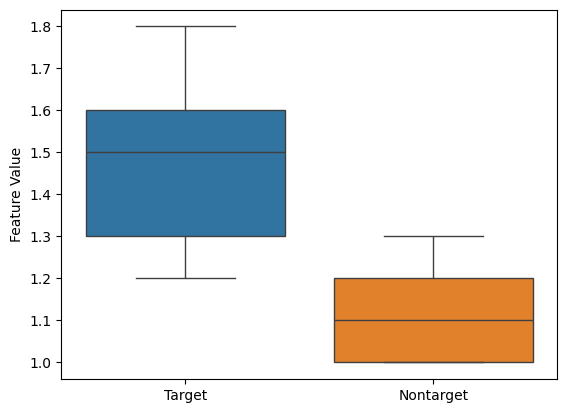

In [445]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 타겟 및 논타겟 트라이얼에서 추출된 특징값들
target_features = np.array([1.2, 1.5, 1.3, 1.6, 1.8])  # 예시 타겟 특징들
nontarget_features = np.array([1.0, 1.1, 1.2, 1.0, 1.3])  # 예시 논타겟 특징들

# 시각화할 때 데이터는 리스트 형식으로 전달되어야 합니다.
sns.boxplot(data=[target_features.tolist(), nontarget_features.tolist()])

# x축에 그룹 레이블 추가
plt.xticks([0, 1], ['Target', 'Nontarget'])
plt.ylabel('Feature Value')
plt.show()

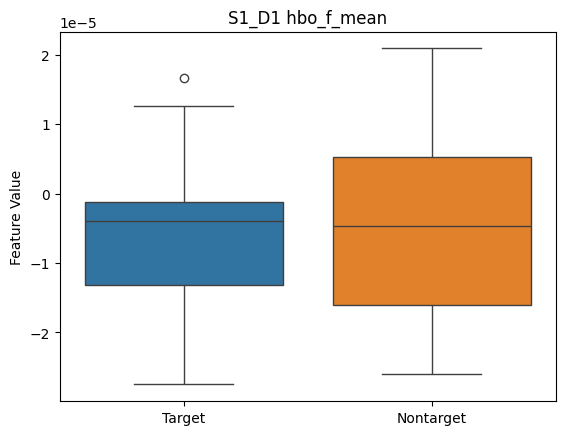

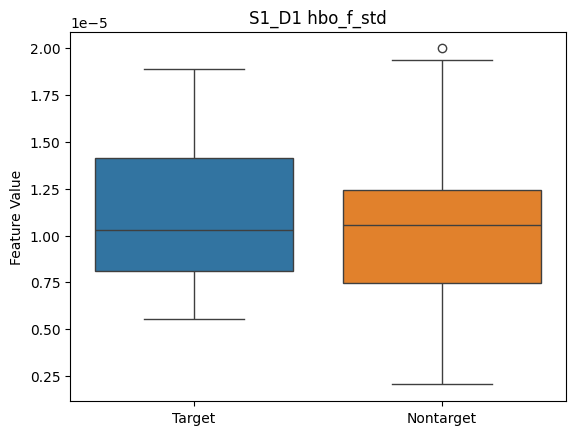

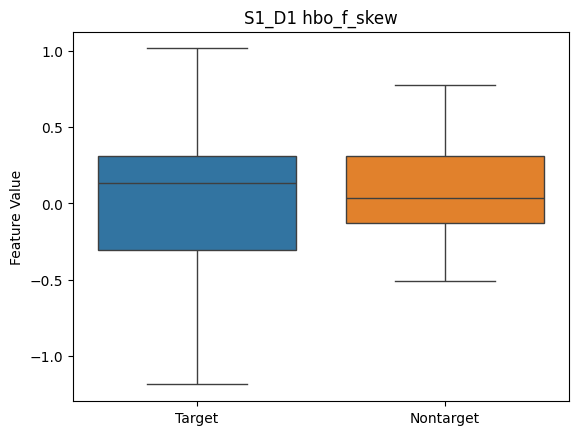

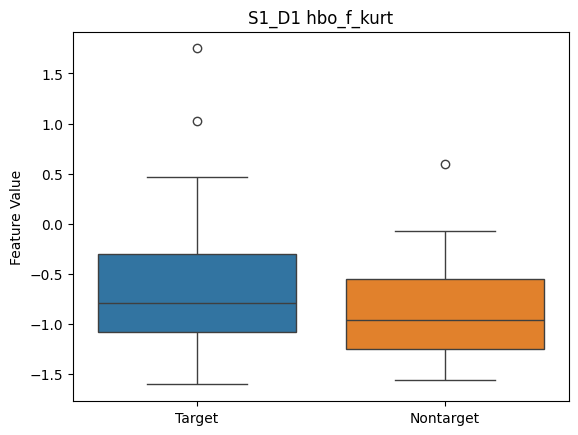

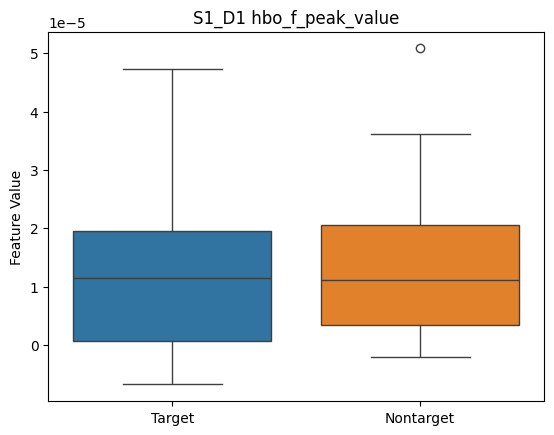

...

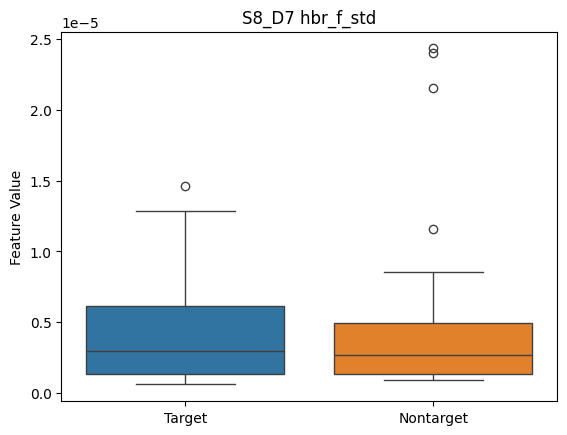

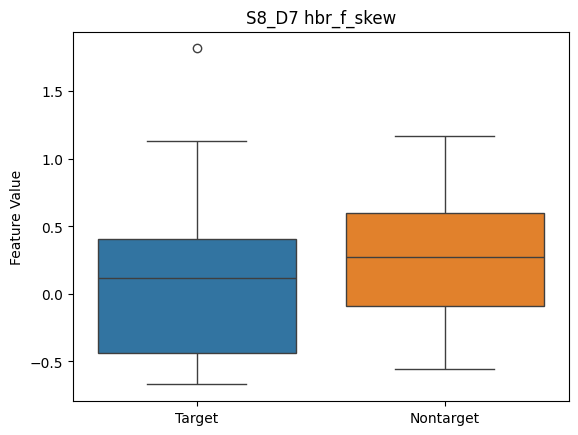

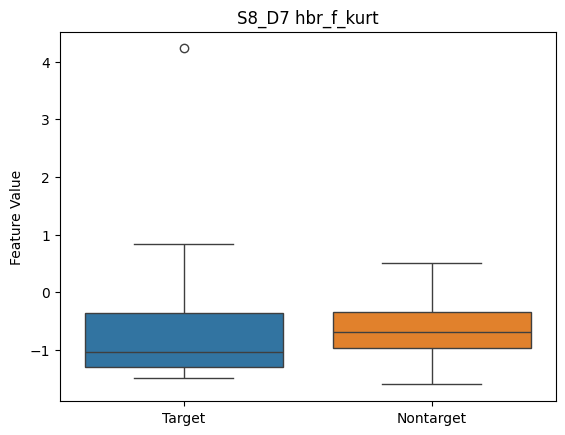

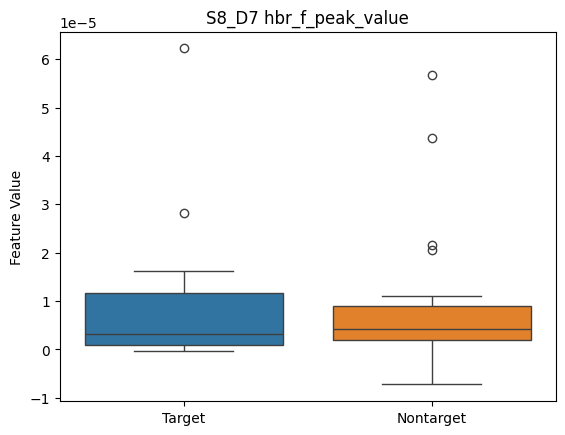

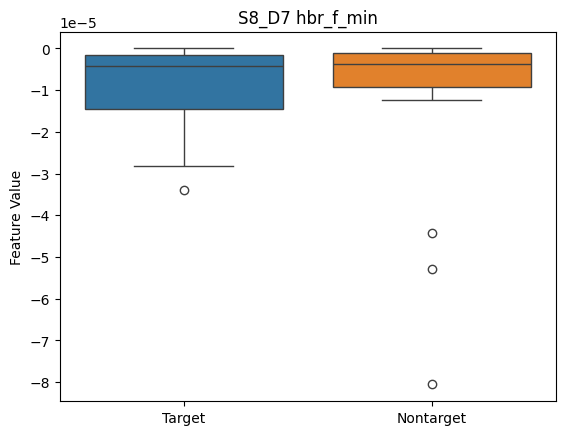

In [446]:
import matplotlib.pyplot as plt
import seaborn as sns

for i in range(len(t_df.columns)):
    sns.boxplot(data=[t_df.iloc[:,i].tolist(), nt_df.iloc[:,i].tolist()])
    plt.title(t_df.columns[i])
    plt.xticks([0, 1], ['Target', 'Nontarget'])
    plt.ylabel('Feature Value')
    plt.show()

In [470]:
nt_df_all = nt_df
t_df_all = t_df

In [471]:
nt_df = nt_df[meaningful_col]
label = np.zeros(len(nt_df))
nt_df['label'] = label

nt_df

,S7_D5 hbo_f_kurt,S4_D2 hbr_f_kurt,S6_D6 hbo_f_skew,S8_D7 hbo_f_kurt
0,-0.866412,-1.251423,0.308648,-1.433392
1,-0.362261,-0.859208,-0.754826,-0.872000
2,-0.077659,-1.017777,-0.606968,-0.646518
3,0.671791,-0.563650,0.387471,-0.920087
4,-0.810997,-0.301233,-0.319908,-0.552380
5,-1.158950,-0.438732,0.264808,0.736998
6,0.441662,-0.172187,-0.435991,0.128153
7,-1.121234,-0.846370,0.092030,2.568560
8,-0.162359,0.189422,-1.870813,-0.337273
9,0.488736,-1.217247,0.527896,-1.084122


In [475]:
label = np.zeros(len(nt_df))
nt_df['label'] = label

nt_df

C:\Users\USER\AppData\Local\Temp\ipykernel_33912\3254194620.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nt_df['label'] = label


,S7_D5 hbo_f_kurt,S4_D2 hbr_f_kurt,S6_D6 hbo_f_skew,S8_D7 hbo_f_kurt,label
0,-0.866412,-1.251423,0.308648,-1.433392,0.0
1,-0.362261,-0.859208,-0.754826,-0.872000,0.0
2,-0.077659,-1.017777,-0.606968,-0.646518,0.0
3,0.671791,-0.563650,0.387471,-0.920087,0.0
4,-0.810997,-0.301233,-0.319908,-0.552380,0.0
5,-1.158950,-0.438732,0.264808,0.736998,0.0
6,0.441662,-0.172187,-0.435991,0.128153,0.0
7,-1.121234,-0.846370,0.092030,2.568560,0.0
8,-0.162359,0.189422,-1.870813,-0.337273,0.0
9,0.488736,-1.217247,0.527896,-1.084122,0.0


In [474]:
t_df = t_df[meaningful_col]
label = np.ones(len(t_df))
t_df['label'] = label

t_df

,S7_D5 hbo_f_kurt,S4_D2 hbr_f_kurt,S6_D6 hbo_f_skew,S8_D7 hbo_f_kurt
0,-0.813710,-0.889092,-0.312197,-1.122112
1,-0.598251,-1.035326,0.017819,-1.066813
2,-0.529554,6.931711,0.147985,-1.054775
3,-1.030614,-0.949627,-0.277766,-1.311736
4,-0.819603,-1.321250,0.212623,-0.582694
5,-1.308599,-0.030593,-0.158158,-1.111449
6,-1.070885,0.833062,2.612361,4.221165
7,-0.607543,-0.872332,-0.086716,-0.806121
8,-1.486434,-1.289457,-0.155762,-1.286331
9,-0.462399,-0.868828,0.745350,1.660192


In [476]:
label = np.ones(len(t_df))
t_df['label'] = label

t_df

C:\Users\USER\AppData\Local\Temp\ipykernel_33912\3792551983.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  t_df['label'] = label


,S7_D5 hbo_f_kurt,S4_D2 hbr_f_kurt,S6_D6 hbo_f_skew,S8_D7 hbo_f_kurt,label
0,-0.813710,-0.889092,-0.312197,-1.122112,1.0
1,-0.598251,-1.035326,0.017819,-1.066813,1.0
2,-0.529554,6.931711,0.147985,-1.054775,1.0
3,-1.030614,-0.949627,-0.277766,-1.311736,1.0
4,-0.819603,-1.321250,0.212623,-0.582694,1.0
5,-1.308599,-0.030593,-0.158158,-1.111449,1.0
6,-1.070885,0.833062,2.612361,4.221165,1.0
7,-0.607543,-0.872332,-0.086716,-0.806121,1.0
8,-1.486434,-1.289457,-0.155762,-1.286331,1.0
9,-0.462399,-0.868828,0.745350,1.660192,1.0


In [477]:
concat_df = pd.concat([nt_df, t_df])

concat_df

,S7_D5 hbo_f_kurt,S4_D2 hbr_f_kurt,S6_D6 hbo_f_skew,S8_D7 hbo_f_kurt,label
0,-0.866412,-1.251423,0.308648,-1.433392,0.0
1,-0.362261,-0.859208,-0.754826,-0.872000,0.0
2,-0.077659,-1.017777,-0.606968,-0.646518,0.0
3,0.671791,-0.563650,0.387471,-0.920087,0.0
4,-0.810997,-0.301233,-0.319908,-0.552380,0.0
5,-1.158950,-0.438732,0.264808,0.736998,0.0
6,0.441662,-0.172187,-0.435991,0.128153,0.0
7,-1.121234,-0.846370,0.092030,2.568560,0.0
8,-0.162359,0.189422,-1.870813,-0.337273,0.0
9,0.488736,-1.217247,0.527896,-1.084122,0.0


# ML model for calssification

In [482]:
Random = 42

In [526]:
# data split

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(concat_df.iloc[:, :-1], concat_df['label'], test_size=0.2, random_state=Random)

print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(32, 4) (8, 4) (32,) (8,)


In [481]:
y_train.value_counts()

label
1.0    17
0.0    15
Name: count, dtype: int64

In [527]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC

rf = RandomForestClassifier(n_estimators=100, random_state=Random)
knn = KNeighborsClassifier(n_neighbors=5)
mlp = MLPClassifier(random_state=Random)
svc = SVC(random_state=Random)

In [535]:
svc.fit(x_train, y_train)

SVC(random_state=42)

Accuracy: 0.875
              precision    recall  f1-score   support

         0.0       1.00      0.80      0.89         5
         1.0       0.75      1.00      0.86         3

    accuracy                           0.88         8
   macro avg       0.88      0.90      0.87         8
weighted avg       0.91      0.88      0.88         8

[[4 1]
 [0 3]]


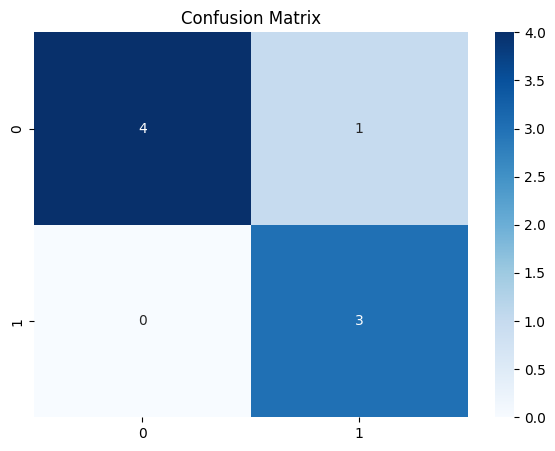

In [537]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_pred = mlp.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)

cm = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
plt.figure(figsize=(7, 5))
plt.title('Confusion Matrix')
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.show()

---------

In [4]:
raw = mne.io.read_raw_snirf("C:/Users/USER/Desktop/fNIRS/nirx_data/2024-04-26/2024-04-26_002/2024-04-26_002.snirf")
raw

Loading C:\Users\USER\Desktop\fNIRS\nirx_data\2024-04-26\2024-04-26_002\2024-04-26_002.snirf


<RawSNIRF | 2024-04-26_002.snirf, 40 x 3860 (379.3 s), ~165 kB, data not loaded>

In [23]:
montage = mne.channels.get_builtin_montages(descriptions=True)
for montage_name, montage_description in montage:
    print(f"{montage_name}: {montage_description}")

standard_1005: Electrodes are named and positioned according to the international 10-05 system (343+3 locations)
standard_1020: Electrodes are named and positioned according to the international 10-20 system (94+3 locations)
standard_alphabetic: Electrodes are named with LETTER-NUMBER combinations (A1, B2, F4, …) (65+3 locations)
standard_postfixed: Electrodes are named according to the international 10-20 system using postfixes for intermediate positions (100+3 locations)
standard_prefixed: Electrodes are named according to the international 10-20 system using prefixes for intermediate positions (74+3 locations)
standard_primed: Electrodes are named according to the international 10-20 system using prime marks (' and '') for intermediate positions (100+3 locations)
biosemi16: BioSemi cap with 16 electrodes (16+3 locations)
biosemi32: BioSemi cap with 32 electrodes (32+3 locations)
biosemi64: BioSemi cap with 64 electrodes (64+3 locations)
biosemi128: BioSemi cap with 128 electrodes (1

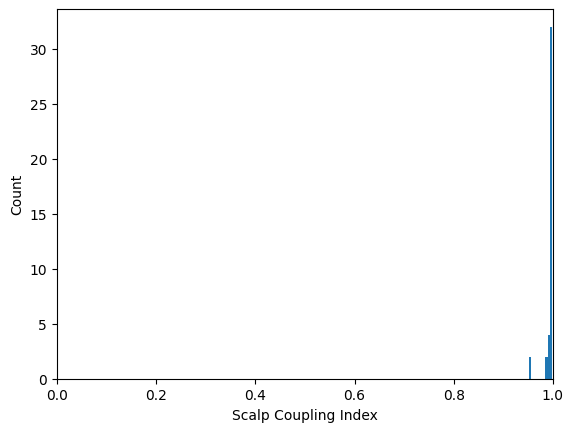

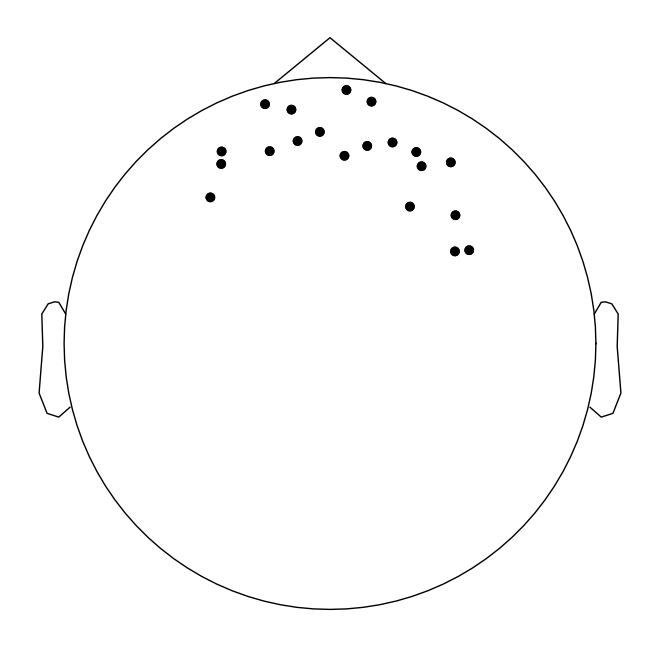

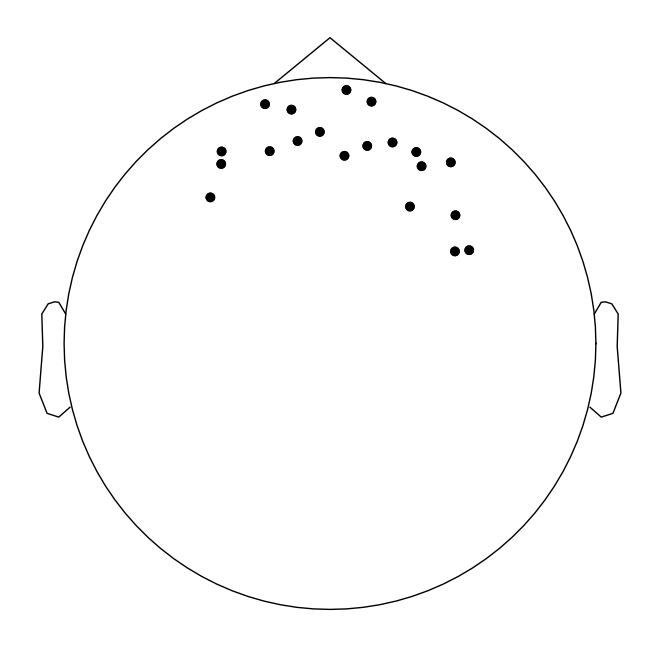

In [24]:
montage = mne.channels.make_standard_montage('artinis-brite23')
raw.set_montage(montage)

# View the position of optodes in 2D to confirm the positions are correct.
raw.plot_sensors()

In [25]:
import os.path as op

subjects_dir = op.join(mne.datasets.sample.data_path(), 'subjects')
mne.datasets.fetch_fsaverage(subjects_dir=subjects_dir)

brain = mne.viz.Brain('fsaverage', subjects_dir=subjects_dir,
                      alpha=0.5, cortex='low_contrast')
brain.add_head()
brain.add_sensors(raw.info, trans='fsaverage')
brain.show_view(azimuth=90, elevation=90, distance=500)

0 files missing from root.txt in C:\Users\USER\mne_data\MNE-sample-data\subjects
0 files missing from bem.txt in C:\Users\USER\mne_data\MNE-sample-data\subjects\fsaverage
Using pyvistaqt 3d backend.

Using fsaverage-head-dense.fif for head surface.
    1 BEM surfaces found
    Reading a surface...
[done]
    1 BEM surfaces read
Channel types::	fnirs_cw_amplitude: 40


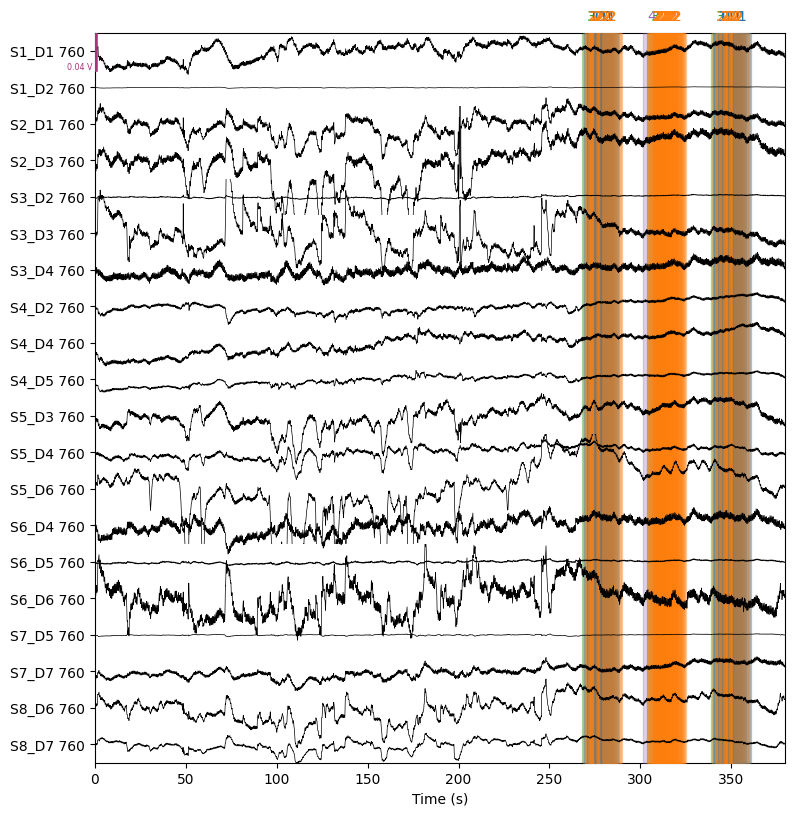

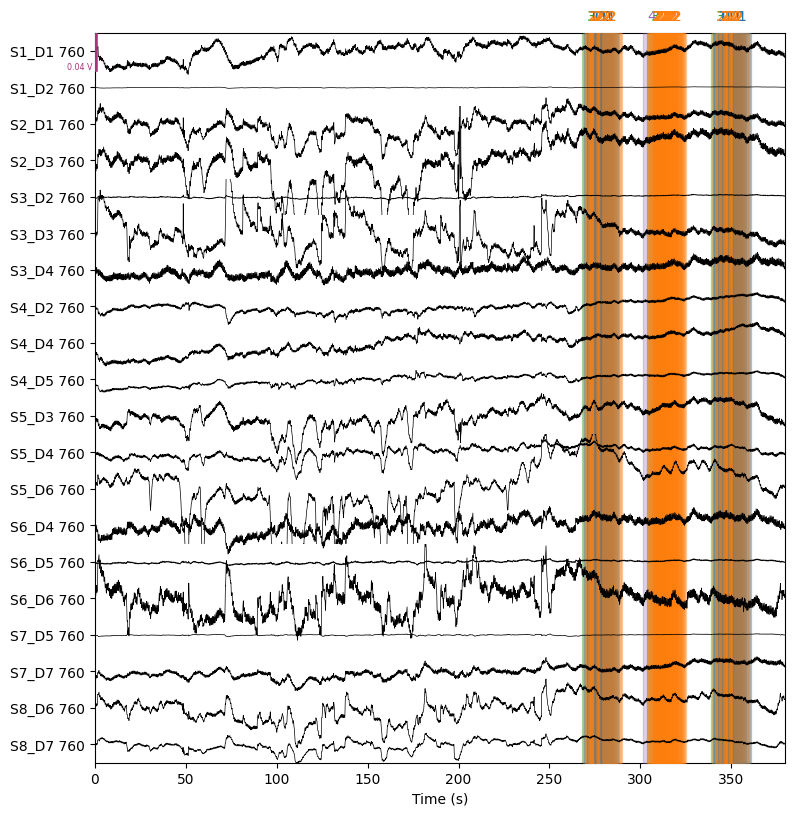

In [26]:
raw.plot(duration=1000, show_scrollbars=False)

In [27]:
optical_density = mne.preprocessing.nirs.optical_density(raw)
optical_density

Reading 0 ... 3859  =      0.000 ...   379.340 secs...


<RawSNIRF | 2024-04-26_002.snirf, 40 x 3860 (379.3 s), ~1.2 MB, data loaded>

In [28]:
beer_lambert_law = mne.preprocessing.nirs.beer_lambert_law(optical_density, ppf=6.0)
beer_lambert_law

<RawSNIRF | 2024-04-26_002.snirf, 40 x 3860 (379.3 s), ~1.2 MB, data loaded>

In [29]:
mne.preprocessing.nirs.scalp_coupling_index(optical_density)

array([0.99342777, 0.96596008, 0.98153446, 0.98744472, 0.98453084,
       0.96639305, 0.99655524, 0.98389231, 0.98466279, 0.98130936,
       0.97913931, 0.98863101, 0.99267781, 0.99574699, 0.99682188,
       0.97755705, 0.98432501, 0.99308072, 0.97300149, 0.98309923,
       0.99342777, 0.96596008, 0.98153446, 0.98744472, 0.98453084,
       0.96639305, 0.99655524, 0.98389231, 0.98466279, 0.98130936,
       0.97913931, 0.98863101, 0.99267781, 0.99574699, 0.99682188,
       0.97755705, 0.98432501, 0.99308072, 0.97300149, 0.98309923])

In [30]:
raw.load_data()

Reading 0 ... 3859  =      0.000 ...   379.340 secs...


<RawSNIRF | 2024-04-26_002.snirf, 40 x 3860 (379.3 s), ~1.2 MB, data loaded>

In [31]:
raw.annotations.set_durations(5)
raw.annotations.rename(
    {"1": "Non-target", "2": "Target"}
)
unwanted = np.nonzero(raw.annotations.description == "15.0")
raw.annotations.delete(unwanted)

In [77]:
subjects_dir = mne.datasets.sample.data_path() / "subjects"

brain = mne.viz.Brain(
    "fsaverage", subjects_dir=subjects_dir, background="w", cortex="0.5"
)
brain.add_sensors(
    raw.info,
    trans="fsaverage",
    fnirs=["channels", "pairs", "sources", "detectors"],
)
brain.show_view(azimuth=20, elevation=60, distance=400)

Channel types::	fnirs_cw_amplitude: 40


C:\Users\USER\AppData\Local\Temp\ipykernel_25140\1437549004.py:6: RuntimeWarning: Got coordinate frame "unknown" for ['S1_D1 760', 'S1_D1 760', 'S1_D1 760', 'S1_D2 760', 'S1_D2 760', 'S1_D2 760', 'S2_D1 760', 'S2_D1 760', 'S2_D1 760', 'S2_D3 760', 'S2_D3 760', 'S2_D3 760', 'S3_D2 760', 'S3_D2 760', 'S3_D2 760', 'S3_D3 760', 'S3_D3 760', 'S3_D3 760', 'S3_D4 760', 'S3_D4 760', 'S3_D4 760', 'S4_D2 760', 'S4_D2 760', 'S4_D2 760', 'S4_D4 760', 'S4_D4 760', 'S4_D4 760', 'S4_D5 760', 'S4_D5 760', 'S4_D5 760', 'S5_D3 760', 'S5_D3 760', 'S5_D3 760', 'S5_D4 760', 'S5_D4 760', 'S5_D4 760', 'S5_D6 760', 'S5_D6 760', 'S5_D6 760', 'S6_D4 760', 'S6_D4 760', 'S6_D4 760', 'S6_D5 760', 'S6_D5 760', 'S6_D5 760', 'S6_D6 760', 'S6_D6 760', 'S6_D6 760', 'S7_D5 760', 'S7_D5 760', 'S7_D5 760', 'S7_D7 760', 'S7_D7 760', 'S7_D7 760', 'S8_D6 760', 'S8_D6 760', 'S8_D6 760', 'S8_D7 760', 'S8_D7 760', 'S8_D7 760', 'S1_D1 850', 'S1_D1 850', 'S1_D1 850', 'S1_D2 850', 'S1_D2 850', 'S1_D2 850', 'S2_D1 850', 'S2_D1 850'

# Analysis (Measured)

Preprocessing

In [5]:
# sphinx_gallery_thumbnail_number = 9

# Authors: Robert Luke <mail@robertluke.net>
#
# License: BSD (3-clause)

import os
import numpy as np
import matplotlib.pyplot as plt

import mne
import mne_nirs

from mne_nirs.experimental_design import make_first_level_design_matrix
from mne_nirs.statistics import run_glm
from mne_nirs.channels import (get_long_channels,
                               get_short_channels,
                               picks_pair_to_idx)

from nilearn.plotting import plot_design_matrix
from itertools import compress

In [253]:
import os
import glob

directory_path = 'C:/Users/USER/Desktop/fNIRS/snirf/'
#'C:/users/USER/Desktop/BCI/ADD_2/' # Your Path
#directory_path = 'C:/Users/USER/Desktop/ADD2_set/set156/' # Your Path

file_list = glob.glob(os.path.join(directory_path, '*.snirf'))

''' for file in file_list:
    print(file) '''

# 파일 경로에서 이니셜 추출
initials = set()

file_name_list = []
for file in file_list:
    # 파일 경로에서 파일 이름 추출
    file_name = os.path.basename(file)
    file_name_list.append(file_name)

# 추출된 이니셜 출력
print(f"이니셜 갯수 :  {len(file_name_list)}개")
''' print("추출된 이니셜:")
for initial in initials:
    print(initial) '''
print(file_name_list)

이니셜 갯수 :  3개
['2024-05-02_001.snirf', '2024-05-23_001.snirf', '2024-05-23_002.snirf']


In [15]:
# lsy
raw = mne.io.read_raw_snirf("C:/Users/USER/Desktop/fNIRS/nirx_data/2024-05-29_018/2024-05-29_018.snirf") #"C:/Users/USER/Desktop/fNIRS/nirx_data/2024-05-02/2024-05-02_001/2024-05-02_001.snirf")
raw

Loading C:\Users\USER\Desktop\fNIRS\nirx_data\2024-05-29_018\2024-05-29_018.snirf


<RawSNIRF | 2024-05-29_018.snirf, 40 x 748 (73.4 s), ~165 kB, data not loaded>

In [236]:
# kjm
raw = mne.io.read_raw_snirf("C:/Users/USER/Desktop/fNIRS/nirx_data/2024-05-21/2024-05-21_001/2024-05-21_001.snirf")
raw

Loading C:\Users\USER\Desktop\fNIRS\nirx_data\2024-05-21\2024-05-21_001\2024-05-21_001.snirf


Measurement date,"May 21, 2024 19:05:06 GMT"
Experimenter,Unknown
Participant,default
Digitized points,300 points
Good channels,40 fNIRS (CW amplitude)
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,10.17 Hz
Highpass,0.00 Hz
Lowpass,5.09 Hz


In [167]:
# hmy
raw = mne.io.read_raw_snirf("C:/Users/USER/Desktop/fNIRS/nirx_data/2024-05-23/2024-05-23_001/2024-05-23_001.snirf")
raw

Loading C:\Users\USER\Desktop\fNIRS\nirx_data\2024-05-23\2024-05-23_001\2024-05-23_001.snirf


Measurement date,"May 23, 2024 10:50:39 GMT"
Experimenter,Unknown
Participant,default
Digitized points,300 points
Good channels,40 fNIRS (CW amplitude)
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,10.17 Hz
Highpass,0.00 Hz
Lowpass,5.09 Hz


In [208]:
# sje
raw = mne.io.read_raw_snirf("C:/Users/USER/Desktop/fNIRS/nirx_data/2024-05-23/2024-05-23_002/2024-05-23_002.snirf")
raw

Loading C:\Users\USER\Desktop\fNIRS\nirx_data\2024-05-23\2024-05-23_002\2024-05-23_002.snirf


Measurement date,"May 23, 2024 12:40:27 GMT"
Experimenter,Unknown
Participant,default
Digitized points,300 points
Good channels,40 fNIRS (CW amplitude)
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,10.17 Hz
Highpass,0.00 Hz
Lowpass,5.09 Hz


In [237]:
raw.resample(10)

Measurement date,"May 21, 2024 19:05:06 GMT"
Experimenter,Unknown
Participant,default
Digitized points,300 points
Good channels,40 fNIRS (CW amplitude)
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,10.00 Hz
Highpass,0.00 Hz
Lowpass,5.00 Hz


In [169]:
raw.annotations

<Annotations | 212 segments: 1 (31), 10 (5), 11 (5), 2 (169), 4 (2)>

In [77]:
raw.annotations.rename({'1': 'Target', '2': 'Non-target', '10': 'TNon-target_session', '11': 'Target_session'})
#raw.annotations.delete(raw.annotations.description == '15.0')
#raw.annotations.set_durations(5)

<Annotations | 213 segments: 4 (3), Non-target (169), TNon-target_session ...>

In [8]:
raw.annotations.rename({'1': 'Target', '2': 'Non-target'})
raw.annotations.delete(raw.annotations.description == '3')
raw.annotations.delete(raw.annotations.description == '4')
#raw.annotations.set_durations(5)

ValueError: Invalid Annotation description(s) {'1', '2'} are not present in data

In [36]:
raw.annotations.set_durations(5)

<Annotations | 213 segments: 4 (3), Non-target (169), Non-target_session ...>

In [45]:
raw_od = mne.preprocessing.nirs.optical_density(raw)
raw_haemo = mne.preprocessing.nirs.beer_lambert_law(raw_od, ppf=0.1)

Reading 0 ... 747  =      0.000 ...    73.430 secs...


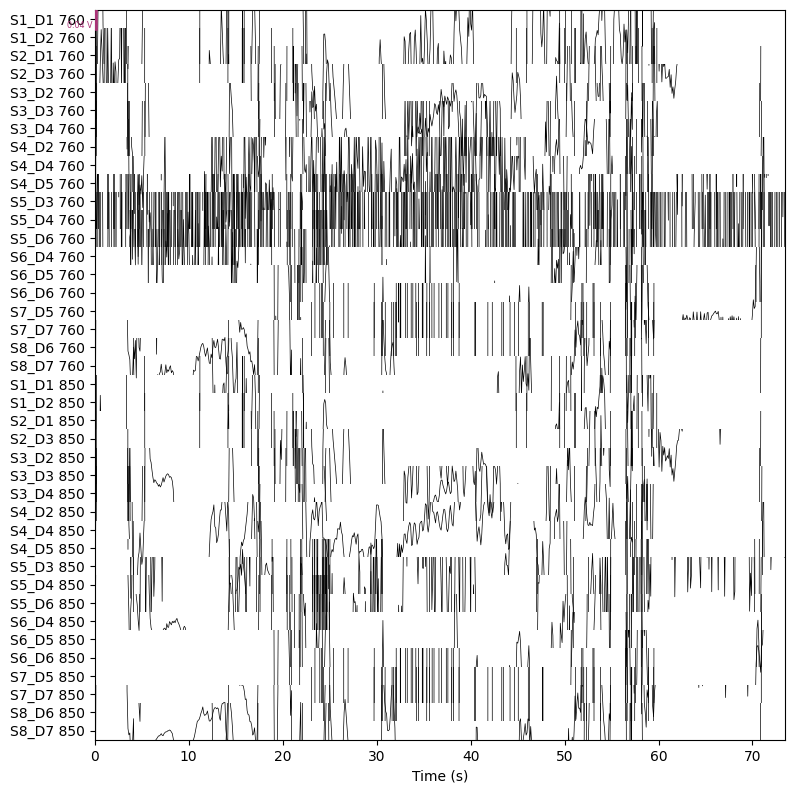

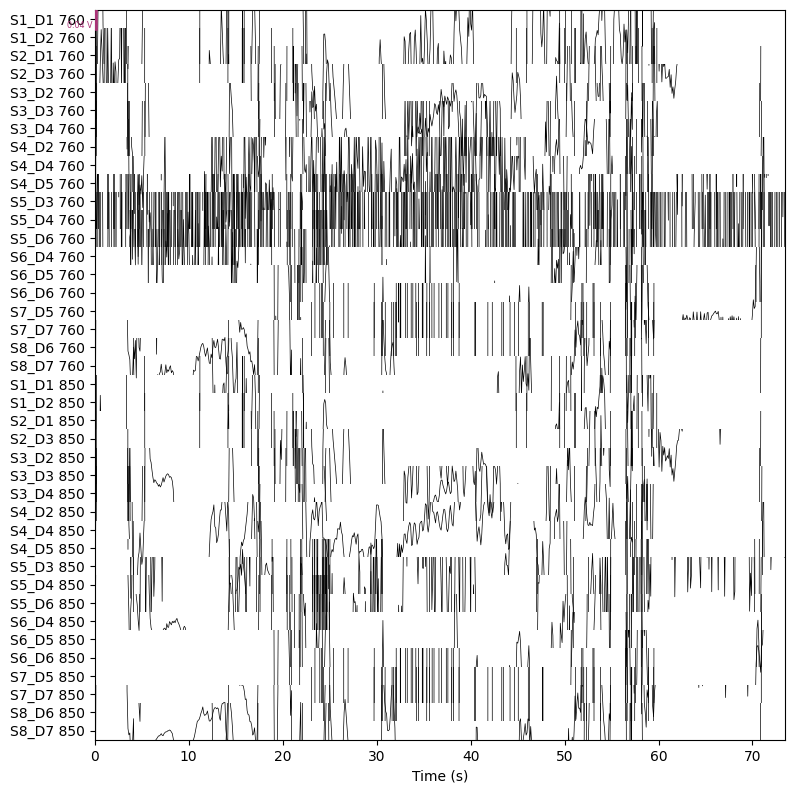

In [374]:
raw_od = mne.preprocessing.nirs.optical_density(raw)
raw_od.plot(n_channels=len(raw_od.ch_names),
            duration=500, show_scrollbars=False)

In [375]:
sci = mne.preprocessing.nirs.scalp_coupling_index(raw_od)
fig, ax = plt.subplots()
ax.hist(sci)
ax.set(xlabel='Scalp Coupling Index', ylabel='Count', xlim=[0, 1])

[Text(0.5, 0, 'Scalp Coupling Index'), Text(0, 0.5, 'Count'), (0.0, 1.0)]

In [240]:
raw_od.info['bads'] = list(compress(raw_od.ch_names, sci < 0.5))

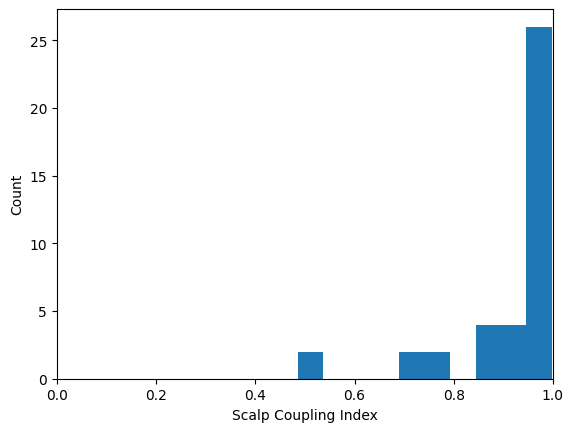

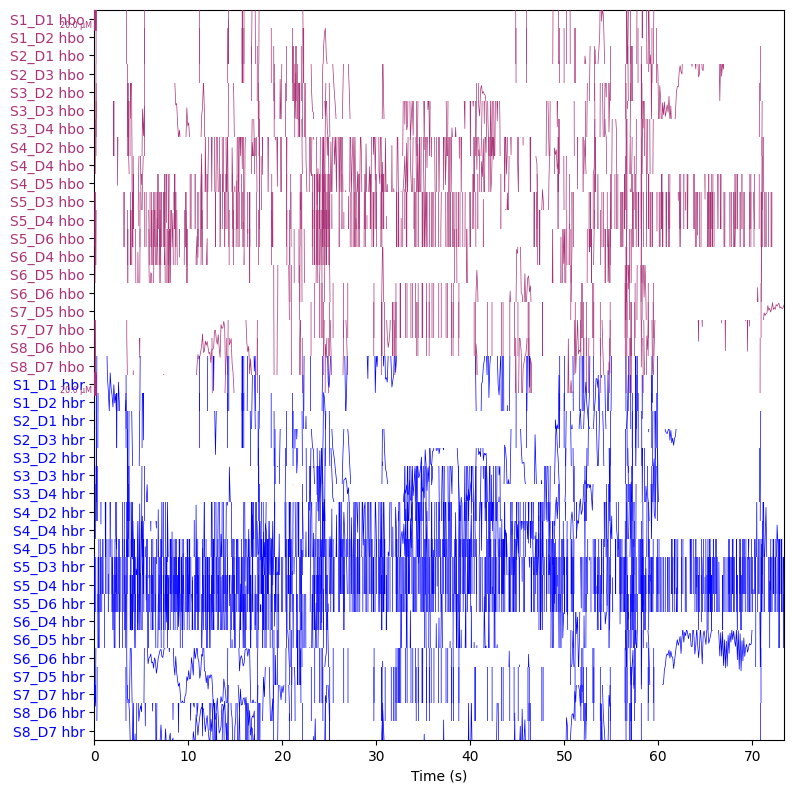

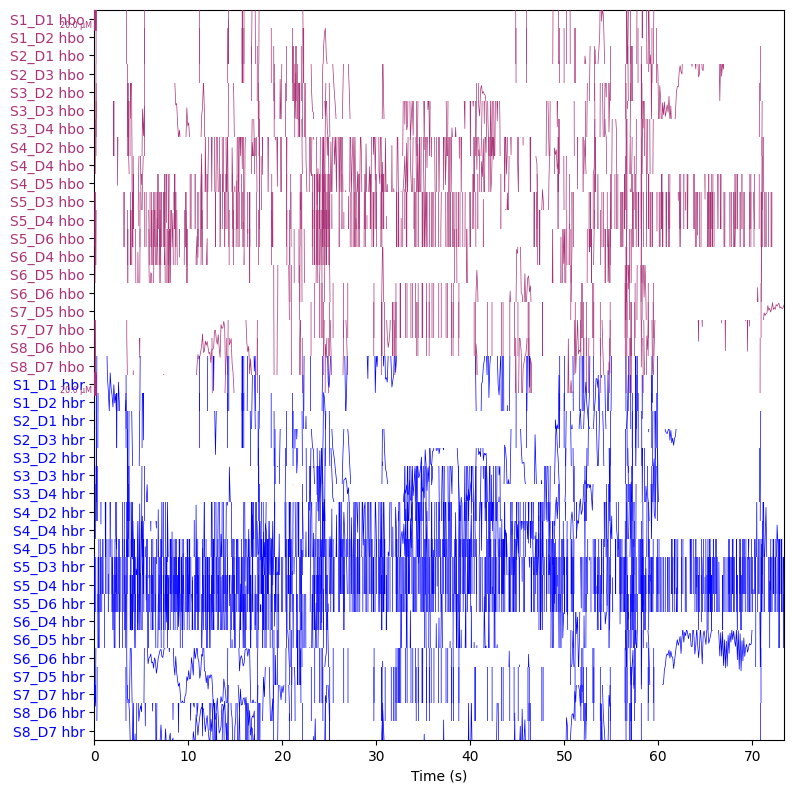

In [376]:
raw_haemo = mne.preprocessing.nirs.beer_lambert_law(raw_od, ppf=0.1)
raw_haemo.plot(n_channels=len(raw_haemo.ch_names),
               duration=600, show_scrollbars=False)

In [377]:
fig = raw_haemo.plot_psd(average=True)
#fig.suptitle('Before filtering', weight='bold', size='x-large')
raw_haemo = raw_haemo.filter(0, 0.2, h_trans_bandwidth=0.2)
# raw_haemo = raw_haemo.filter(0.05, 0.7, h_trans_bandwidth=0.2,
#                              l_trans_bandwidth=0.02)
fig = raw_haemo.compute_psd().plot(average=True)
#fig.suptitle('After filtering', weight='bold', size='x-large')

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 73.528 (s)
Plotting power spectral density (dB=True).
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 0.20 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.30 Hz)
- Filter length: 169 samples (16.613 s)

Effective window size : 73.528 (s)
Plotting power spectral density (dB=True).


C:\Users\USER\AppData\Local\Temp\ipykernel_27836\3767705037.py:1: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  fig = raw_haemo.plot_psd(average=True)
C:\Users\USER\anaconda3\envs\dl48\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
C:\Users\USER\AppData\Local\Temp\ipykernel_27836\3767705037.py:6: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  fig = raw_haemo.compute_psd().plot(average=True)
C:\Users\USER\anaconda3\envs\dl48\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


In [384]:
events, event_dict = mne.events_from_annotations(raw_haemo)
fig = mne.viz.plot_events(events, event_id=event_dict,
                          sfreq=raw_haemo.info['sfreq'])

ValueError: No events in events array, cannot plot.

In [191]:
#short_chs = get_short_channels(raw_haemo)
raw_haemo = get_long_channels(raw_haemo)

In [382]:
print(events)
#mne.viz.plot_events(events, event_id=event_dict, sfreq=raw_haemo.info['sfreq'])

[[  72    0    3]
 [  77    0    4]
 [  82    0    4]
 [  87    0    4]
 [  93    0    4]
 [ 100    0    4]
 [ 106    0    1]
 [ 112    0    1]
 [ 118    0    1]
 [ 124    0    4]
 [ 130    0    4]
 [ 136    0    1]
 [ 142    0    1]
 [ 147    0    1]
 [ 153    0    1]
 [ 160    0    4]
 [ 166    0    4]
 [ 172    0    4]
 [ 178    0    4]
 [ 184    0    4]
 [ 190    0    4]
 [ 407    0    5]
 [ 427    0    2]
 [ 432    0    4]
 [ 437    0    4]
 [ 442    0    4]
 [ 449    0    4]
 [ 455    0    4]
 [ 461    0    4]
 [ 467    0    4]
 [ 473    0    4]
 [ 479    0    4]
 [ 485    0    4]
 [ 491    0    4]
 [ 496    0    4]
 [ 502    0    4]
 [ 509    0    4]
 [ 515    0    4]
 [ 521    0    4]
 [ 527    0    4]
 [ 533    0    4]
 [ 539    0    4]
 [ 545    0    4]
 [ 782    0    2]
 [ 786    0    4]
 [ 791    0    4]
 [ 798    0    4]
 [ 804    0    4]
 [ 810    0    4]
 [ 816    0    4]
 [ 822    0    4]
 [ 828    0    4]
 [ 834    0    4]
 [ 840    0    4]
 [ 845    0    4]
 [ 851    

In [383]:
event_dict

{'1': 1, '10': 2, '11': 3, '2': 4, '4': 5}

In [381]:
epochs = mne.Epochs(raw_haemo, events, event_id={'Non-target': 2, 'Target': 3},
                    tmin=-0.5, tmax=35.5, reject_by_annotation=True,
                    proj=True, baseline=(-0.5, 2), preload=True,
                    detrend=None, verbose=True)
epochs.plot_drop_log()

RuntimeError: No usable annotations found in the raw object. Either `events` must be provided or the raw object must have annotations to construct epochs

In [205]:
epochs[1]

Number of events,1
Events,Non-target: 1
Time range,-0.500 – 35.500 s
Baseline,-0.500 – 2.000 s


Not setting metadata
5 matching events found
No baseline correction applied
0 projection items activated


Not setting metadata
5 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"
combining channels using "mean"


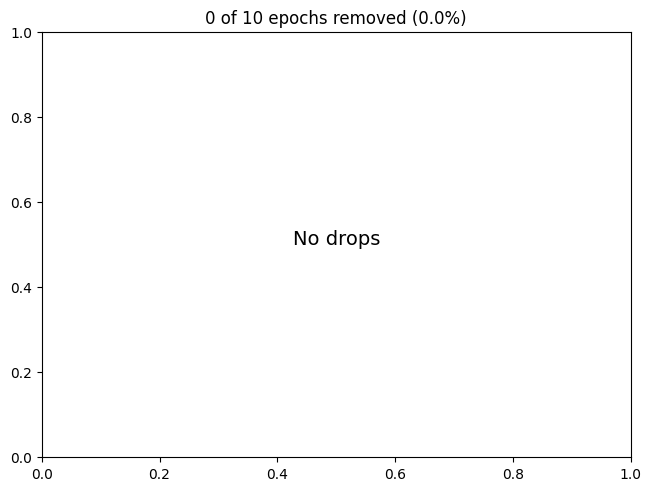

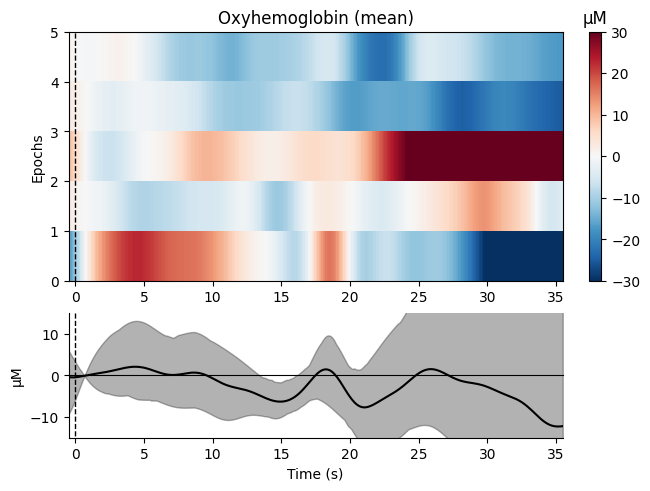

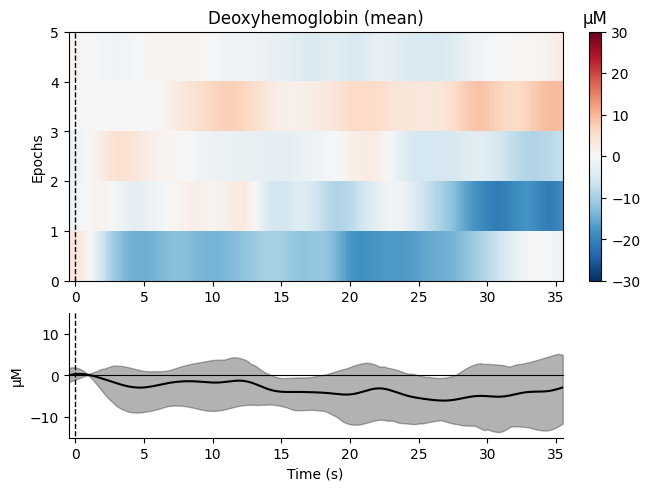

[<Figure size 640x480 with 3 Axes>, <Figure size 640x480 with 3 Axes>]

In [107]:
epochs['Target'].plot_image(combine='mean', vmin=-30, vmax=30,
                             ts_args=dict(ylim=dict(hbo=[-15, 15],
                                                    hbr=[-15, 15])))

Not setting metadata
5 matching events found
No baseline correction applied


0 projection items activated
Not setting metadata
5 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"
combining channels using "mean"


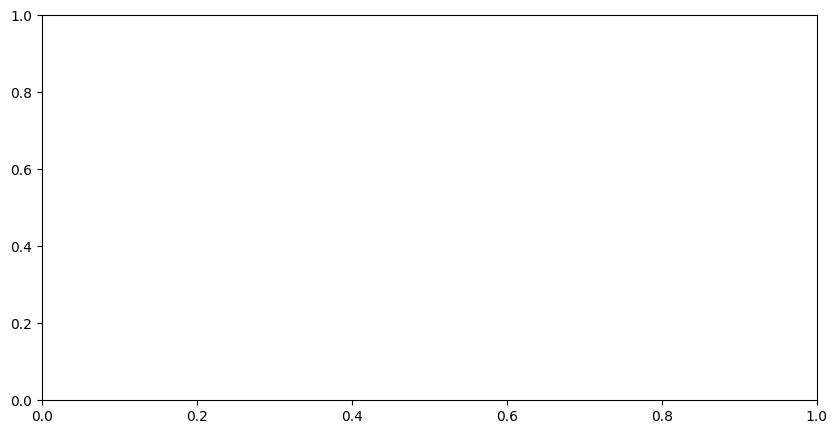

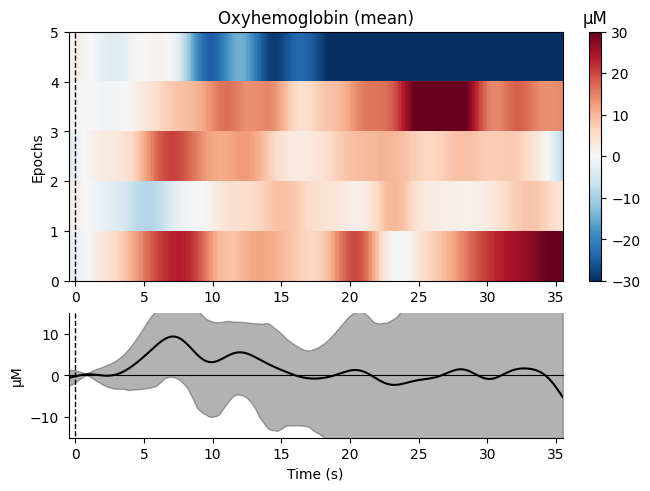

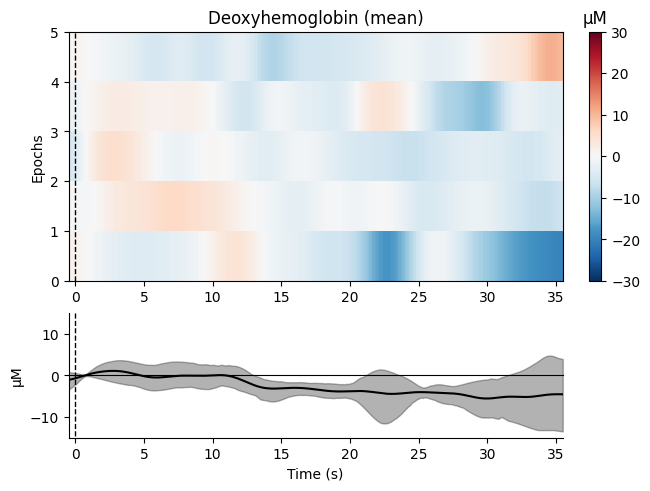

[<Figure size 640x480 with 3 Axes>, <Figure size 640x480 with 3 Axes>]

In [36]:
epochs['Non-target'].plot_image(combine='mean', vmin=-30, vmax=30,
                             ts_args=dict(ylim=dict(hbo=[-15, 15],
                                                    hbr=[-15, 15])))

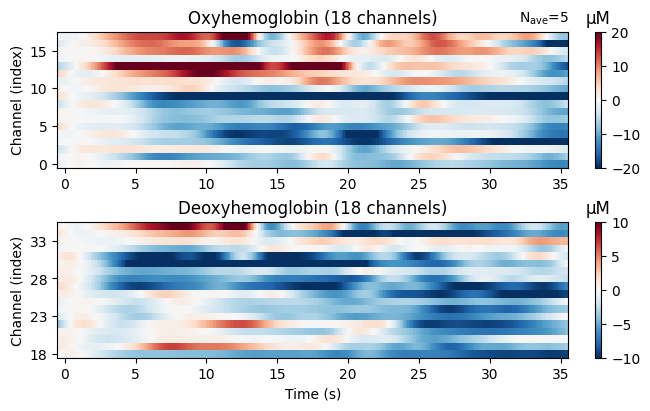

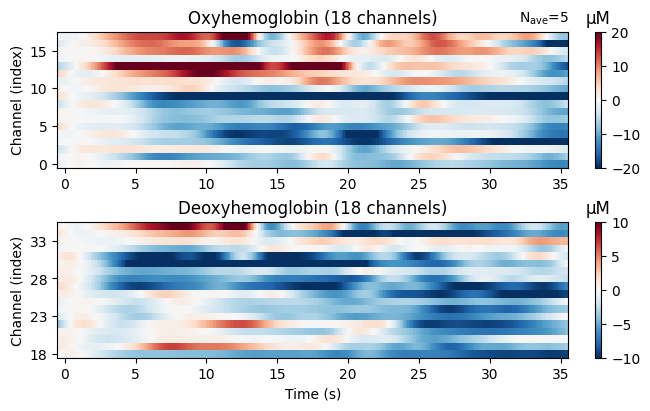

In [37]:
target_epochs = epochs['Target']
mean_epochs = target_epochs.average()

clims = dict(hbo=[-20, 20], hbr=[-10, 10])
mean_epochs.plot_image(clim=clims)


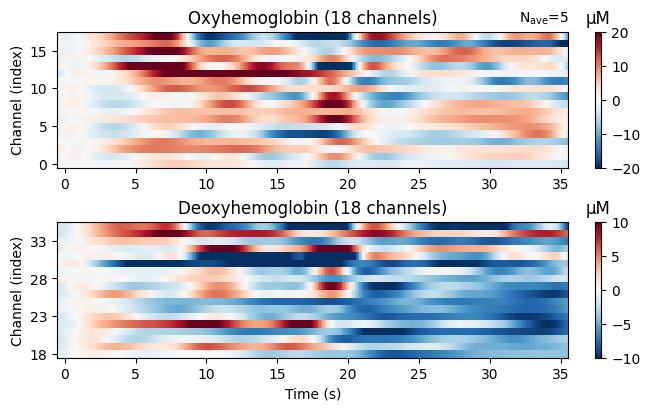

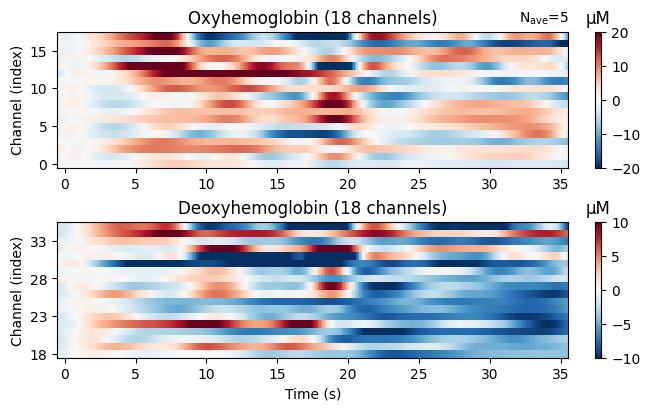

In [38]:
non_target_epochs = epochs['Non-target']
mean_epochs = non_target_epochs.average()

clims = dict(hbo=[-20, 20], hbr=[-10, 10])
mean_epochs.plot_image(clim=clims)


combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


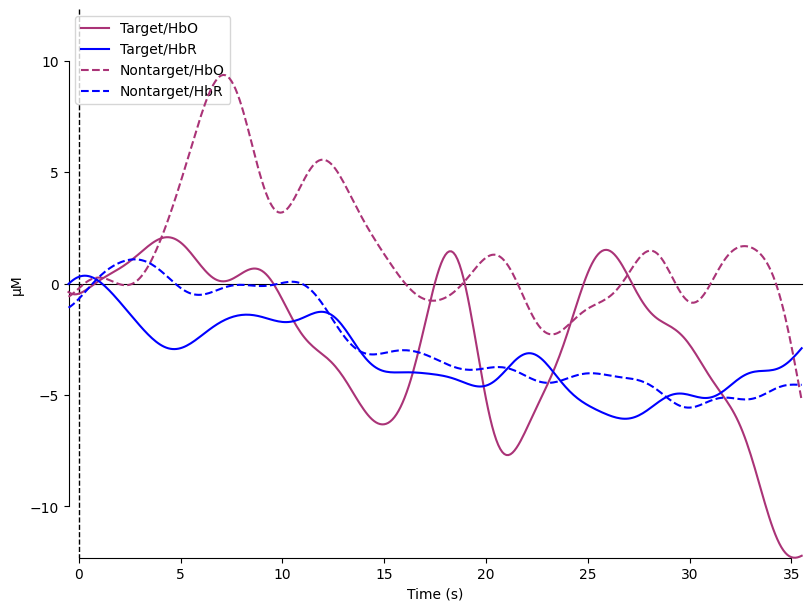

[<Figure size 800x600 with 1 Axes>]

In [39]:
evoked_dict = {
    "Target/HbO": epochs["Target"].average(picks="hbo"),
    "Target/HbR": epochs["Target"].average(picks="hbr"),
    "Nontarget/HbO": epochs["Non-target"].average(picks="hbo"),
    "Nontarget/HbR": epochs["Non-target"].average(picks="hbr"),
}

# Rename channels until the encoding of frequency in ch_name is fixed
for condition in evoked_dict:
    evoked_dict[condition].rename_channels(lambda x: x[:-4])

color_dict = dict(HbO="#AA3377", HbR="b")
styles_dict = dict(Nontarget=dict(linestyle="dashed"))

mne.viz.plot_compare_evokeds(
    evoked_dict, combine="mean", ci=0.95, colors=color_dict, styles=styles_dict
)

In [397]:
leg_lines = [line for line in axes.lines if line.get_c() == 'b'][:1]

In [398]:
leg_lines

In [432]:
evoked_target = epochs["Target"].average(picks=['S1_D1 hbo'])

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.


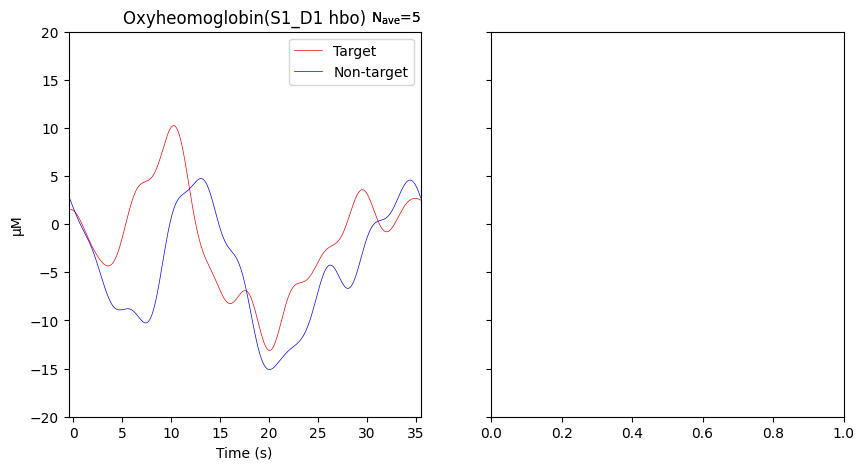

In [54]:
import matplotlib.pyplot as plt
import mne

ch_name = 'S1_D1 hbo'

evoked_target = epochs["Target"].average(picks=ch_name)
evoked_nontarget = epochs["Non-target"].average(picks=ch_name)

fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
evoked_target.plot(axes=axes[0], spatial_colors=False, gfp=False, ylim=dict(hbo=[-20, 20], hbr=[-20, 20]), show=False)
evoked_nontarget.plot(axes=axes[0], spatial_colors=True, gfp=False, ylim=dict(hbo=[-20, 20], hbr=[-20, 20]), show=False)

axes[0].set_title(f'Oxyheomoglobin({ch_name})')

lines = axes[0].get_lines()
lines[0].set_color('r') 
lines[1].set_color('b') 

axes[0].legend(['Target', 'Non-target'], loc='upper right')

plt.show()


In [624]:
len(ci[0])

361

In [738]:
for i in range(361):
    print(channel_means[0][i] - ci[0][i], channel_means[0][i] + ci[0][i])

-9.362167677455124e-07 9.080413480894692e-07
-5.313937557470065e-07 5.772881961658508e-07
-1.5398523313058197e-07 2.2807694236148887e-07
-1.687000515178341e-07 2.2350235674909757e-07
-5.626545387182456e-07 5.485530571075272e-07
-9.820580698582194e-07 8.49546516243946e-07
-1.42156699970799e-06 1.1225606561085001e-06
-1.8801575113573877e-06 1.3673826588657594e-06
-2.356540444142788e-06 1.5852450504850187e-06
-2.849187515452532e-06 1.777995823817155e-06
-3.3563448871528567e-06 1.9486614054780706e-06
-3.877448599950877e-06 2.1001061453230433e-06
-4.411418344080812e-06 2.2357064460254605e-06
-4.956894983225703e-06 2.3591288793444686e-06
-5.512955926864818e-06 2.474479739085875e-06
-6.078516237083124e-06 2.5852402449098427e-06
-6.6514508277084094e-06 2.694565797305212e-06
-7.229936911582116e-06 2.8050381339859213e-06
-7.812279369099295e-06 2.9191120812683767e-06
-8.396776315251931e-06 3.0377704399981097e-06
-8.980956615527722e-06 3.1617000083082554e-06
-9.562956799825695e-06 3.29165251413016

In [762]:
len(u)

361

# Using a MNE-fNIRS

Need more than one channel to make topography for hbo. Disabling interactivity.


Need more than one channel to make topography for hbr. Disabling interactivity.


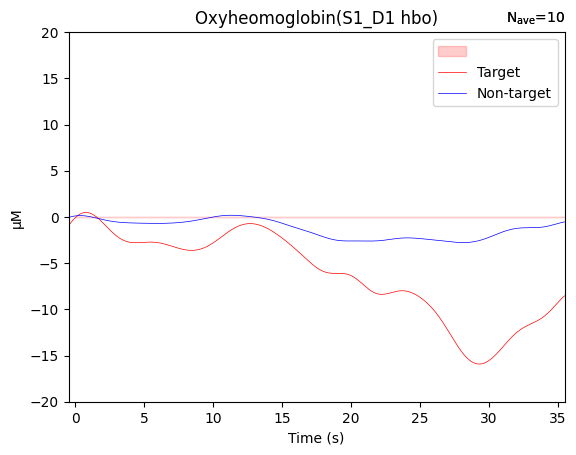

In [380]:
import numpy as np
import matplotlib.pyplot as plt

ch_name = 'S1_D1 hbo'

evoked_target = epochs.average(picks='S1_D1 hbo')
evoked_nontarget = epochs.average(picks='S1_D1 hbr')

# 각 에포크를 동일한 그림에 나타내기
#fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
fig, axes = plt.subplots(nrows=1, ncols=1)

# Target 에포크의 데이터 추출
target_data = epochs["Target"].get_data(picks=ch_name)

# 각 채널에 대한 평균과 표준 편차 계산
channel_means = np.mean(target_data, axis=0)  # 채널별 평균
channel_stds = np.std(target_data, axis=0)    # 채널별 표준 편차

sampling_frequency = epochs.info['sfreq']  # 샘플링 주파수
time_interval = 1 / sampling_frequency  # 시간 간격

# 시간 배열 생성
times = np.arange(target_data.shape[2]) * time_interval

# 표준 편차에 따라 신뢰 구간 계산
ci = 1.96 * channel_stds / np.sqrt(target_data.shape[0])  # 95% 신뢰 구간 계산

u, v = [], []

# for i in range(361):
#     print(i)
#     u.append(channel_means[0][i] - ci[0][i])
#     v.append(channel_means[0][i] + ci[0][i])
#     axes[0].fill_between(times, channel_means[i] - ci[0][i], channel_means[i] + ci[0][i], color='blue', alpha=0.2)  # 신뢰 구간 채우기
#     #axes[0].fill_between(times, channel_means[i] - ci[0][i], channel_means[i] + ci[0][i], color='red', alpha=0.2)  # 신뢰 구간 채우기
#     #print(channel_means[0][i] - ci[0][i], channel_means[0][i] + ci[0][i])

#axes[0].fill_between(times, u, v, color='r', alpha=0.2)  # 신뢰 구간 채우기

axes.fill_between(times, channel_means[0] - ci[0][0], channel_means[0] + ci[0][0], color='red', alpha=0.2)

evoked_target.plot(axes=axes, spatial_colors=False, gfp=False, ylim=dict(hbo=[-20, 20], hbr=[-20, 20]), show=False)
evoked_nontarget.plot(axes=axes, spatial_colors=False, gfp=False, ylim=dict(hbo=[-20, 20], hbr=[-20, 20]), show=False)

lines = axes.get_lines()
lines[0].set_color('r') 
lines[1].set_color('b') 

# 각 그림에 범례와 제목 표시
axes.set_title(f'Oxyheomoglobin({ch_name})')
axes.legend(['', 'Target', 'Non-target'], loc='upper right')

#axes[0].fill_between(times, channel_means - ci, channel_means + ci, color='blue', alpha=0.2)  # 신뢰 구간 채우기

plt.show()

In [1018]:

sampling_frequency = epochs.info['sfreq']  # 샘플링 주파수
time_interval = 1 / sampling_frequency  # 시간 간격

# 시간 배열 생성
times = np.arange(target_data.shape[2]) * time_interval

In [1130]:
channel_stds.shape

(1, 361)

In [1161]:
np.std(target_data[:,:, 0], axis=0)

array([4.5745207e-06])

In [1200]:
confidence_level = 0.95  # 95% 신뢰 구간
critical_value = 1.96  # 정규 분포에 대응하는 값
ci = critical_value * np.array(channel_stds) / np.sqrt(target_data.shape[0])
ci

array([4.00974418e-06, 3.76379154e-06, 3.51548816e-06, 3.26535815e-06,
       3.01371127e-06, 2.76047953e-06, 2.50575411e-06, 2.24994868e-06,
       1.99396777e-06, 1.74032506e-06, 1.49487053e-06, 1.26911545e-06,
       1.08547722e-06, 9.81141802e-07, 9.95663671e-07, 1.13704891e-06,
       1.37619821e-06, 1.67883546e-06, 2.02172111e-06, 2.39045659e-06,
       2.77576146e-06, 3.17175163e-06, 3.57387607e-06, 3.97821751e-06,
       4.38207406e-06, 4.78325623e-06, 5.18008721e-06, 5.57122797e-06,
       5.95635246e-06, 6.33563587e-06, 6.70913692e-06, 7.07763566e-06,
       7.44218598e-06, 7.80383083e-06, 8.16354457e-06, 8.52267980e-06,
       8.88220099e-06, 9.24254320e-06, 9.60378208e-06, 9.96582437e-06,
       1.03278702e-05, 1.06889829e-05, 1.10486980e-05, 1.14058930e-05,
       1.17591919e-05, 1.21074396e-05, 1.24494044e-05, 1.27836790e-05,
       1.31089842e-05, 1.34249612e-05, 1.37310092e-05, 1.40262580e-05,
       1.43099773e-05, 1.45815077e-05, 1.48394605e-05, 1.50830577e-05,
      

In [1210]:
channel_means

[1.4712452261444798e-06,
 1.5082801561819237e-06,
 1.522378790587955e-06,
 1.5127340885881332e-06,
 1.4782821951671423e-06,
 1.4190771591653647e-06,
 1.3358297641727563e-06,
 1.2289455097266874e-06,
 1.0996852391436167e-06,
 9.497370901548131e-07,
 7.814911951351086e-07,
 5.966617086585846e-07,
 3.974769869448253e-07,
 1.8644988403188408e-07,
 -3.390515791696985e-08,
 -2.613050601141392e-07,
 -4.931095792290978e-07,
 -7.271164528255961e-07,
 -9.612507079429573e-07,
 -1.1941700016544099e-06,
 -1.424295367637232e-06,
 -1.6503192068752628e-06,
 -1.8709454345613093e-06,
 -2.0854788689785693e-06,
 -2.293085455936601e-06,
 -2.493293700131083e-06,
 -2.686192453835454e-06,
 -2.871562128388248e-06,
 -3.0490802570665654e-06,
 -3.218237967740344e-06,
 -3.378788848116581e-06,
 -3.5302677030301363e-06,
 -3.671948175194473e-06,
 -3.803629716797093e-06,
 -3.924401168609302e-06,
 -4.032621599560849e-06,
 -4.126959958418463e-06,
 -4.205721801990676e-06,
 -4.267327424971466e-06,
 -4.309881737242695e-06,

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.


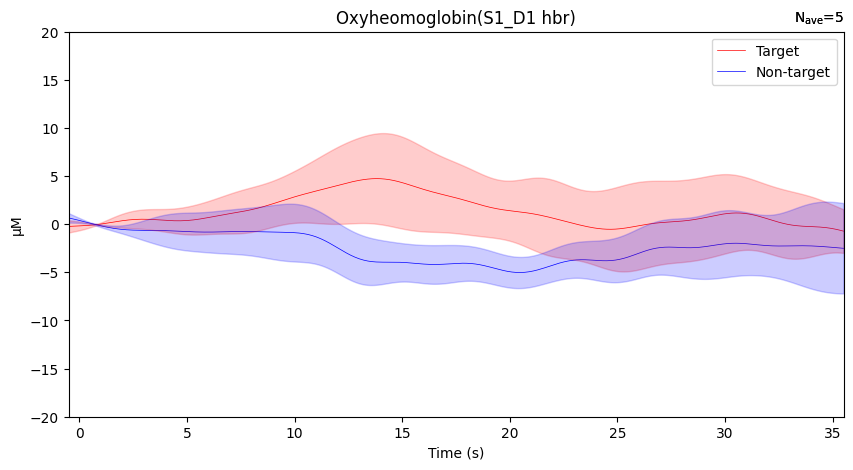

In [165]:
import numpy as np
import matplotlib.pyplot as plt

ch_name = 'S1_D1 hbr'

evoked_target = epochs["Target"].average(picks=ch_name)
evoked_nontarget = epochs["Non-target"].average(picks=ch_name)

# 각 에포크를 동일한 그림에 나타내기
fig, axes = plt.subplots(1, 1, figsize=(10, 5), sharey=True)

# extract epochs
target_data = epochs["Target"].get_data(picks=ch_name)
nontarget_data = epochs["Non-target"].get_data(picks=ch_name)

sampling_frequency = epochs.info['sfreq']  # 샘플링 주파수
time_interval = 1 / sampling_frequency  # 시간 간격

# 시간 배열 생성
times = np.arange(target_data.shape[2]) * time_interval

# 각 채널에 대한 평균과 표준 편차 계산  
channel_means_t, channel_stds_t = [], []

for i in range(len(times)):
    means_timepoint_t = np.mean(target_data[:, :, i])
    channel_means_t.append(means_timepoint_t)

    stds_timepoint_t = np.std(target_data[:, :, i])
    channel_stds_t.append(stds_timepoint_t)

ci_t = 1.645 * np.array(channel_stds_t) / np.sqrt(target_data.shape[0])

channel_means_n, channel_stds_n = [], []

for i in range(len(times)):
    means_timepoint_n = np.mean(nontarget_data[:, :, i])
    channel_means_n.append(means_timepoint_n)

    stds_timepoint_n = np.std(nontarget_data[:, :, i])
    channel_stds_n.append(stds_timepoint_n)

ci_n = 1.645 * np.array(channel_stds_n) / np.sqrt(nontarget_data.shape[0])

# for i in range(len(channel_means)):
#     axes.fill_between(times-0.5, (channel_means[i] - ci)*1000000, (channel_means[i] + ci)*1000000, alpha=0.3)


evoked_target.plot(axes=axes, spatial_colors=False, gfp=False, ylim=dict(hbo=[-30, 30], hbr=[-20, 20]), show=False)
evoked_nontarget.plot(axes=axes, spatial_colors=False, gfp=False, ylim=dict(hbo=[-30, 30], hbr=[-20, 20]), show=False)

lines = axes.get_lines()
lines[0].set_color('r') 
lines[1].set_color('b') 

axes.fill_between(times-0.5, (np.array(channel_means_t) - ci_t)*1000000, (np.array(channel_means_t) + ci_t)*1000000, color='r', alpha=0.2)
axes.fill_between(times-0.5, (np.array(channel_means_n) - ci_n)*1000000, (np.array(channel_means_n) + ci_n)*1000000, color='b', alpha=0.2)

# 각 그림에 범례와 제목 표시
axes.set_title(f'Oxyheomoglobin({ch_name})')
#axes.legend(['T_std', 'NT_std', 'Target', 'Non-target'], loc='upper right')
legend_labels = ['Target', 'Non-target', 'T_std', 'NT_std']
axes.legend([legend_labels[0], legend_labels[1]], loc='upper right')

plt.show()


In [378]:
from mne.preprocessing import peak_finder

evoked_target = epochs["Target"].average(picks='S1_D1 hbo')
evoked_target = evoked_target.get_data()[0]
peak_locs, peak_mags = peak_finder(evoked_target) 

Found 4 significant peaks


In [1059]:
timee = np.expand_dims(times, axis=0)

In [1061]:
timee.shape

(1, 361)

In [1066]:
t_data.shape

(41, 361)

In [261]:
epep = epochs["Target"].get_data()

C:\Users\USER\AppData\Local\Temp\ipykernel_27836\807762091.py:1: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  epep = epochs["Target"].get_data()


In [257]:
eee = epochs.get_data()

C:\Users\USER\AppData\Local\Temp\ipykernel_27836\3083723633.py:1: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  eee = epochs.get_data()


In [370]:
import os
import glob

directory_path = 'C:/Users/USER/Desktop/fNIRS/snirf/'
#'C:/users/USER/Desktop/BCI/ADD_2/' # Your Path
#directory_path = 'C:/Users/USER/Desktop/ADD2_set/set156/' # Your Path

file_list = glob.glob(os.path.join(directory_path, '*.snirf'))

''' for file in file_list:
    print(file) '''

# 파일 경로에서 이니셜 추출
initials = set()

file_name_list = []
for file in file_list:
    # 파일 경로에서 파일 이름 추출
    file_name = os.path.basename(file)
    file_name_list.append(file_name)

# 추출된 이니셜 출력
print(f"이니셜 갯수 :  {len(file_name_list)}개")
''' print("추출된 이니셜:")
for initial in initials:
    print(initial) '''
print(file_name_list)

이니셜 갯수 :  4개
['2024-05-02_001.snirf', '2024-05-21_001.snirf', '2024-05-23_001.snirf', '2024-05-23_002.snirf']


In [266]:
print(read_raw(name))

C:/Users/USER/Desktop/fNIRS/snirf/2024-05-02_001.snirf


In [334]:
ep1 = epochs["Target"]
ep2 = epochs["Target"]

In [338]:
epep = mne.concatenate_epochs([epep, ep2], add_offset=True, on_mismatch='raise', verbose=None)

Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)


C:\Users\USER\AppData\Local\Temp\ipykernel_27836\147153672.py:1: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epep = mne.concatenate_epochs([epep, ep2], add_offset=True, on_mismatch='raise', verbose=None)


In [339]:
epep

Number of events,15
Events,Target: 15
Time range,-0.500 – 35.500 s
Baseline,-0.500 – 2.000 s


In [344]:
type(t_epochs)

numpy.ndarray

In [371]:
def read_raw(name):
    exp = mne.io.read_raw_snirf(os.path.join(directory_path, name))

    return exp

idx = 0

for name in file_name_list:
    raw = read_raw(name)

    raw.resample(10)

    raw_od = mne.preprocessing.nirs.optical_density(raw)
    sci = mne.preprocessing.nirs.scalp_coupling_index(raw_od)
    raw_od.info['bads'] = list(compress(raw_od.ch_names, sci < 0.5))

    raw_haemo = mne.preprocessing.nirs.beer_lambert_law(raw_od, ppf=0.1)
    raw_haemo = raw_haemo.filter(0, 0.2, h_trans_bandwidth=0.2)

    events, event_dict = mne.events_from_annotations(raw_haemo)
    epochs = mne.Epochs(raw_haemo, events, event_id={'Non-target': 2, 'Target': 3},
                    tmin=-0.5, tmax=35.5, reject_by_annotation=True,
                    proj=True, baseline=(-0.5, 2), preload=True,
                    detrend=None, verbose=True)
    
    t = epochs['Target']
    nt = epochs['Non-target']

    if idx==0:
        t_epochs = epochs["Target"]
        nt_epochs = epochs["Non-target"]

    else:
        t_epochs = mne.concatenate_epochs([t_epochs, t], add_offset=True, on_mismatch='raise', verbose=None)
        nt_epochs = mne.concatenate_epochs([nt_epochs, nt], add_offset=True, on_mismatch='raise', verbose=None)

    idx += 1

Loading C:\Users\USER\Desktop\fNIRS\snirf\2024-05-02_001.snirf
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 0.20 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.30 Hz)
- Filter length: 165 samples (16.500 s)

Used Annotations descriptions: ['1', '10', '11', '2', '4']
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 10 events and 361 original time points ...
0 bad epochs dropped
Loading C:\Users\USER\Desktop\fNIRS\snirf\2024-05-21_001.snirf


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 0.20 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.30 Hz)
- Filter length: 165 samples (16.500 s)

Used Annotations descriptions: ['1', '10', '11', '2', '4']
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 10 events and 361 original time points ...
0 bad epochs dropped
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
Loading C:\Users\USER\Desktop\fNIRS\snirf\2024-05-23_001.snirf


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
C:\Users\USER\AppData\Local\Temp\ipykernel_27836\2873617022.py:34: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  t_epochs = mne.concatenate_epochs([t_epochs, t], add_offset=True, on_mismatch='raise', verbose=None)
C:\Users\USER\AppData\Local\Temp\ipykernel_27836\2873617022.py:35: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  nt_epochs = mne.concatenate_epochs([nt_epochs, nt], add_offset=True, on_mismatch='raise', verbose=None)


Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 0.20 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.30 Hz)
- Filter length: 165 samples (16.500 s)

Used Annotations descriptions: ['1', '10', '11', '2', '4']
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 10 events and 361 original time points ...
0 bad epochs dropped
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
15 matching events found
Applying baseline correction (mode: mean)
Loading C:\Users\USER\Desktop\fNIRS\snirf\2024-05-23_002.snirf


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
C:\Users\USER\AppData\Local\Temp\ipykernel_27836\2873617022.py:34: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  t_epochs = mne.concatenate_epochs([t_epochs, t], add_offset=True, on_mismatch='raise', verbose=None)
C:\Users\USER\AppData\Local\Temp\ipykernel_27836\2873617022.py:35: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  nt_epochs = mne.concatenate_epochs([nt_epochs, nt], add_offset=True, on_mismatch='raise', verbose=None)


Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 0.2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 0.20 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.30 Hz)
- Filter length: 165 samples (16.500 s)

Used Annotations descriptions: ['1', '10', '11', '2', '4']
Not setting metadata
10 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 10 events and 361 original time points ...
0 bad epochs dropped
Not setting metadata
20 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
20 matching events found
Applying baseline correction (mode: mean)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
C:\Users\USER\AppData\Local\Temp\ipykernel_27836\2873617022.py:34: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  t_epochs = mne.concatenate_epochs([t_epochs, t], add_offset=True, on_mismatch='raise', verbose=None)
C:\Users\USER\AppData\Local\Temp\ipykernel_27836\2873617022.py:35: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  nt_epochs = mne.concatenate_epochs([nt_epochs, nt], add_offset=True, on_mismatch='raise', verbose=None)


In [347]:
t_epochs

Number of events,15
Events,Target: 15
Time range,-0.500 – 35.500 s
Baseline,-0.500 – 2.000 s


In [277]:
t_epochs.shape

(5, 40, 361)

In [280]:
target_arr.shape

(216600,)

In [285]:
target_arr = target_arr.reshape(-1, 40, 361)
nontarget_arr = nontarget_arr.reshape(-1, 40, 361)

In [286]:
nontarget_arr.shape

(15, 40, 361)

In [292]:
target_data = epochs["Target"].get_data(picks=ch_name)

In [295]:
target_data.shape

(15, 361)

In [298]:
ttt = target_data.reshape(-1, 1, 361)
ttt.shape

(15, 1, 361)

In [293]:
target_data.shape

(5, 1, 361)

In [301]:
target_data = epochs["Target"].get_data(picks=ch_name)

In [327]:
evoked_target.get_data()[0].shape

(361,)

In [332]:
target_data = target_arr[:, idx, :]

In [357]:
t_epochs

Number of events,15
Events,Target: 15
Time range,-0.500 – 35.500 s
Baseline,-0.500 – 2.000 s


Need more than one channel to make topography for hbo. Disabling interactivity.


Need more than one channel to make topography for hbo. Disabling interactivity.
Found 3 significant peaks
Found 1 significant peak


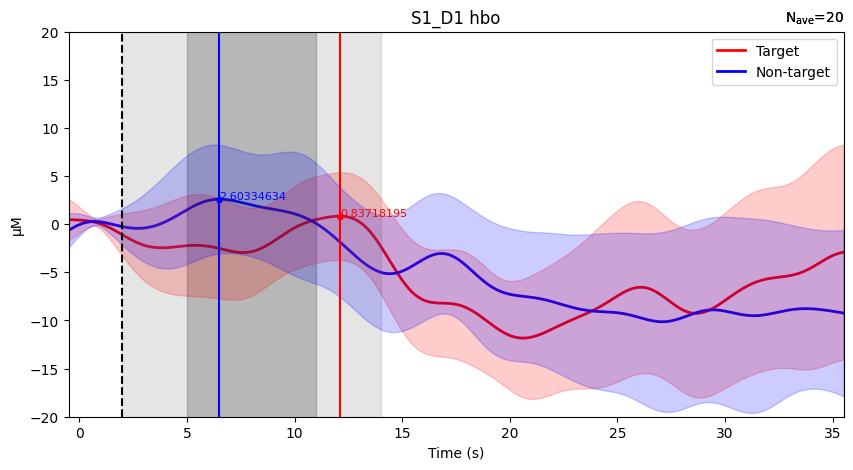

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 4 significant peaks
Found 3 significant peaks


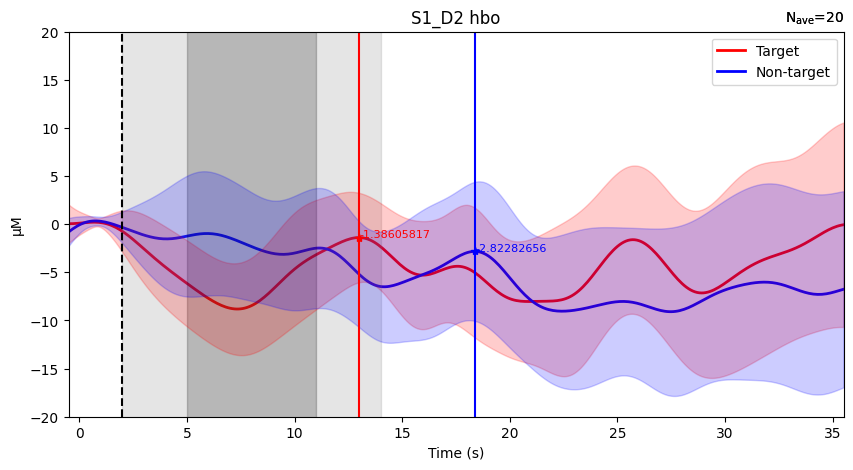

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 2 significant peaks
Found 1 significant peak


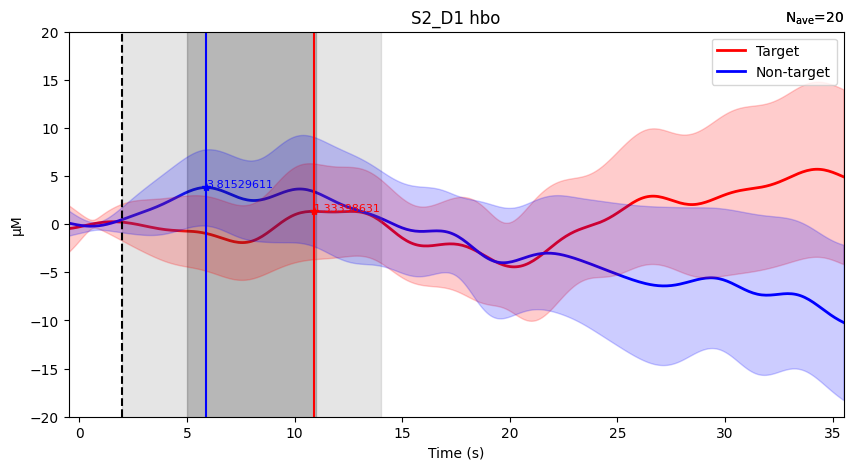

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 3 significant peaks
Found 1 significant peak


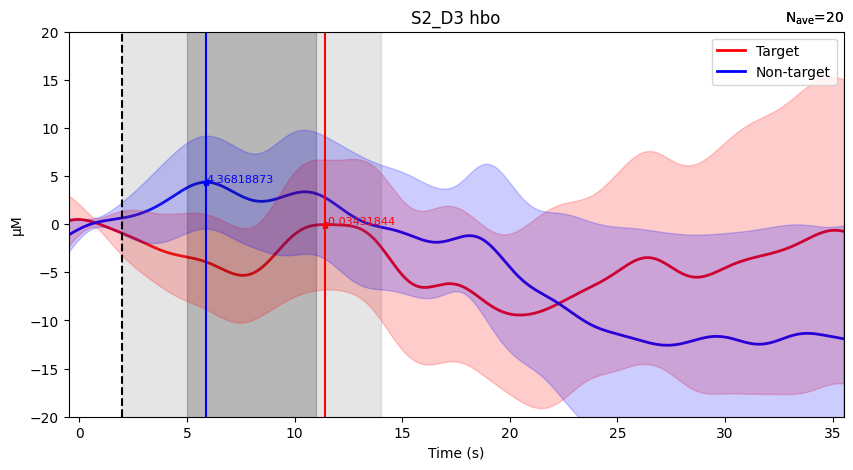

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 4 significant peaks
Found 3 significant peaks


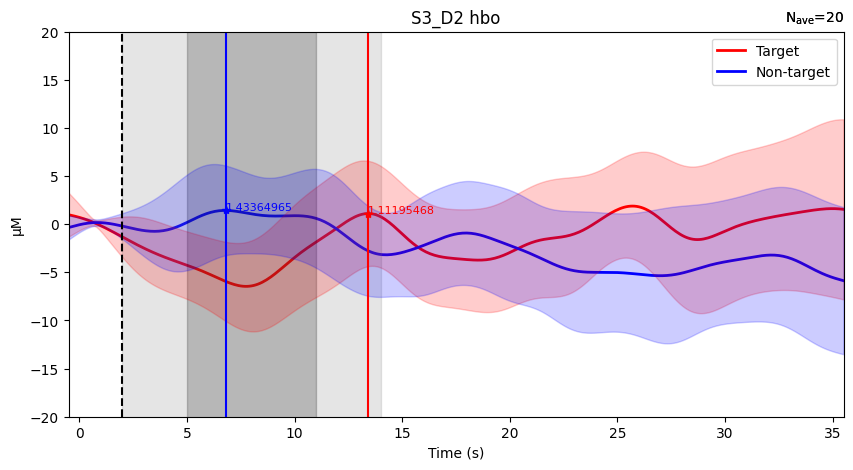

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 3 significant peaks
Found 2 significant peaks


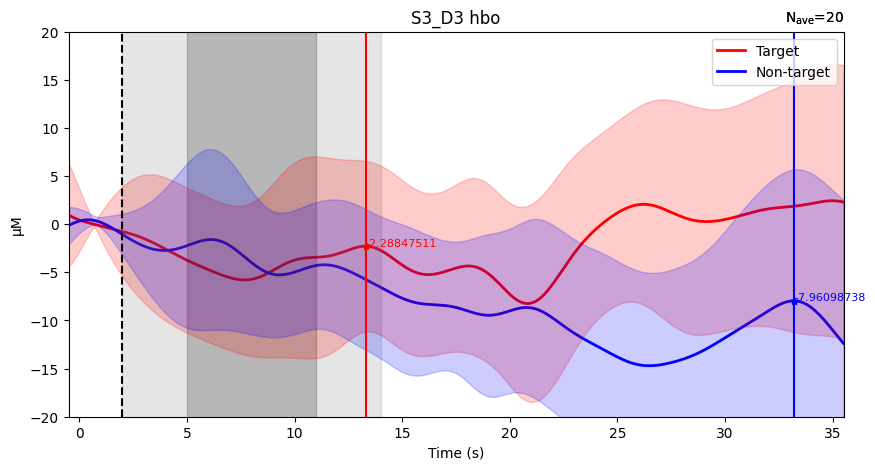

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 3 significant peaks
Found 3 significant peaks


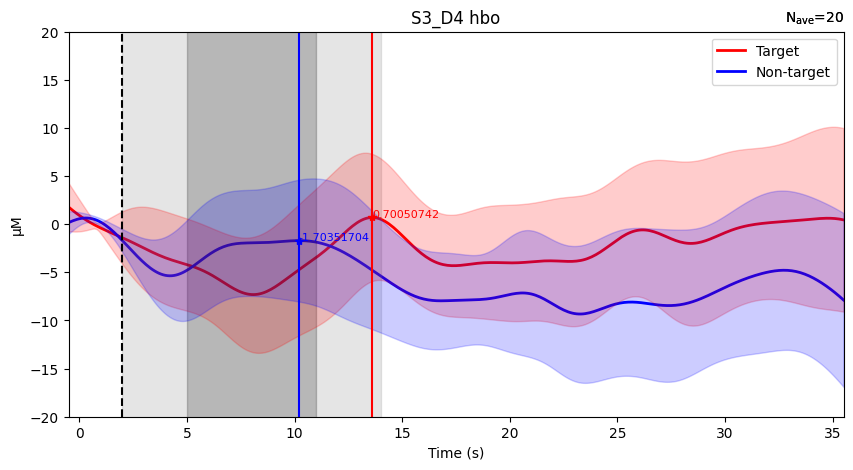

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 3 significant peaks
Found 3 significant peaks


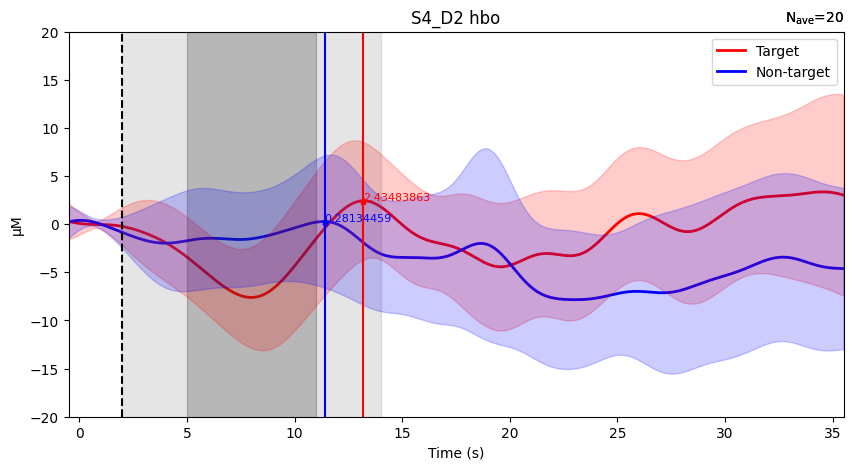

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 3 significant peaks
Found 3 significant peaks


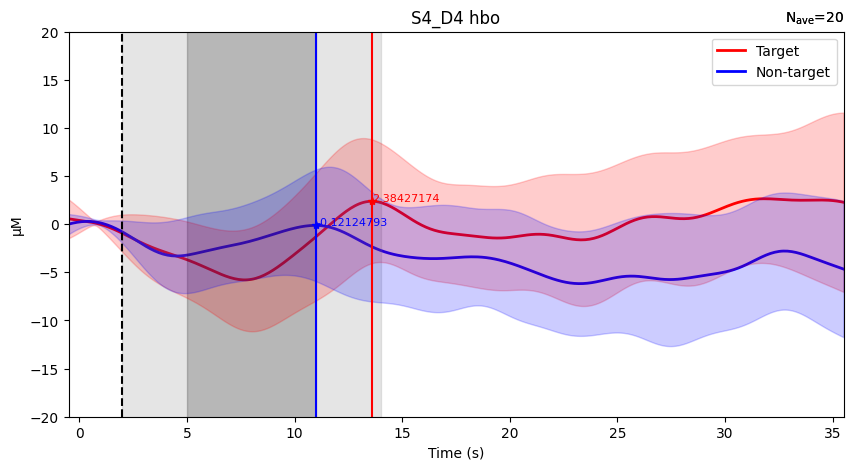

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 4 significant peaks
Found 4 significant peaks


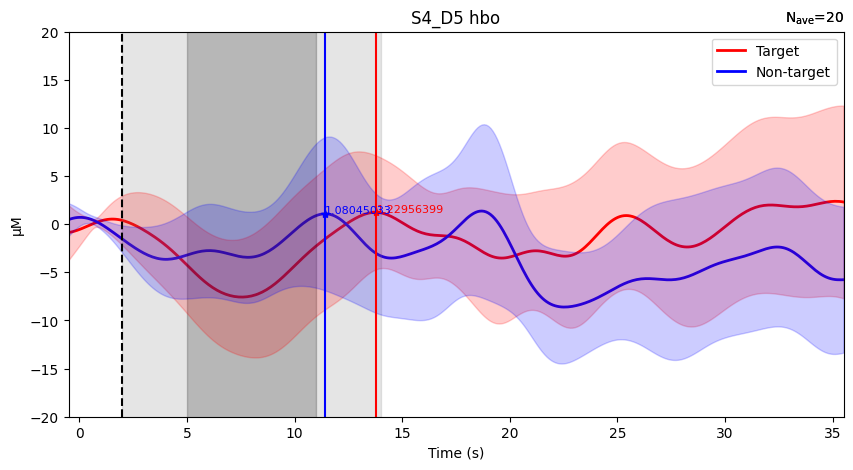

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 3 significant peaks
Found 2 significant peaks


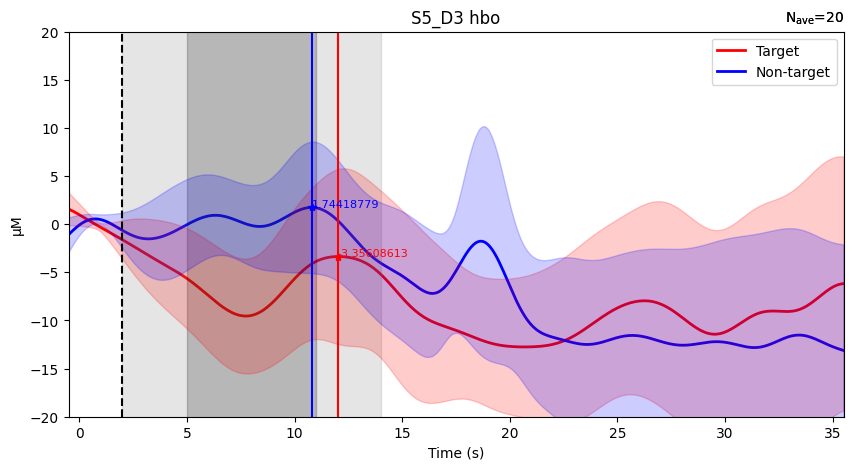

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 4 significant peaks
Found 3 significant peaks


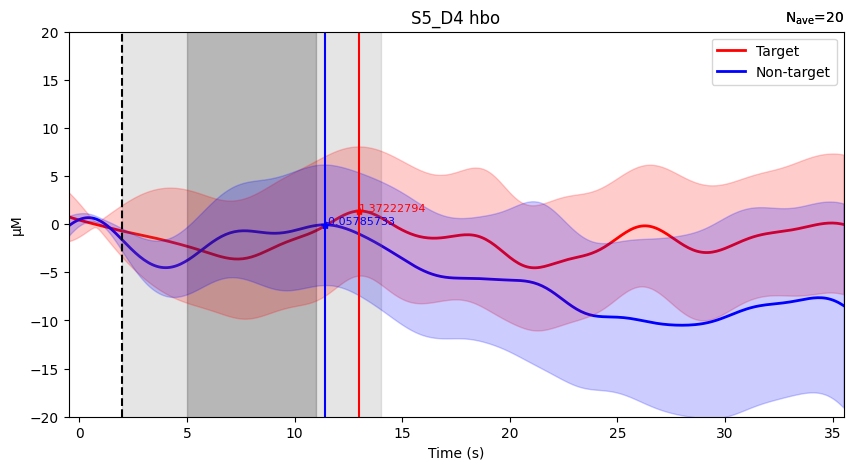

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 3 significant peaks
Found 1 significant peak


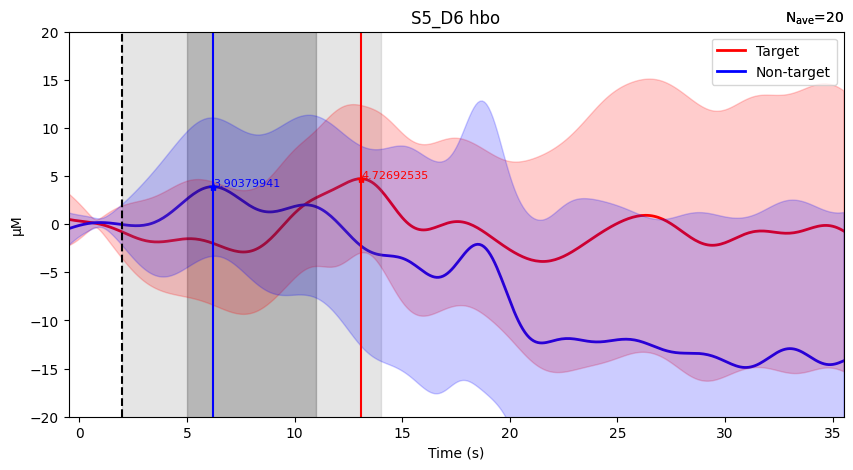

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 4 significant peaks
Found 2 significant peaks


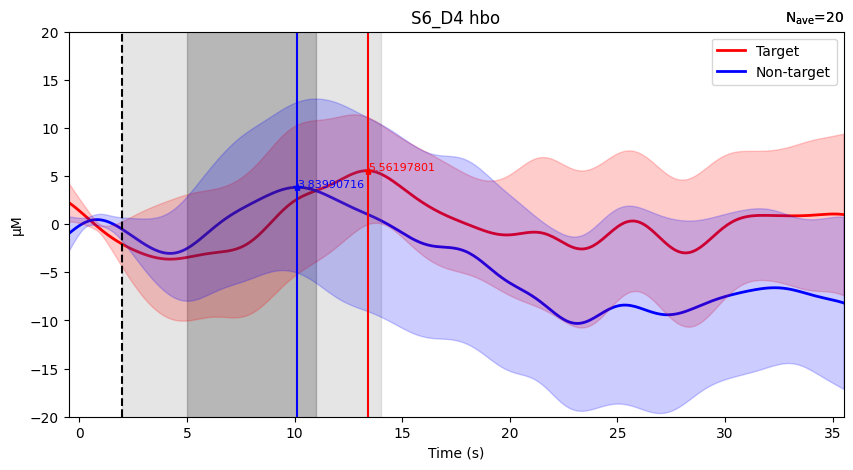

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 4 significant peaks
Found 2 significant peaks


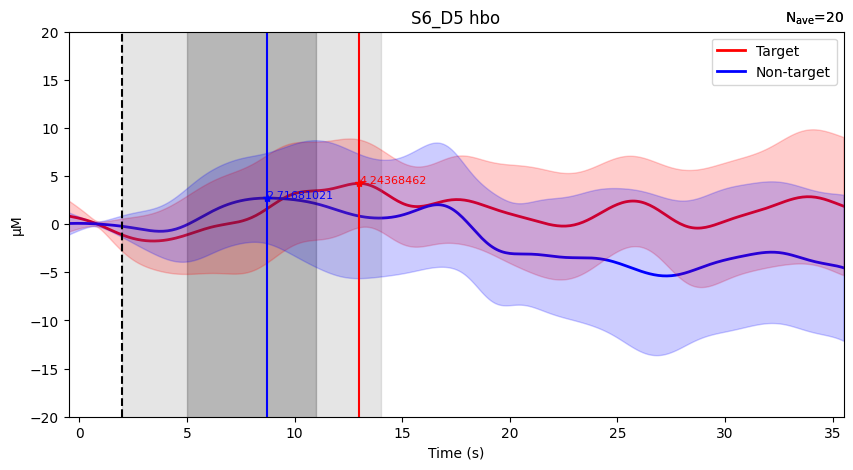

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 2 significant peaks
Found 2 significant peaks


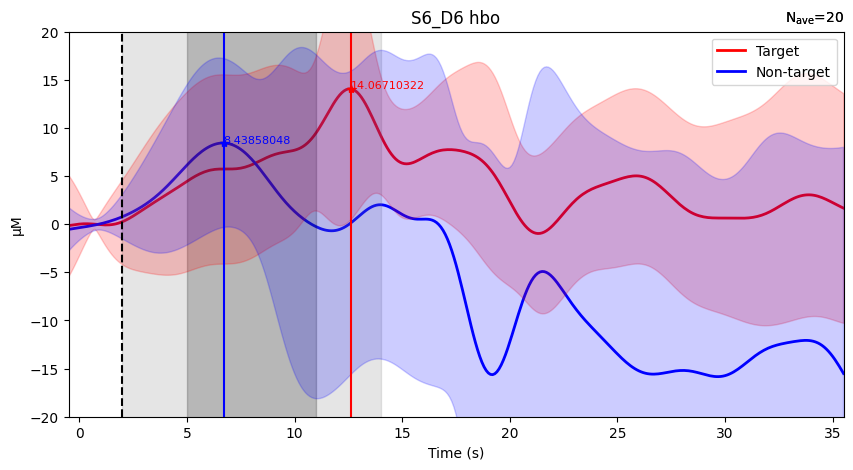

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 4 significant peaks
Found 4 significant peaks


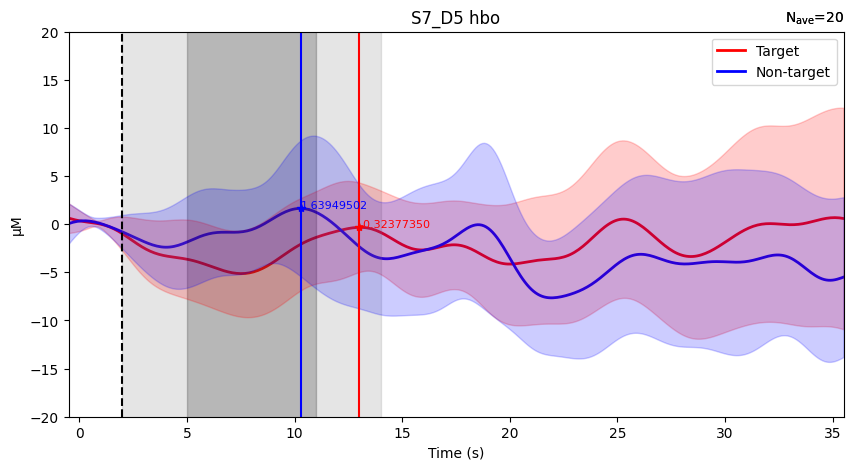

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 3 significant peaks
Found 1 significant peak


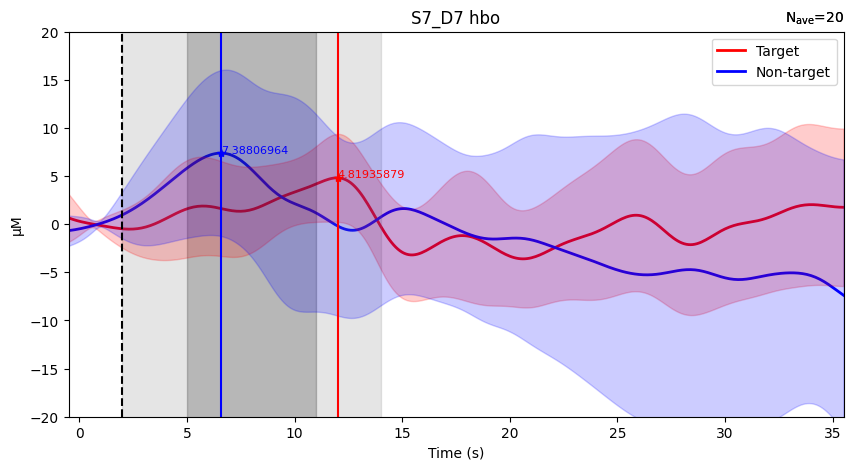

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 2 significant peaks
Found 1 significant peak


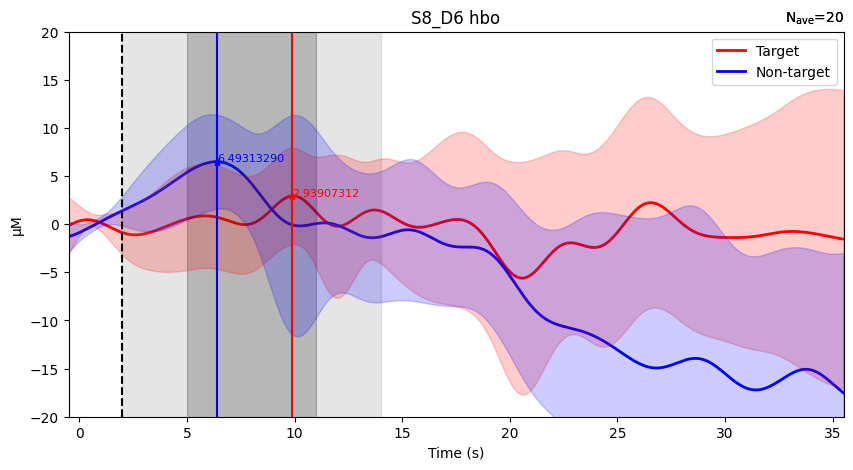

Need more than one channel to make topography for hbo. Disabling interactivity.
Need more than one channel to make topography for hbo. Disabling interactivity.
Found 4 significant peaks
Found 2 significant peaks


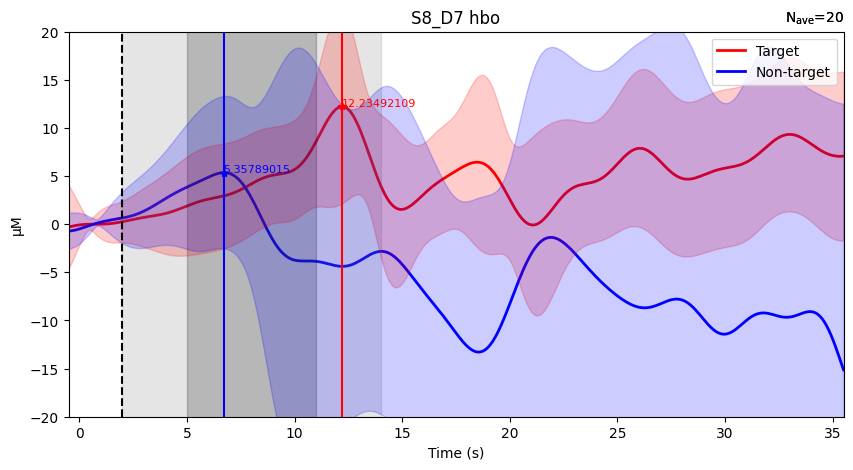

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 2 significant peaks


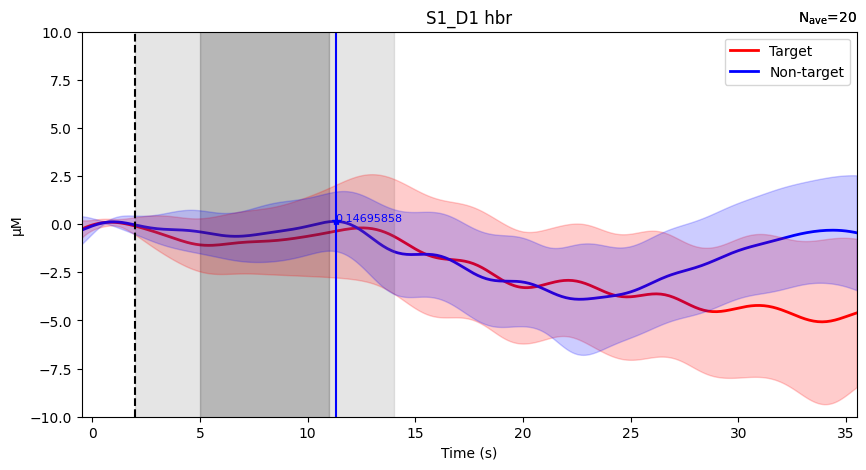

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 3 significant peaks


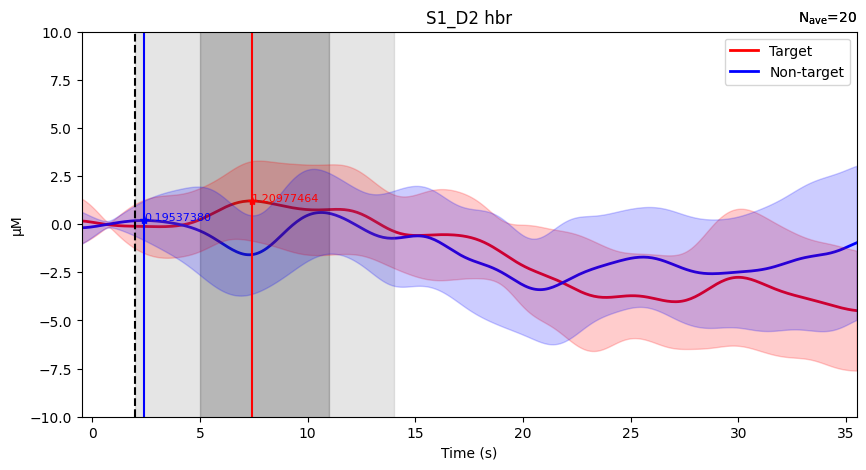

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 3 significant peaks
Found 3 significant peaks


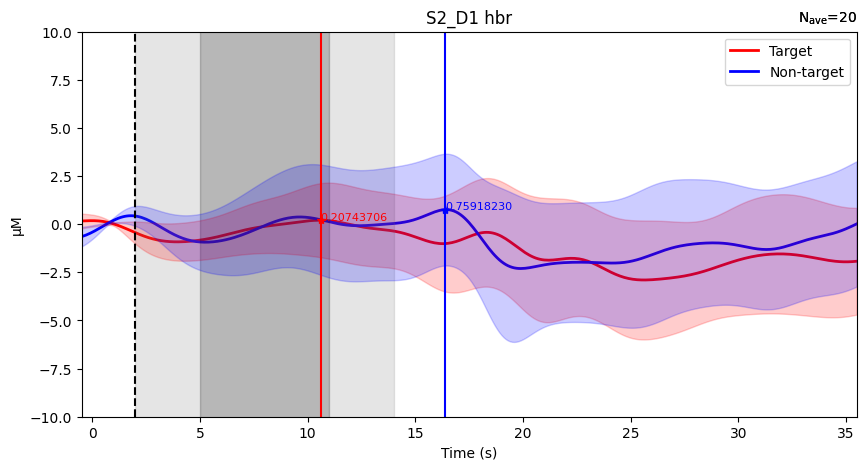

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 2 significant peaks


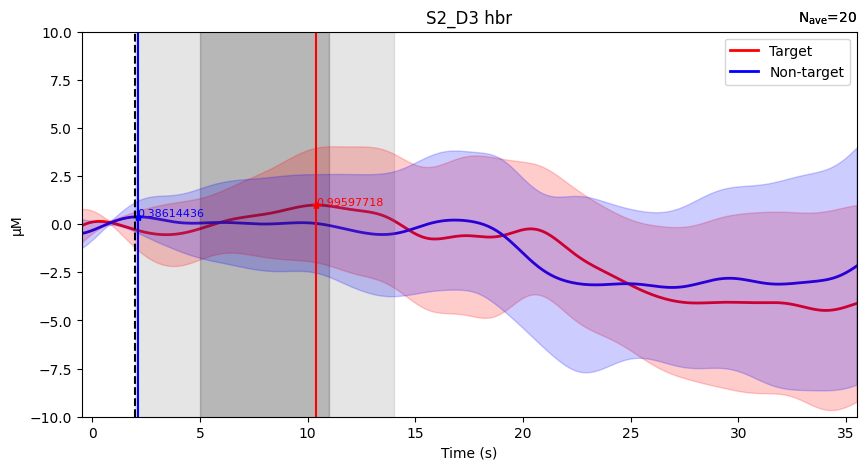

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 2 significant peaks
Found 4 significant peaks


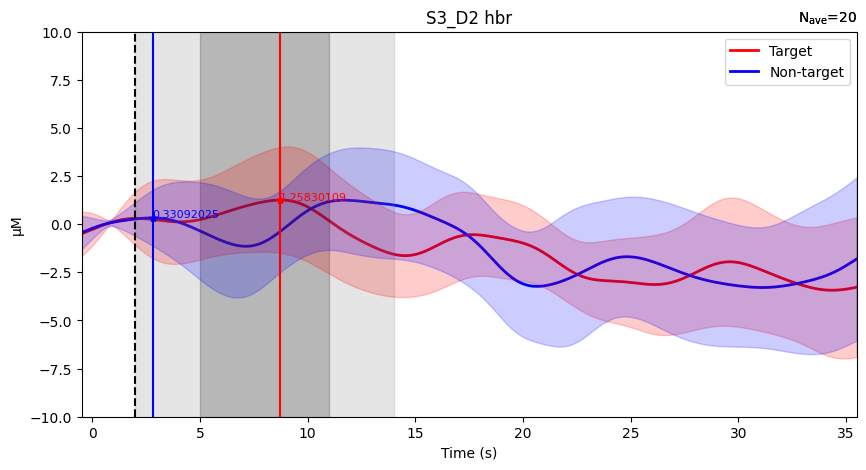

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 4 significant peaks


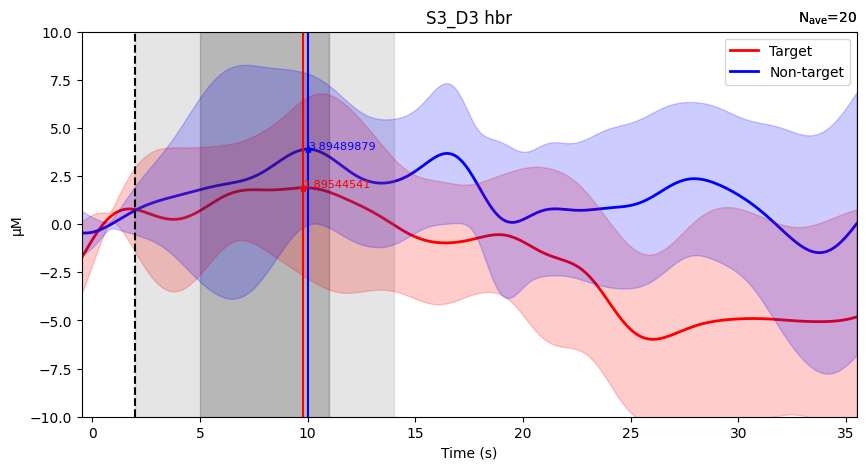

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 2 significant peaks


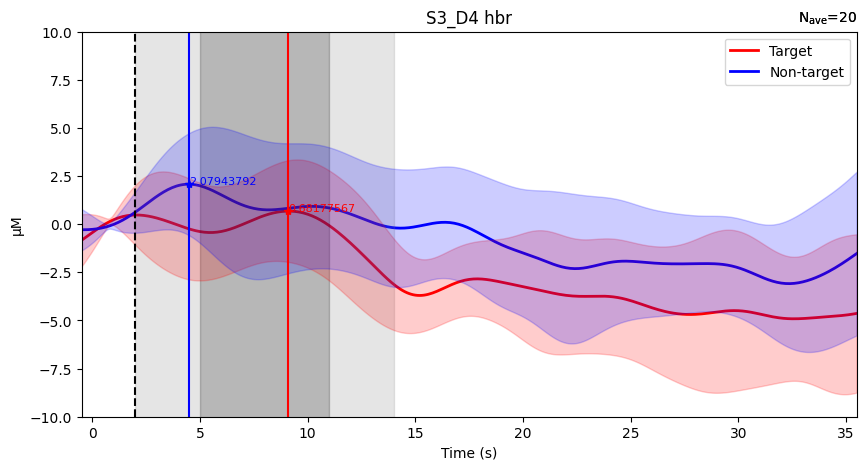

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 1 significant peak


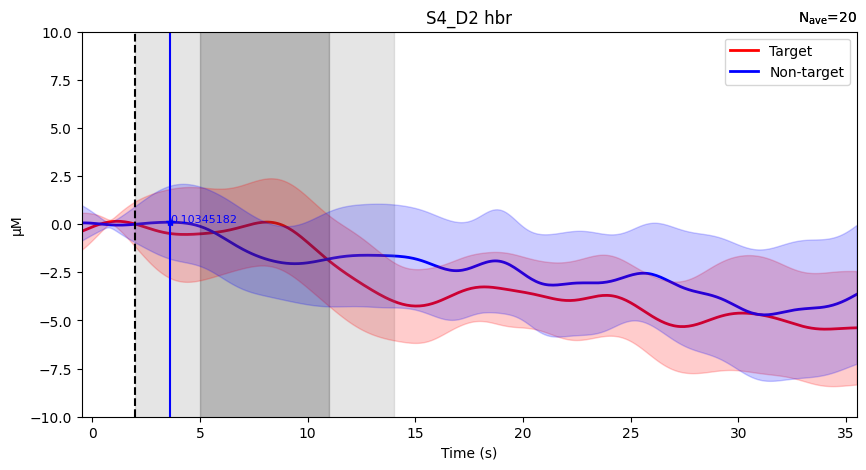

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 2 significant peaks


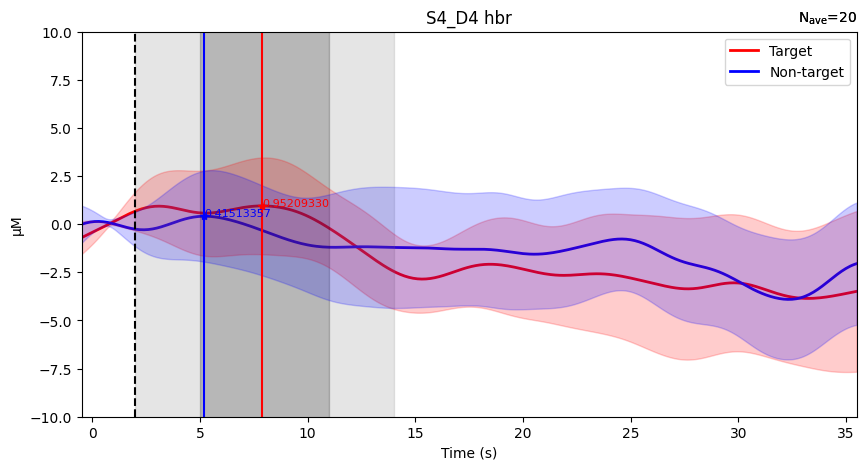

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 2 significant peaks


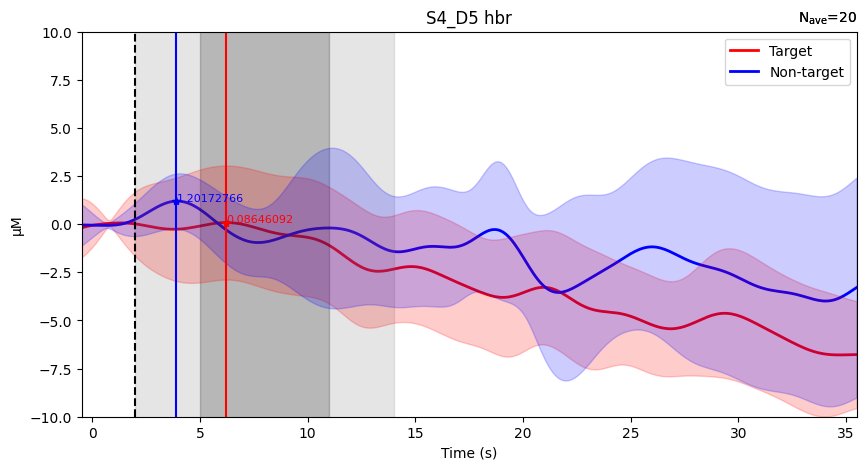

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 4 significant peaks


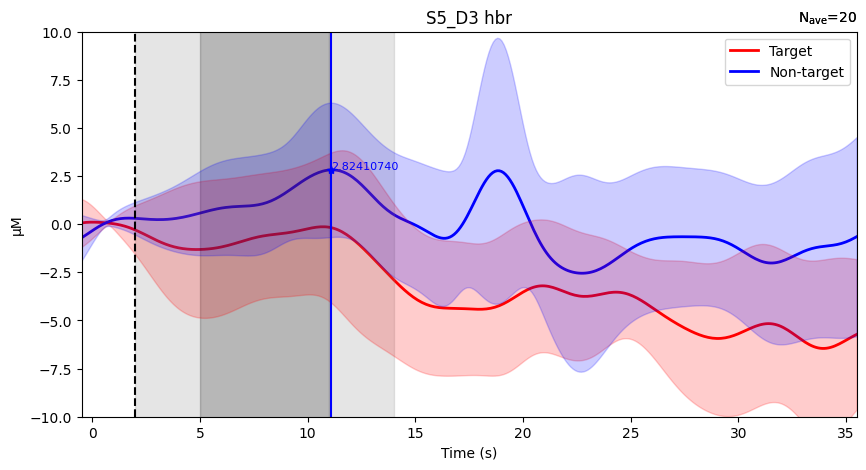

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 3 significant peaks


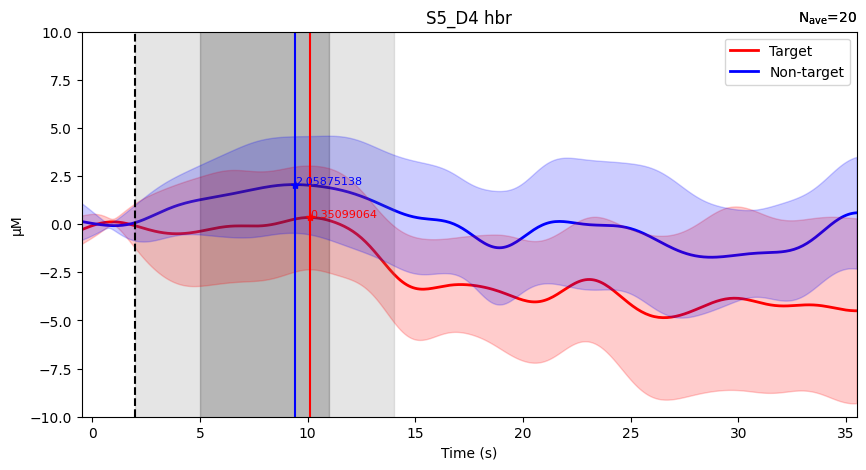

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 4 significant peaks


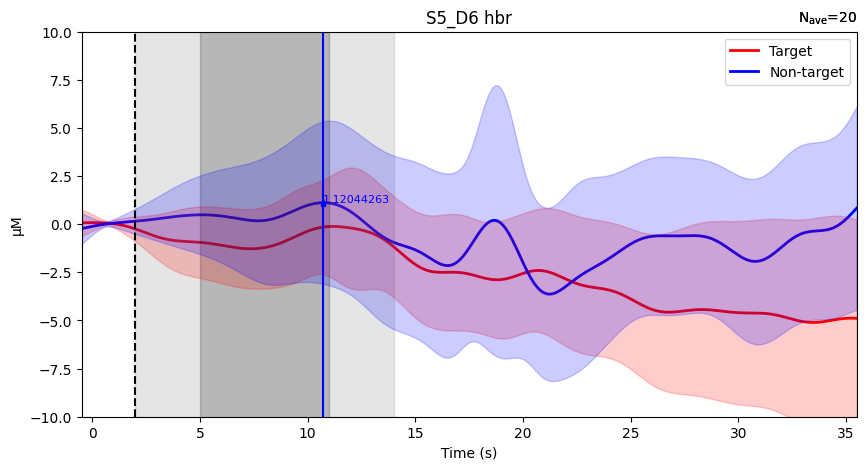

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 2 significant peaks
Found 3 significant peaks


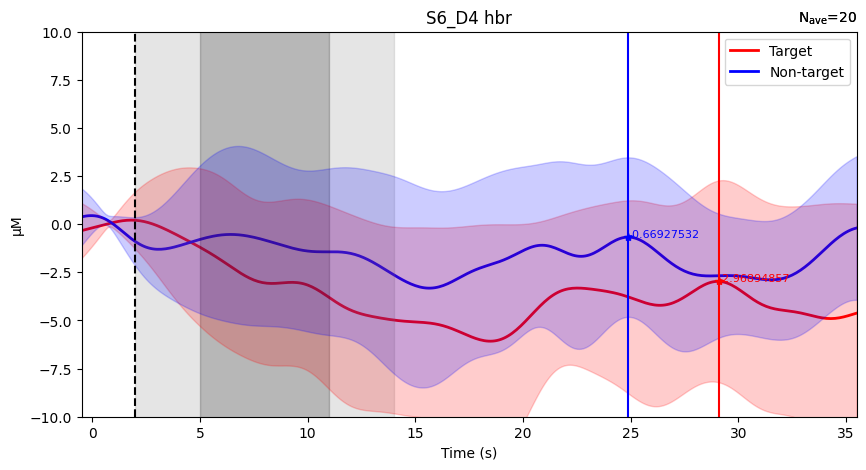

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 3 significant peaks


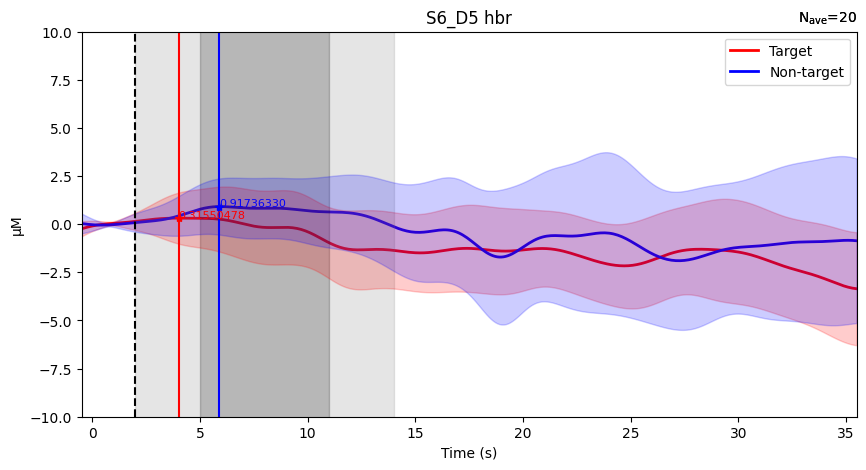

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 3 significant peaks
Found 2 significant peaks


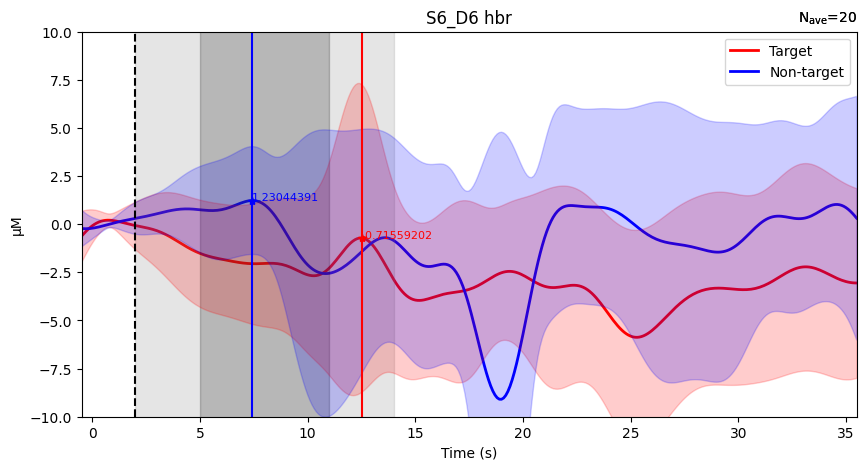

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 2 significant peaks
Found 4 significant peaks


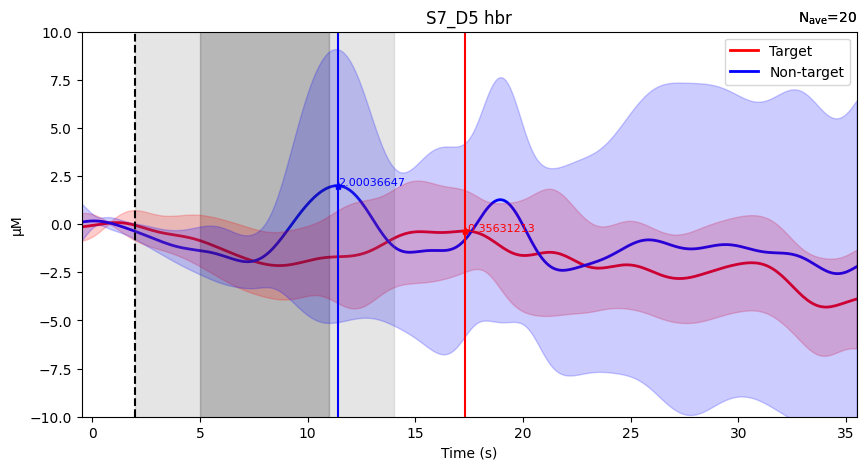

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 3 significant peaks
Found 3 significant peaks


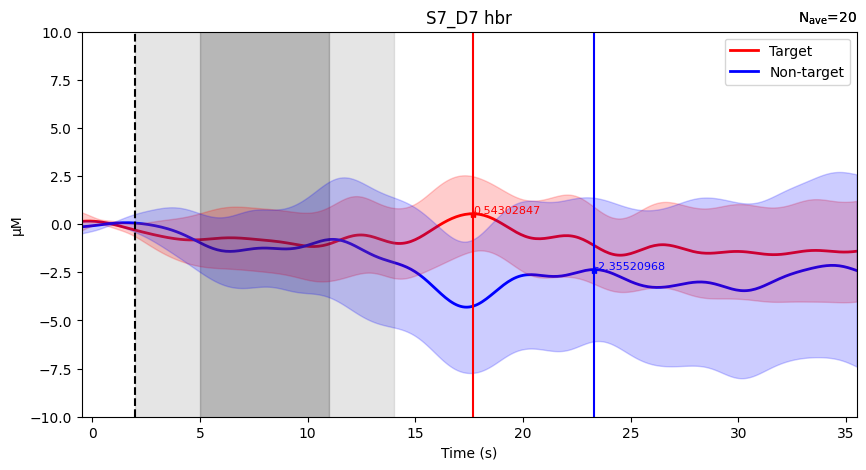

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 1 significant peak
Found 3 significant peaks


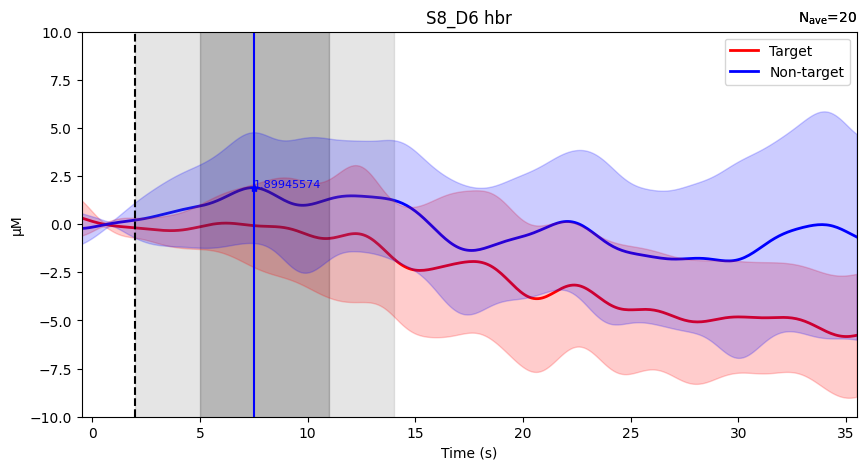

Need more than one channel to make topography for hbr. Disabling interactivity.
Need more than one channel to make topography for hbr. Disabling interactivity.
Found 2 significant peaks
Found 3 significant peaks


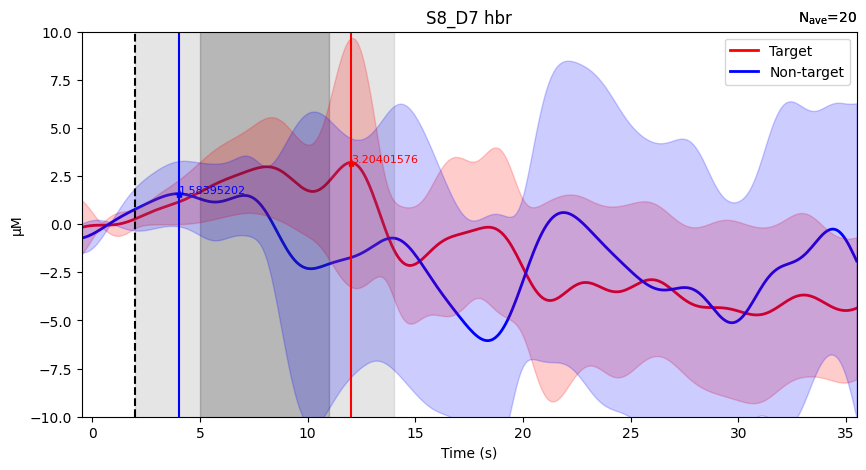

In [372]:
from mne.preprocessing import peak_finder

channels = epochs.ch_names

for idx, ch_name in enumerate(channels):
    evoked_target = t_epochs.average(picks=ch_name)
    evoked_nontarget = nt_epochs.average(picks=ch_name)

    fig, axes = plt.subplots(1, 1, figsize=(10, 5), sharey=True)

    target_data = t_epochs.get_data(picks=ch_name)
    nontarget_data = nt_epochs.get_data(picks=ch_name)

    # target_data = target_arr[:, idx, :].reshape(-1, 1, 361)
    # nontarget_data = nontarget_arr[:, idx, :].reshape(-1, 1, 361)

    # time array
    sampling_frequency = epochs.info['sfreq']
    time_interval = 1 / sampling_frequency
    times = np.arange(target_data.shape[2]) * time_interval

    # Target epochs std
    channel_means_t, channel_stds_t = [], []

    for i in range(len(times)):
        means_timepoint_t = np.mean(target_data[:, :, i])
        channel_means_t.append(means_timepoint_t)

        stds_timepoint_t = np.std(target_data[:, :, i])
        channel_stds_t.append(stds_timepoint_t)

    ci_t = 1.96 * np.array(channel_stds_t) / np.sqrt(target_data.shape[0])

    # Non-target epochs std
    channel_means_n, channel_stds_n = [], []

    for i in range(len(times)):
        means_timepoint_n = np.mean(nontarget_data[:, :, i])
        channel_means_n.append(means_timepoint_n)

        stds_timepoint_n = np.std(nontarget_data[:, :, i])
        channel_stds_n.append(stds_timepoint_n)

    ci_n = 1.96 * np.array(channel_stds_n) / np.sqrt(nontarget_data.shape[0])

    evoked_target.plot(axes=axes, spatial_colors=False, gfp=False, ylim=dict(hbo=[-20, 20], hbr=[-10, 10]), show=False)
    evoked_nontarget.plot(axes=axes, spatial_colors=True, gfp=False, ylim=dict(hbo=[-20, 20], hbr=[-10, 10]), show=False)
        
    evoked_target_data = evoked_target.get_data()[0]
    t_peak_locs, t_peak_mags = peak_finder(evoked_target_data)

    for i in range(len(t_peak_locs)):
        if t_peak_locs[i]/10-0.5 > 2:
            axes.plot(t_peak_locs[i]/10-0.5, t_peak_mags[i]*1000000, 'r*')
            axes.text(t_peak_locs[i]/10-0.5, t_peak_mags[i]*1000000, f'{t_peak_mags[i]*1000000:.8f}', fontsize=8, color='r')
            axes.axvline(t_peak_locs[i]/10-0.5, color='r', linestyle='-')
            break

    evoked_nontarget_data = evoked_nontarget.get_data()[0]
    n_peak_locs, n_peak_mags = peak_finder(evoked_nontarget_data)
    for i in range(len(n_peak_locs)):
        if n_peak_locs[i]/10-0.5 > 2:
            axes.plot(n_peak_locs[i]/10-0.5, n_peak_mags[i]*1000000, 'b*')
            axes.text(n_peak_locs[i]/10-0.5, n_peak_mags[i]*1000000, f'{n_peak_mags[i]*1000000:.8f}', fontsize=8, color='b')
            axes.axvline(n_peak_locs[i]/10-0.5, color='b', linestyle='-')
            break
    
    axes.axvline(2, color='black', linestyle='--')
    axes.fill_between([2, 14], -30, 30, color='grey', alpha=0.2)
    axes.fill_between([5, 11], -30, 30, color='black', alpha=0.2)
    axes.set_title(f'{ch_name}')

    lines = axes.get_lines()
    # for line in lines:
    #     line.set_linewidth(2)
    lines[0].set_color('r')  
    lines[0].set_linewidth(2)
    lines[1].set_color('b')  
    lines[1].set_linewidth(2)

    axes.fill_between(times-0.5, (np.array(channel_means_t) - ci_t)*1000000, (np.array(channel_means_t) + ci_t)*1000000, color='r', alpha=0.2)
    axes.fill_between(times-0.5, (np.array(channel_means_n) - ci_n)*1000000, (np.array(channel_means_n) + ci_n)*1000000, color='b', alpha=0.2)

    axes.legend(['Target', 'Non-target'], loc='upper right')
    
    # # hide axes[1]
    # axes[1].set_facecolor('none')
    # axes[1].spines['top'].set_visible(False)
    # axes[1].spines['right'].set_visible(False)
    # axes[1].spines['bottom'].set_visible(False)
    # axes[1].spines['left'].set_visible(False)
    # axes[1].tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)

    plt.show()


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


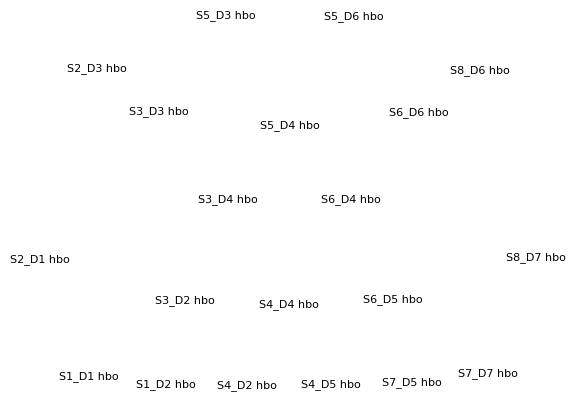

In [789]:
ch_name = 'hbo'

evoked_target = epochs["Target"].average(picks=ch_name)

layout = mne.find_layout(epochs.info)
ch_names = evoked_target.ch_names

for i, name in enumerate(ch_names):
    ch_idx = evoked_target.ch_names.index(name)
    x, y = layout.pos[ch_idx][:2]
    plt.text(x, y, name, fontsize=8, ha='center', va='center', color='black')

plt.axis('off')
plt.show()


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


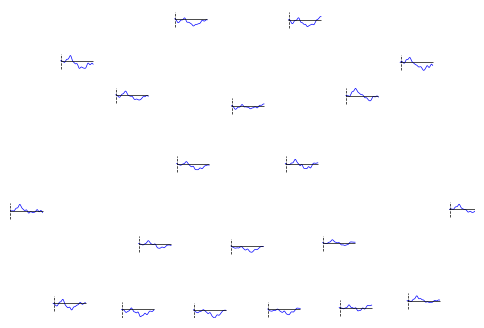

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


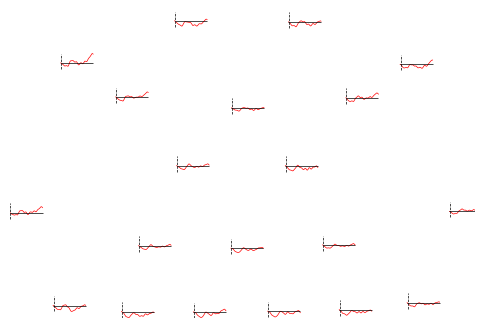

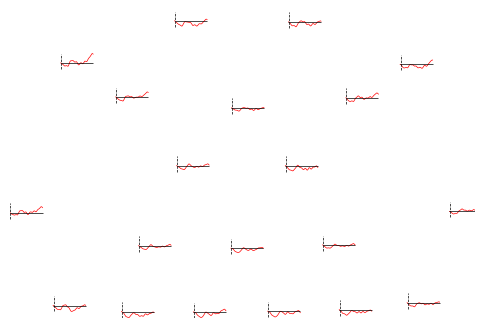

In [801]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))
mne.viz.plot_evoked_topo(epochs["Target"].average(picks='hbo'), color='b',
                         axes=axes, legend=False)

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))
mne.viz.plot_evoked_topo(epochs["Non-target"].average(picks='hbo'), color='r',
                         axes=axes, legend=False)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


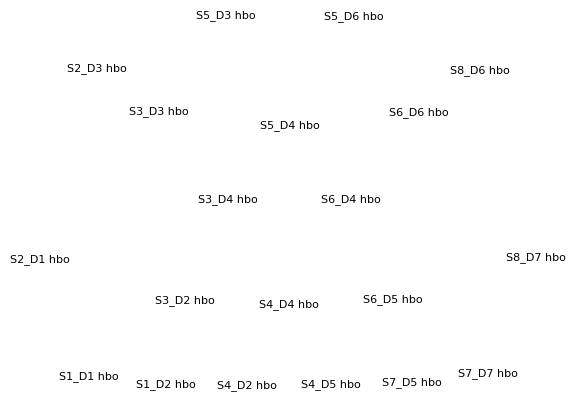

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


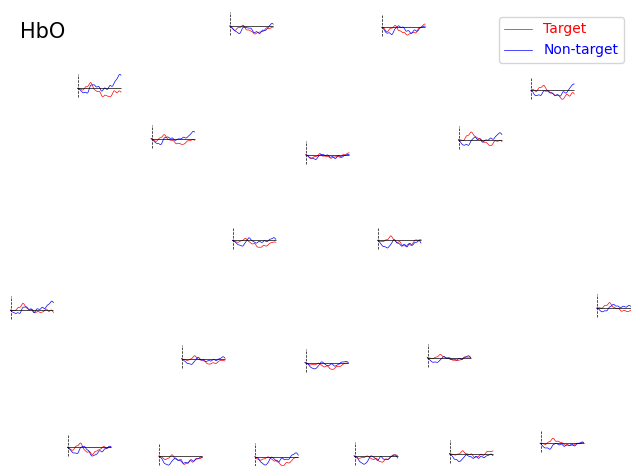

In [815]:
ch_name = 'hbo'

evoked_target = epochs["Target"].average(picks=ch_name)

layout = mne.find_layout(epochs.info)
ch_names = evoked_target.ch_names

for i, name in enumerate(ch_names):
    ch_idx = evoked_target.ch_names.index(name)
    x, y = layout.pos[ch_idx][:2]
    plt.text(x, y, name, fontsize=8, ha='center', va='center', color='black')

plt.axis('off')
plt.show()

# Extract evoked data for "Target" and "Non-target" epochs
evoked_target = epochs["Target"].average(picks="hbo")
evoked_nontarget = epochs["Non-target"].average(picks="hbo")

# Plot "Target" evoked data
mne.viz.plot_evoked_topo([evoked_target, evoked_nontarget], color=['r', 'b'], legend=True, title='HbO')

# Tidy the legend.
leg_lines = [line for line in axes.lines if line.get_c() == 'b'][:1]
leg_lines.append([line for line in axes.lines if line.get_c() == 'r'][0])
fig.legend(leg_lines, ['Target', 'Non-target'], loc='lower right')

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


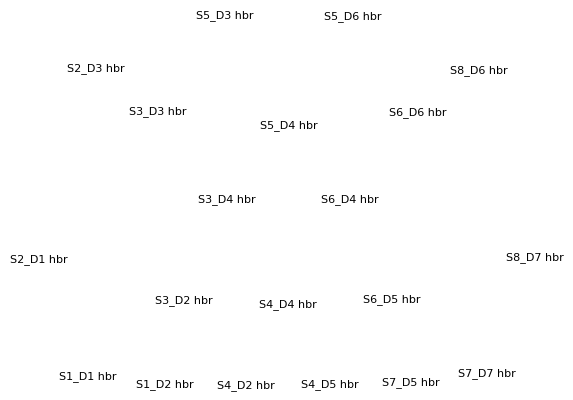

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


TypeError: 'clipbox' must be an instance of matplotlib.transforms.BboxBase or None, not a tuple

In [76]:
ch_name = 'hbr'

evoked_target = epochs["Target"].average(picks=ch_name)

layout = mne.find_layout(epochs.info)
ch_names = evoked_target.ch_names

for i, name in enumerate(ch_names):
    ch_idx = evoked_target.ch_names.index(name)
    x, y = layout.pos[ch_idx][:2]
    plt.text(x, y, name, fontsize=8, ha='center', va='center', color='black')

plt.axis('off')
plt.show()

# Extract evoked data for "Target" and "Non-target" epochs
evoked_target = epochs["Target"].average(picks="hbr")
evoked_nontarget = epochs["Non-target"].average(picks="hbr")

# Plot "Target" evoked data
mne.viz.plot_evoked_topo([evoked_target, evoked_nontarget], color=['r', 'b'], legend=True, title='HbR')

# Tidy the legend.
leg_lines = [line for line in axes.lines if line.get_c() == 'b'][:1]
leg_lines.append([line for line in axes.lines if line.get_c() == 'r'][0])
fig.legend(leg_lines, ['Target', 'Non-target'], loc='lower right')

In [260]:
epochs[0, 2]

Number of events,2
Events,Start: 2
Time range,-0.500 – 35.500 s
Baseline,-0.500 – 0.000 s


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


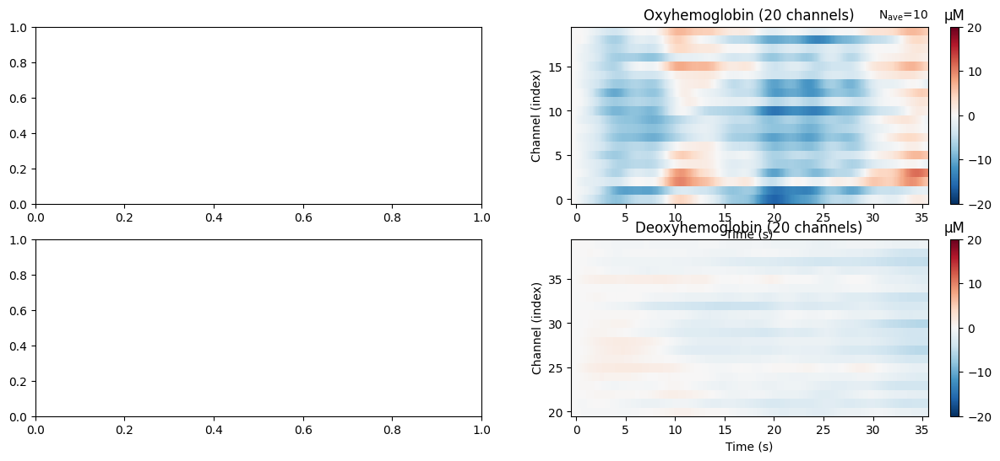

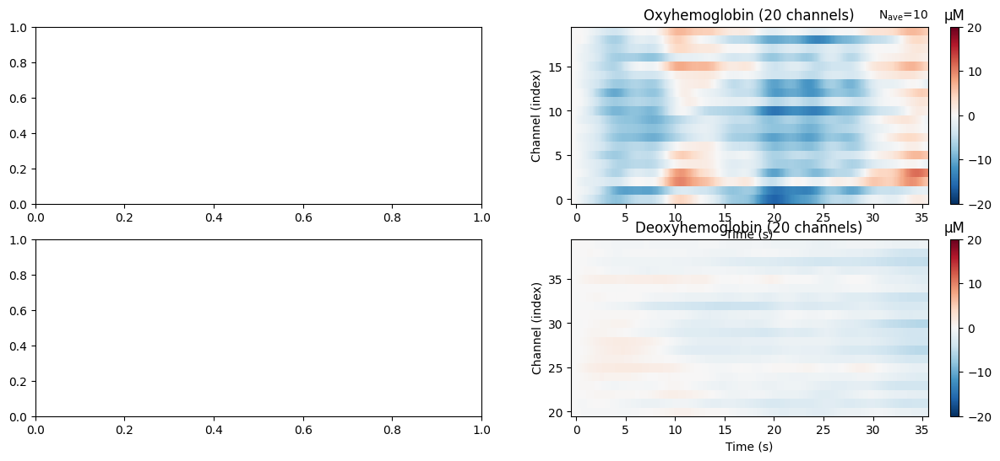

In [350]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 6))
clims = dict(hbo=[-20, 20], hbr=[-20, 20])
#epochs[0, 2].average().plot_image(axes=axes[:, 0], clim=clims)
epochs.average().plot_image(axes=axes[:, 1], clim=clims)
# for column, condition in enumerate([0, 2]):
#     for ax in axes[:, column]:
#         ax.set_title('{}: {}'.format(condition, ax.get_title()))

Not setting metadata
12 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
12 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"
combining channels using "mean"


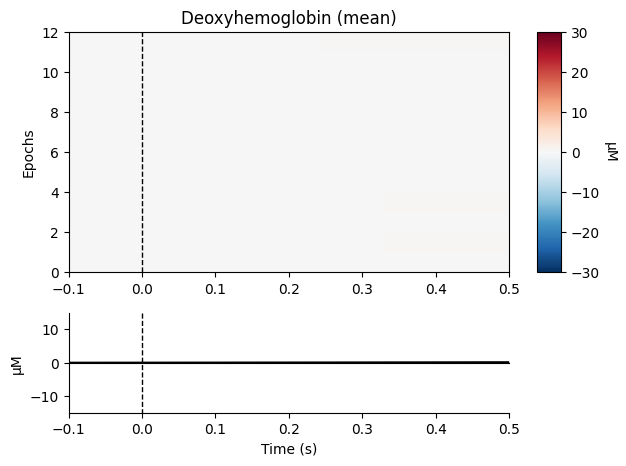

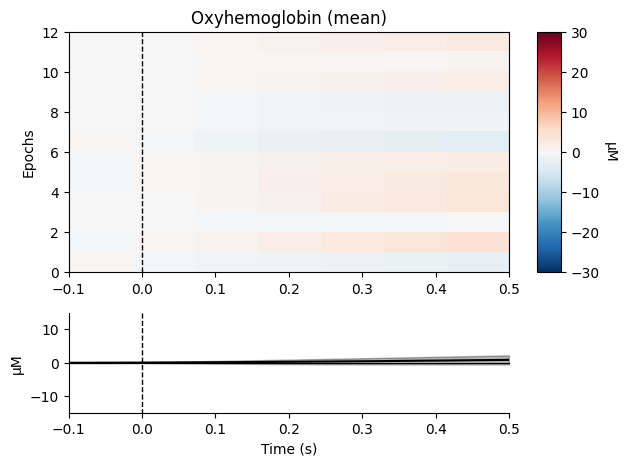

[<Figure size 640x480 with 3 Axes>, <Figure size 640x480 with 3 Axes>]

In [164]:
epochs['Target'].plot_image(combine='mean', vmin=-30, vmax=30,
                             ts_args=dict(ylim=dict(hbo=[-15, 15],
                                                    hbr=[-15, 15])))

Used Annotations descriptions: ['End', 'Non-target', 'Start', 'Target']


Text(0.5, 0, 'Time (s)')

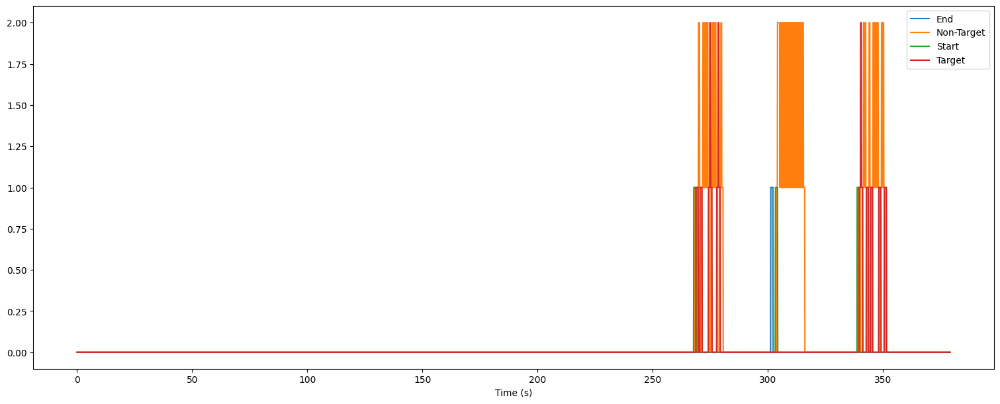

In [58]:
s = mne_nirs.experimental_design.create_boxcar(raw_haemo)
fig, ax = plt.subplots(figsize=(15, 6), constrained_layout=True)
ax.plot(raw_haemo.times, s)
ax.legend(["End", "Non-Target", "Start", "Target"], loc="upper right")
ax.set_xlabel("Time (s)")

# Using a DataFrame

In [1146]:
sss = epochs["Target"].get_data()

In [1153]:
sss[:, 0, :].shape

(5, 361)

In [1155]:
sss[:, 0, 0].std()

4.574520695977753e-06

In [1145]:
t_epochs_means, n_epochs_means = [None] * len(channels), [None] * len(channels)
t_epochs_std, n_epochs_std = [None] * len(channels), [None] * len(channels)

for i in range(len(channels)):
    t_epochs_means[i] = epochs["Target"].average(picks=channels[i]).data
    t_epochs_std[i] = epochs["Target"].get_data().std([i])

    n_epochs_means[i] = epochs["Non-target"].average(picks=channels[i]).data
    n_epochs_std[i] = epochs["Non-target"].std(picks=channels[i]).data

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


TypeError: _std() got an unexpected keyword argument 'picks'

In [58]:
# Create a DataFrame
import pandas as pd

sampling_frequency = epochs.info['sfreq']  # sampling rate
time_interval = 1 / sampling_frequency 

times = np.arange(target_data.shape[2]) * time_interval - 2.5 # epoch: [-0.5, 35.5], 1st stimulus: 2.0s
#times = np.expand_dims(times, axis=0)

channels = epochs.ch_names

t_data = epochs["Target"].average().get_data() # epochs average
#t_data = np.concatenate((times, t_data))
#t_data = t_data.T
print("t: ", t_data.shape)

# t_epochs_means = np.mean(t_data, axis=0) 
# t_epochs_stds = np.std(t_data, axis=0)    

n_data = epochs["Non-target"].average().get_data() # epochs average
#n_data = np.concatenate((times, n_data))
#n_data = n_data.T
print("n: ", n_data.shape)

# n_epochs_means = np.mean(n_data, axis=0)  
# n_epochs_stds = np.std(n_data, axis=0)    

#col = ['time'] + channels
df_t = pd.DataFrame(t_data, columns=times, index=channels)
df_n = pd.DataFrame(n_data, columns=times, index=channels)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
t:  (40, 361)
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
n:  (40, 361)


In [59]:
len(df_t)

40

In [60]:
df_t

,-2.5,-2.4,-2.3,-2.2,-2.1,-2.0,-1.9,-1.8,-1.7,-1.6,...,32.6,32.7,32.8,32.9,33.0,33.1,33.2,33.3,33.4,33.5
S1_D1 hbo,1.471245e-06,1.508280e-06,1.522379e-06,1.512734e-06,1.478282e-06,1.419077e-06,1.335830e-06,1.228946e-06,1.099685e-06,9.497371e-07,...,2.627168e-06,2.661742e-06,2.682841e-06,2.690888e-06,2.686523e-06,2.670454e-06,2.643399e-06,2.606143e-06,2.558821e-06,2.502299e-06
S1_D2 hbo,-2.076006e-07,-4.205578e-08,1.035309e-07,2.282382e-07,3.308477e-07,4.108469e-07,4.688597e-07,5.048968e-07,5.198310e-07,5.149159e-07,...,-2.587325e-06,-2.361341e-06,-2.136262e-06,-1.914761e-06,-1.699788e-06,-1.493744e-06,-1.299424e-06,-1.118963e-06,-9.551629e-07,-8.098169e-07
S2_D1 hbo,5.770784e-07,4.804120e-07,3.841861e-07,2.904846e-07,2.001980e-07,1.151177e-07,3.721580e-08,-3.278389e-08,-9.362874e-08,-1.438651e-07,...,-1.131192e-06,-1.471863e-06,-1.818972e-06,-2.166749e-06,-2.509456e-06,-2.841339e-06,-3.157389e-06,-3.452515e-06,-3.723421e-06,-3.966366e-06
S2_D3 hbo,3.832383e-07,4.315382e-07,4.673345e-07,4.909624e-07,5.016674e-07,4.999746e-07,4.869642e-07,4.626916e-07,4.280865e-07,3.846126e-07,...,-5.146747e-06,-5.307047e-06,-5.490229e-06,-5.692703e-06,-5.910587e-06,-6.139585e-06,-6.375794e-06,-6.614817e-06,-6.853771e-06,-7.088884e-06
S3_D2 hbo,8.694673e-07,7.971086e-07,7.189317e-07,6.363123e-07,5.499016e-07,4.611367e-07,3.716982e-07,2.825506e-07,1.951197e-07,1.110766e-07,...,-2.858954e-06,-2.922990e-06,-2.989622e-06,-3.058467e-06,-3.129048e-06,-3.200679e-06,-3.272860e-06,-3.344677e-06,-3.416034e-06,-3.486125e-06
S3_D3 hbo,9.368382e-07,9.727839e-07,9.960784e-07,1.006055e-06,1.001310e-06,9.813582e-07,9.461486e-07,8.950367e-07,8.280449e-07,7.457159e-07,...,-8.941664e-07,-1.009731e-06,-1.138085e-06,-1.277386e-06,-1.425734e-06,-1.581046e-06,-1.741527e-06,-1.905129e-06,-2.070817e-06,-2.236995e-06
S3_D4 hbo,1.397066e-06,1.333315e-06,1.255169e-06,1.163790e-06,1.059809e-06,9.447843e-07,8.207090e-07,6.889863e-07,5.516607e-07,4.110896e-07,...,-1.712032e-06,-1.730658e-06,-1.760597e-06,-1.801939e-06,-1.854545e-06,-1.917929e-06,-1.991680e-06,-2.074853e-06,-2.167201e-06,-2.267610e-06
S4_D2 hbo,2.568981e-06,2.408882e-06,2.230344e-06,2.035523e-06,1.826101e-06,1.604681e-06,1.374233e-06,1.136957e-06,8.956385e-07,6.534490e-07,...,1.392499e-06,1.387594e-06,1.376689e-06,1.359172e-06,1.334666e-06,1.303004e-06,1.263933e-06,1.217729e-06,1.163966e-06,1.103144e-06
S4_D4 hbo,1.587005e-06,1.498662e-06,1.399035e-06,1.289115e-06,1.169607e-06,1.041751e-06,9.070087e-07,7.664913e-07,6.216222e-07,4.740974e-07,...,4.574676e-07,4.413357e-07,4.213050e-07,3.969467e-07,3.679390e-07,3.340295e-07,2.948950e-07,2.504416e-07,2.001868e-07,1.440872e-07
S4_D5 hbo,2.518165e-06,2.337095e-06,2.139948e-06,1.928895e-06,1.705703e-06,1.472989e-06,1.233735e-06,9.903776e-07,7.458385e-07,5.034569e-07,...,3.986758e-06,3.977536e-06,3.964975e-06,3.947819e-06,3.924984e-06,3.895624e-06,3.858916e-06,3.814527e-06,3.761627e-06,3.700218e-06


In [1325]:
df_t.iloc[:,[0]]

,S1_D1 hbo
-2.5,0.000001
-2.4,0.000002
-2.3,0.000002
-2.2,0.000002
-2.1,0.000001
...,...
33.1,0.000003
33.2,0.000003
33.3,0.000003
33.4,0.000003


In [67]:
df_ntt.shape

(361, 1)

In [68]:
df_tt = df_t.iloc[:,[0]]
df_ntt = df_n.iloc[:,[0]]

box = pd.concat([df_tt, df_ntt], axis=1)

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


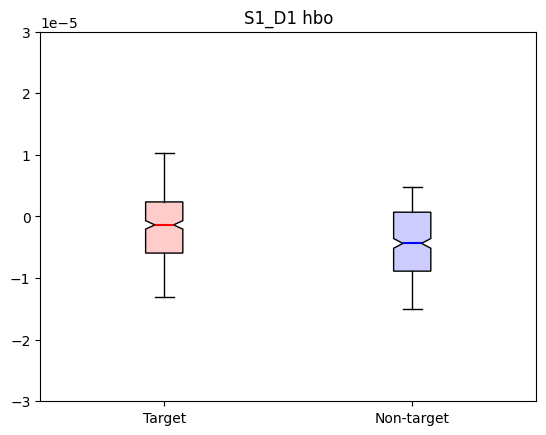

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


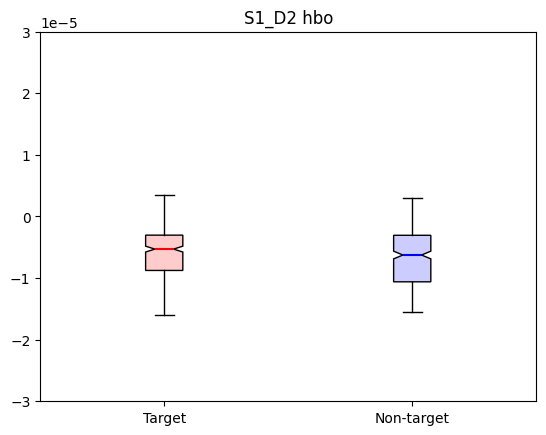

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


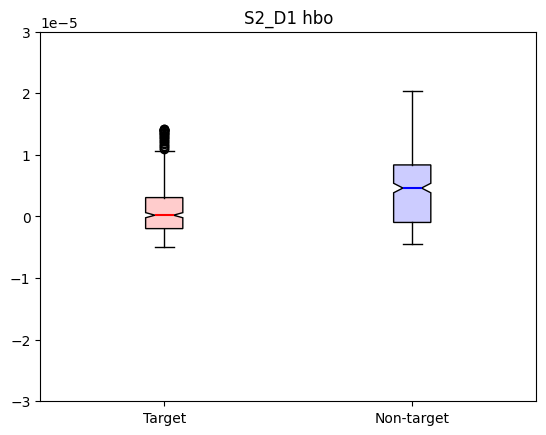

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


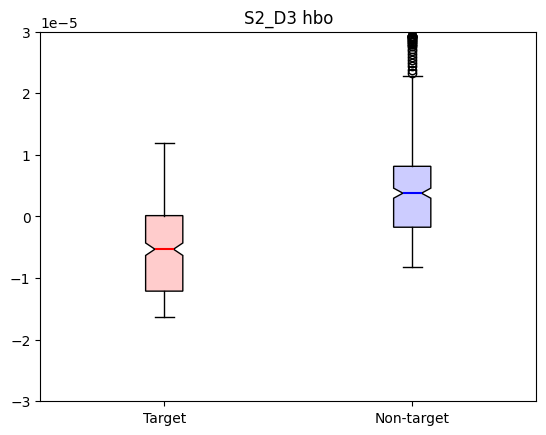

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


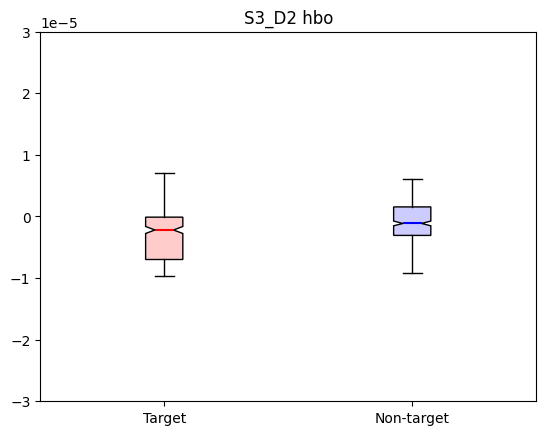

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


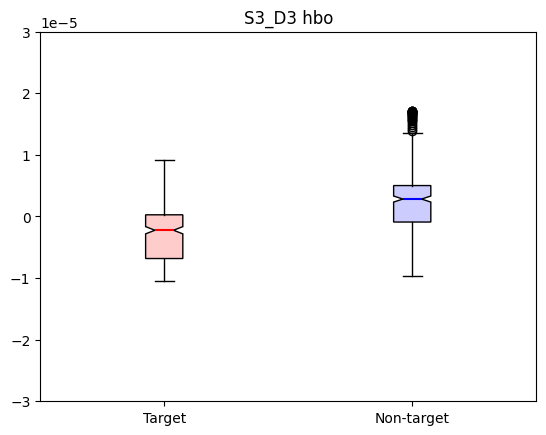

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


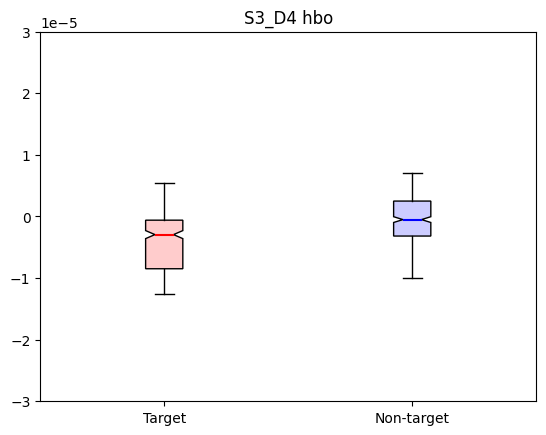

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


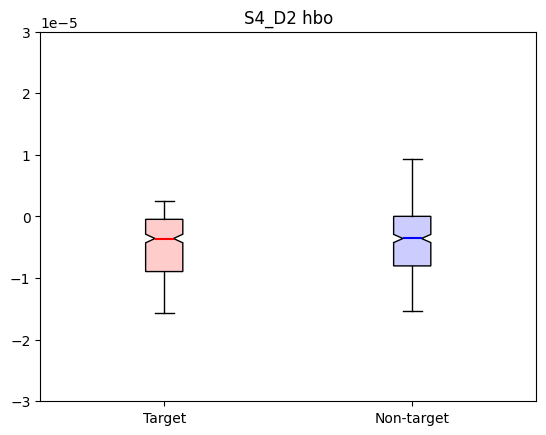

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


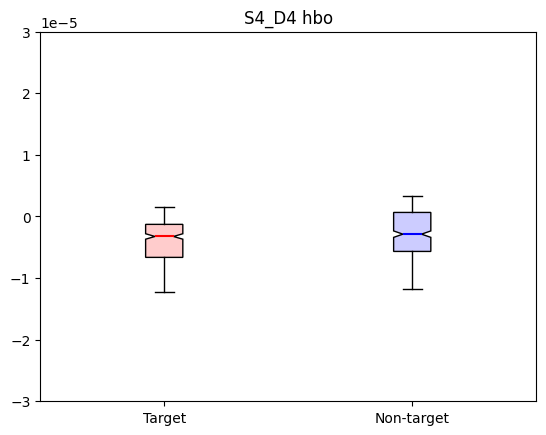

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


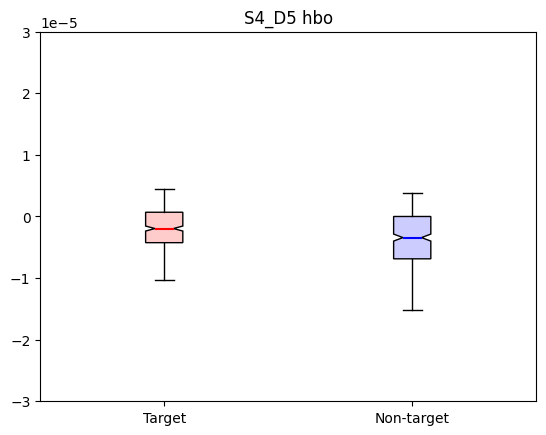

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


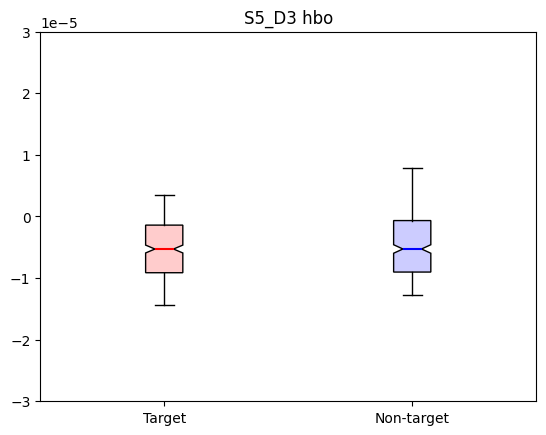

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


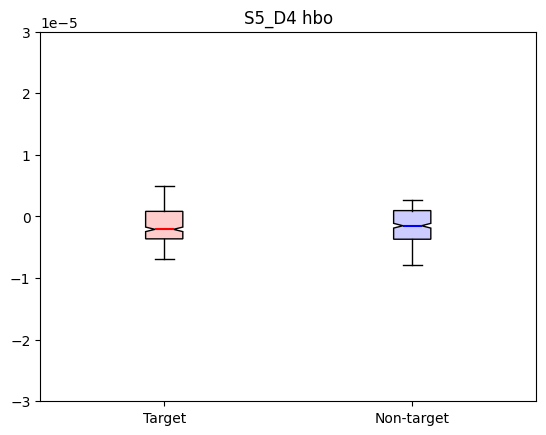

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


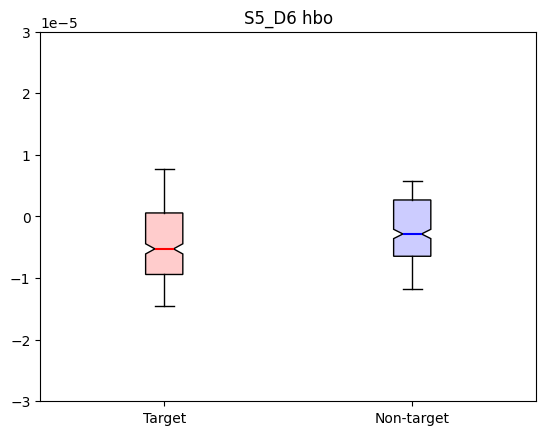

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


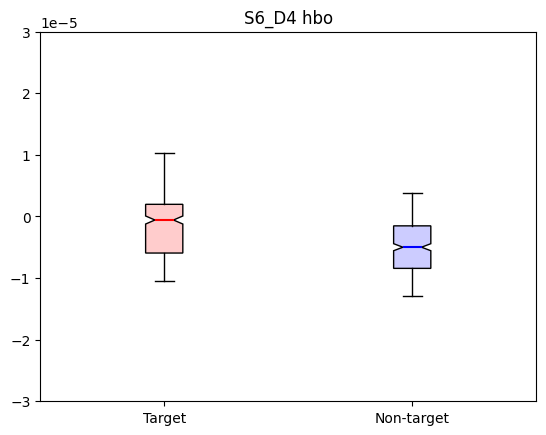

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


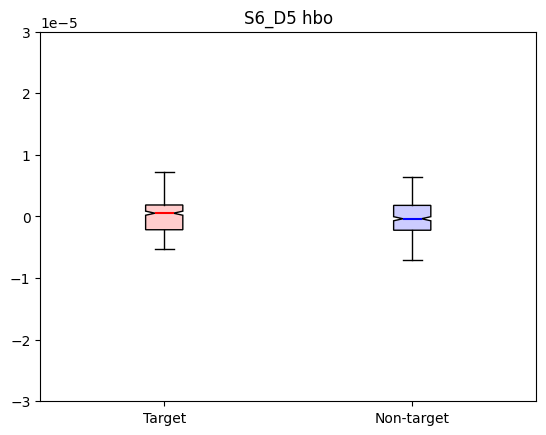

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


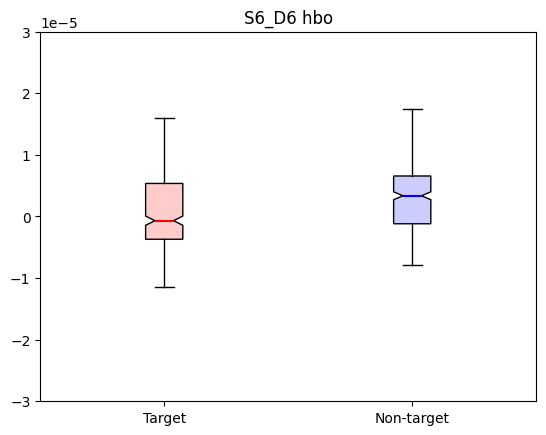

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


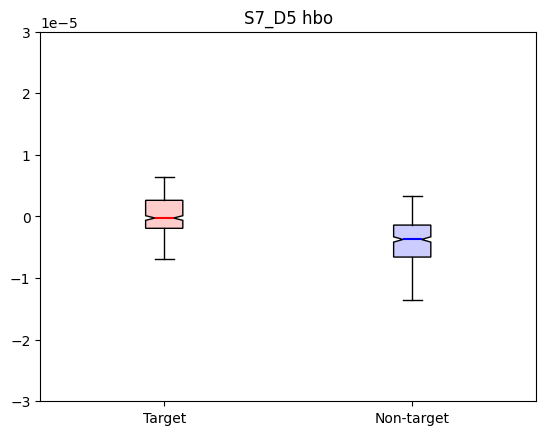

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


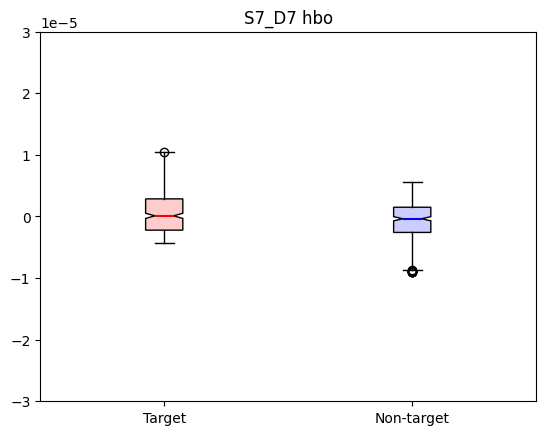

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


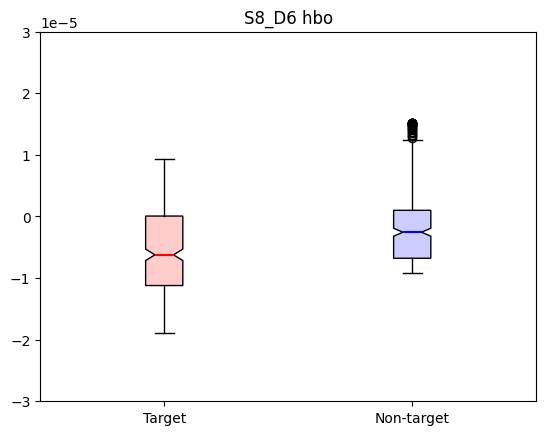

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


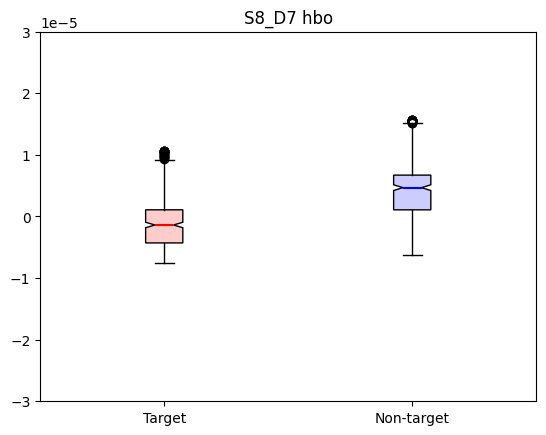

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


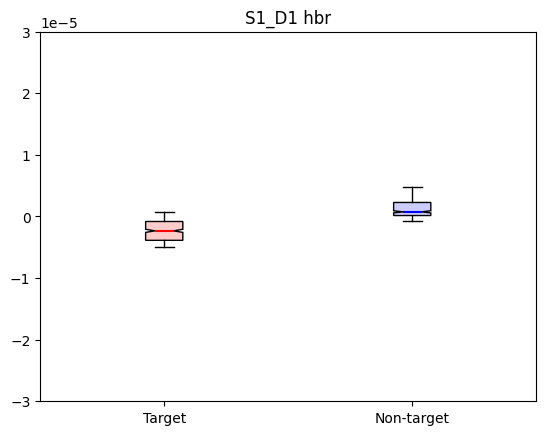

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


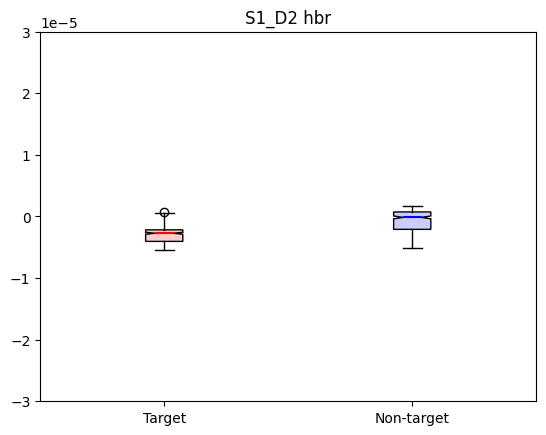

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


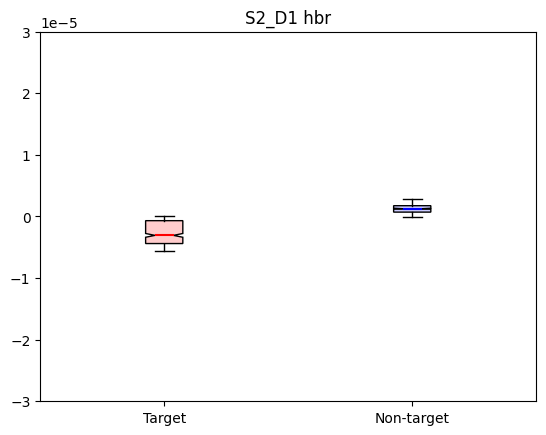

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


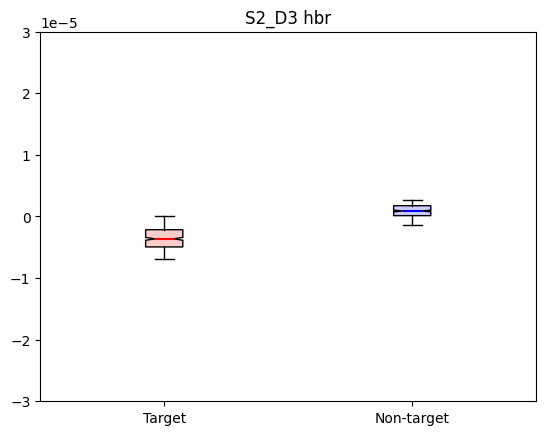

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


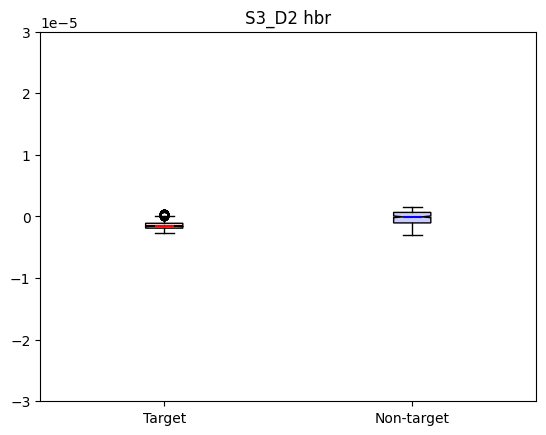

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


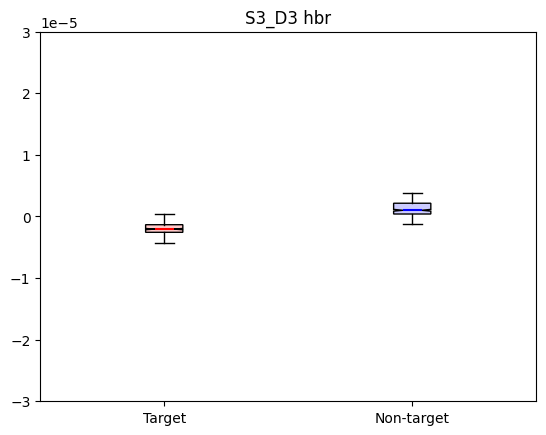

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


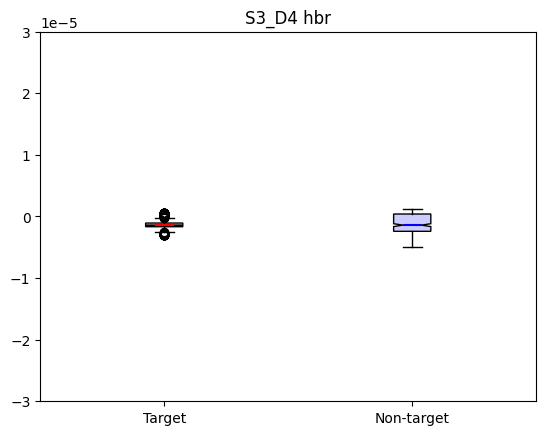

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


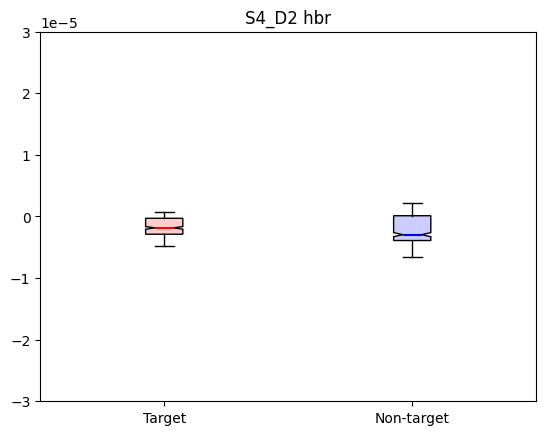

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


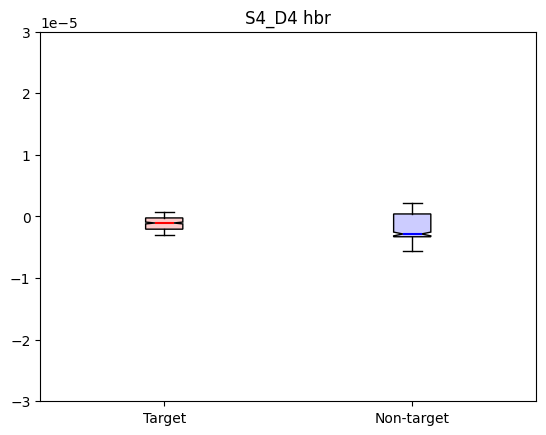

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


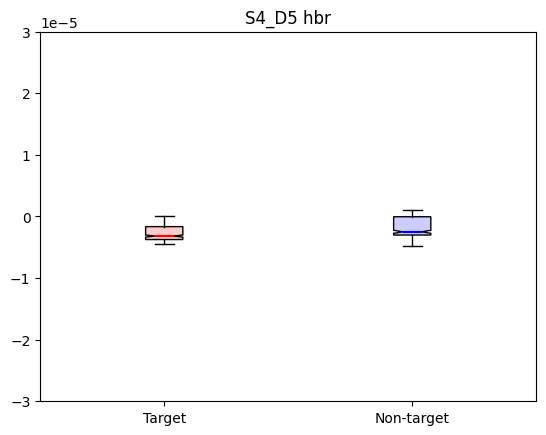

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


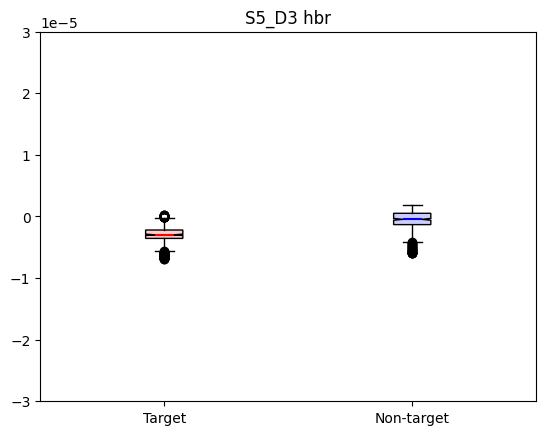

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


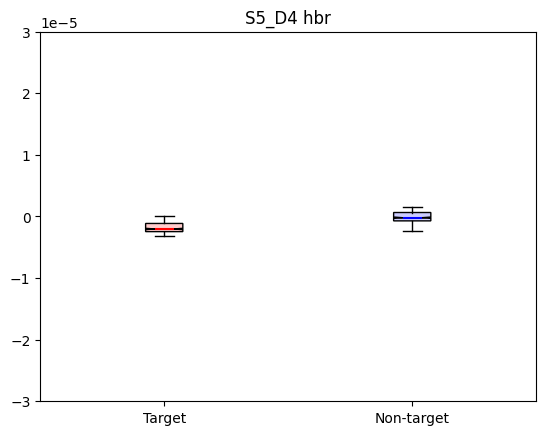

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


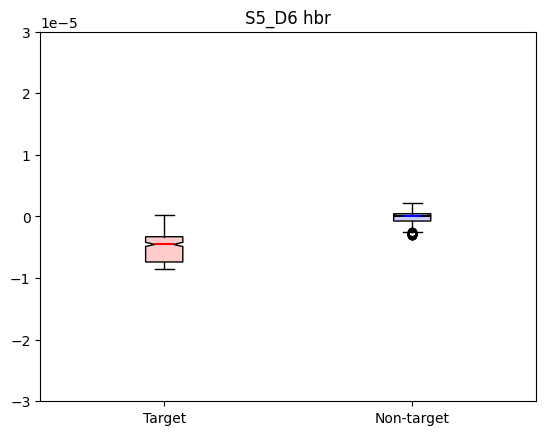

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


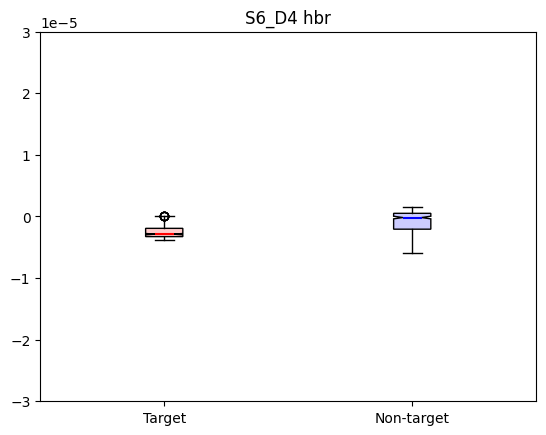

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


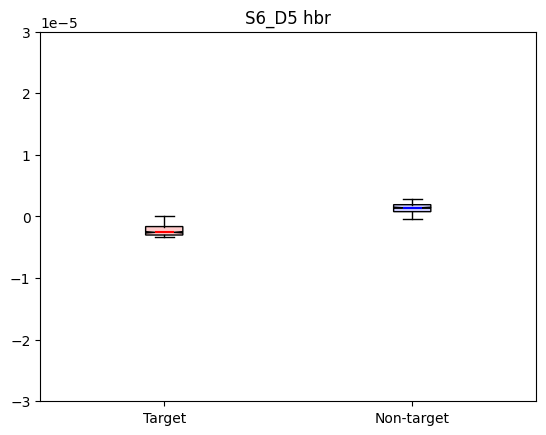

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


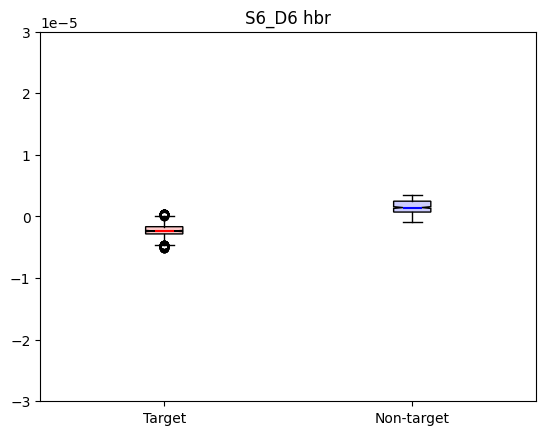

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


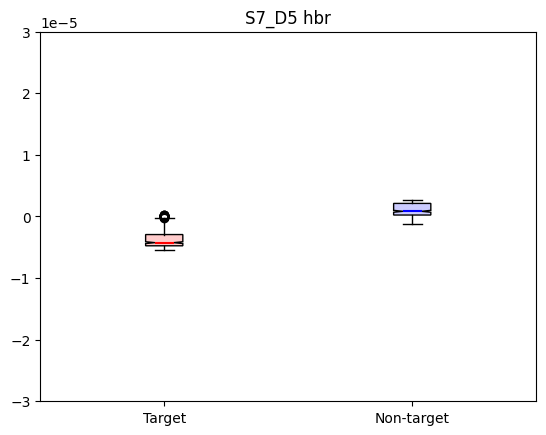

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


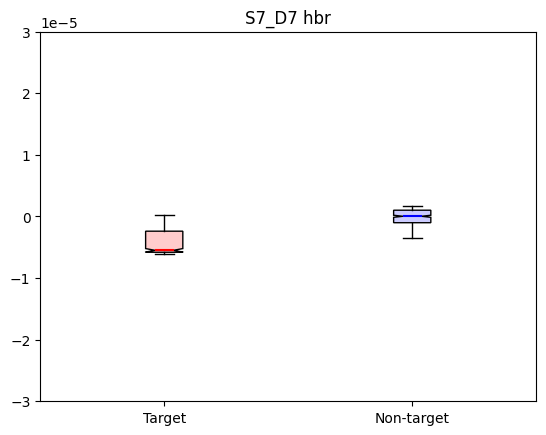

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


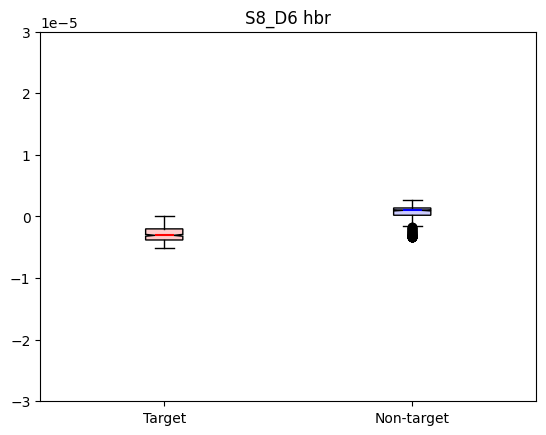

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\671683900.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)


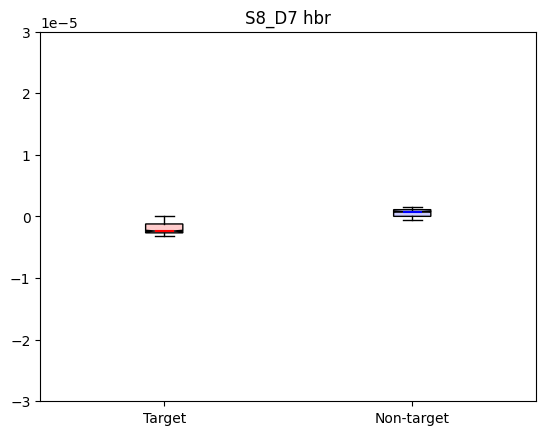

In [163]:
from scipy import stats

zscore_threshold = 1.8
colors = [(1, 0, 0, 0.2), (0, 0, 1, 0.2)]
line_colors = ['red', 'blue']   

for i in range(len(df_t.T)):
    df_tt = df_t.iloc[:,[i]]
    df_ntt = df_n.iloc[:,[i]]

    box = pd.concat([df_tt, df_ntt], axis=1)
    #ch = channels[i].split(' ')[0]
    #plt.figure(figsize=(7, 6))
    plt.ylim([-0.00003, 0.00003])
    plt.title(channels[i])

    bp = plt.boxplot(box, labels=['Target', 'Non-target'], patch_artist=True,  whis=1.5, notch=True)
    
    # Set color for each box
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

    for median, color in zip(bp['medians'], line_colors):
        median.set(color=color, linewidth=1.5)  # Change the color and linewidth of the mean line

    plt.show()

C:\Users\USER\AppData\Local\Temp\ipykernel_25140\3719726317.py:11: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(box[box.columns[0]], labels=['Target', 'Non-target'], whis=1.5, notch=True)


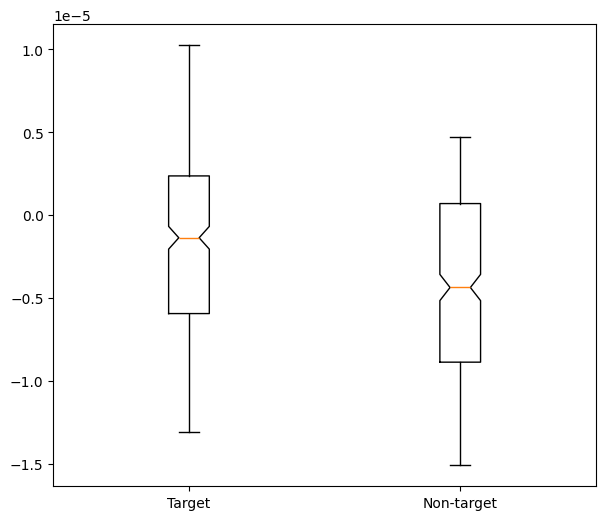

In [119]:
from scipy import stats

zscore_threshold = 1.8

df_tt = df_t.iloc[:,[0]]
df_ntt = df_n.iloc[:,[0]]

box = pd.concat([df_tt, df_ntt], axis=1)

plt.figure(figsize=(7, 6))
plt.boxplot(box[box.columns[0]], labels=['Target', 'Non-target'], whis=1.5, notch=True)
plt.show()

In [61]:
df_t = df_t.T
df_t

,S1_D1 hbo,S1_D2 hbo,S2_D1 hbo,S2_D3 hbo,S3_D2 hbo,S3_D3 hbo,S3_D4 hbo,S4_D2 hbo,S4_D4 hbo,S4_D5 hbo,...,S5_D3 hbr,S5_D4 hbr,S5_D6 hbr,S6_D4 hbr,S6_D5 hbr,S6_D6 hbr,S7_D5 hbr,S7_D7 hbr,S8_D6 hbr,S8_D7 hbr
-2.5,0.000001,-2.076006e-07,5.770784e-07,3.832383e-07,8.694673e-07,9.368382e-07,0.000001,0.000003,1.587005e-06,0.000003,...,2.543207e-07,1.213561e-07,1.561236e-07,-1.416477e-07,-4.797739e-08,-4.771599e-07,1.970250e-07,2.999429e-07,5.375927e-08,-3.907857e-08
-2.4,0.000002,-4.205578e-08,4.804120e-07,4.315382e-07,7.971086e-07,9.727839e-07,0.000001,0.000002,1.498662e-06,0.000002,...,2.097134e-07,1.308169e-07,1.680345e-07,-1.288875e-07,-5.926489e-08,-4.723931e-07,1.824579e-07,2.789189e-07,6.703070e-08,-3.480586e-08
-2.3,0.000002,1.035309e-07,3.841861e-07,4.673345e-07,7.189317e-07,9.960784e-07,0.000001,0.000002,1.399035e-06,0.000002,...,1.671284e-07,1.387042e-07,1.778714e-07,-1.166558e-07,-6.726193e-08,-4.607150e-07,1.678490e-07,2.585460e-07,7.992718e-08,-2.948809e-08
-2.2,0.000002,2.282382e-07,2.904846e-07,4.909624e-07,6.363123e-07,1.006055e-06,0.000001,0.000002,1.289115e-06,0.000002,...,1.269114e-07,1.445726e-07,1.851905e-07,-1.049079e-07,-7.195172e-08,-4.421530e-07,1.531405e-07,2.387313e-07,9.197384e-08,-2.326638e-08
-2.1,0.000001,3.308477e-07,2.001980e-07,5.016674e-07,5.499016e-07,1.001310e-06,0.000001,0.000002,1.169607e-06,0.000002,...,8.943848e-08,1.480442e-07,1.896681e-07,-9.354903e-08,-7.337867e-08,-4.168224e-07,1.383591e-07,2.193109e-07,1.028094e-07,-1.627927e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33.1,0.000003,-1.493744e-06,-2.841339e-06,-6.139585e-06,-3.200679e-06,-1.581046e-06,-0.000002,0.000001,3.340295e-07,0.000004,...,-5.859368e-06,-2.766032e-06,-3.154277e-06,-3.012334e-06,-3.218120e-06,-5.012415e-06,-4.968282e-06,-5.969849e-06,-4.508762e-06,-1.896201e-06
33.2,0.000003,-1.299424e-06,-3.157389e-06,-6.375794e-06,-3.272860e-06,-1.741527e-06,-0.000002,0.000001,2.948950e-07,0.000004,...,-5.832810e-06,-2.765358e-06,-3.112746e-06,-3.002283e-06,-3.233618e-06,-5.039712e-06,-4.918428e-06,-5.979876e-06,-4.491986e-06,-1.880442e-06
33.3,0.000003,-1.118963e-06,-3.452515e-06,-6.614817e-06,-3.344677e-06,-1.905129e-06,-0.000002,0.000001,2.504416e-07,0.000004,...,-5.807215e-06,-2.768128e-06,-3.073546e-06,-2.995266e-06,-3.248177e-06,-5.057936e-06,-4.872824e-06,-5.990766e-06,-4.478332e-06,-1.865978e-06
33.4,0.000003,-9.551629e-07,-3.723421e-06,-6.853771e-06,-3.416034e-06,-2.070817e-06,-0.000002,0.000001,2.001868e-07,0.000004,...,-5.782430e-06,-2.774181e-06,-3.036664e-06,-2.991199e-06,-3.261752e-06,-5.066559e-06,-4.832266e-06,-6.002541e-06,-4.467677e-06,-1.852892e-06


In [62]:
df_n = df_n.T
df_n

,S1_D1 hbo,S1_D2 hbo,S2_D1 hbo,S2_D3 hbo,S3_D2 hbo,S3_D3 hbo,S3_D4 hbo,S4_D2 hbo,S4_D4 hbo,S4_D5 hbo,...,S5_D3 hbr,S5_D4 hbr,S5_D6 hbr,S6_D4 hbr,S6_D5 hbr,S6_D6 hbr,S7_D5 hbr,S7_D7 hbr,S8_D6 hbr,S8_D7 hbr
-2.5,0.000003,2.958869e-06,0.000003,0.000002,0.000002,0.000003,0.000002,1.284661e-06,9.245422e-07,2.008779e-06,...,-3.351973e-07,-3.002073e-07,1.508716e-07,-8.625287e-08,-7.979363e-08,-8.823102e-07,-4.276817e-07,-2.936483e-08,-2.436775e-07,-1.916746e-07
-2.4,0.000003,2.577737e-06,0.000003,0.000002,0.000002,0.000002,0.000002,1.040345e-06,8.265660e-07,1.641611e-06,...,-3.587963e-07,-3.139710e-07,8.816348e-08,-1.199278e-07,-4.385676e-08,-7.598066e-07,-4.515449e-07,4.234519e-09,-2.619676e-07,-1.141703e-07
-2.3,0.000002,2.215504e-06,0.000002,0.000002,0.000002,0.000002,0.000001,8.209104e-07,7.368582e-07,1.305584e-06,...,-3.746237e-07,-3.230578e-07,3.013487e-08,-1.500493e-07,-1.386842e-08,-6.410487e-07,-4.639553e-07,3.362101e-08,-2.744631e-07,-4.291767e-08
-2.2,0.000002,1.876044e-06,0.000002,0.000002,0.000002,0.000002,0.000001,6.283031e-07,6.560993e-07,1.004336e-06,...,-3.821435e-07,-3.269701e-07,-2.201191e-08,-1.754536e-07,1.009900e-08,-5.279393e-07,-4.643185e-07,5.839385e-08,-2.807143e-07,2.099528e-08
-2.1,0.000002,1.561884e-06,0.000002,0.000001,0.000001,0.000002,0.000001,4.630666e-07,5.842281e-07,7.397857e-07,...,-3.810723e-07,-3.253455e-07,-6.732804e-08,-1.951580e-07,2.814413e-08,-4.220210e-07,-4.523513e-07,7.832915e-08,-2.804416e-07,7.660983e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33.1,0.000004,3.240659e-07,0.000019,0.000029,0.000004,0.000017,0.000005,5.998906e-06,1.613780e-06,-8.024705e-07,...,-5.854209e-06,-2.341713e-06,-2.902448e-06,-5.885482e-06,-3.361726e-07,-7.981174e-07,-1.226378e-06,-3.438334e-06,-3.334432e-06,-2.609602e-07
33.2,0.000004,1.297013e-07,0.000018,0.000029,0.000004,0.000016,0.000005,5.624202e-06,1.402741e-06,-1.238181e-06,...,-5.882180e-06,-2.346738e-06,-2.931676e-06,-5.886816e-06,-3.306613e-07,-7.643423e-07,-1.243719e-06,-3.443909e-06,-3.336557e-06,-2.632504e-07
33.3,0.000003,-8.111380e-08,0.000018,0.000028,0.000004,0.000016,0.000004,5.246895e-06,1.186735e-06,-1.672701e-06,...,-5.902144e-06,-2.350782e-06,-2.960010e-06,-5.880616e-06,-3.195110e-07,-7.240448e-07,-1.258422e-06,-3.448870e-06,-3.337018e-06,-2.655759e-07
33.4,0.000003,-3.060166e-07,0.000018,0.000028,0.000004,0.000016,0.000004,4.869639e-06,9.669457e-07,-2.103102e-06,...,-5.914176e-06,-2.353830e-06,-2.987577e-06,-5.866737e-06,-3.029365e-07,-6.775709e-07,-1.270554e-06,-3.453474e-06,-3.336154e-06,-2.679534e-07


IndexError: invalid index to scalar variable.

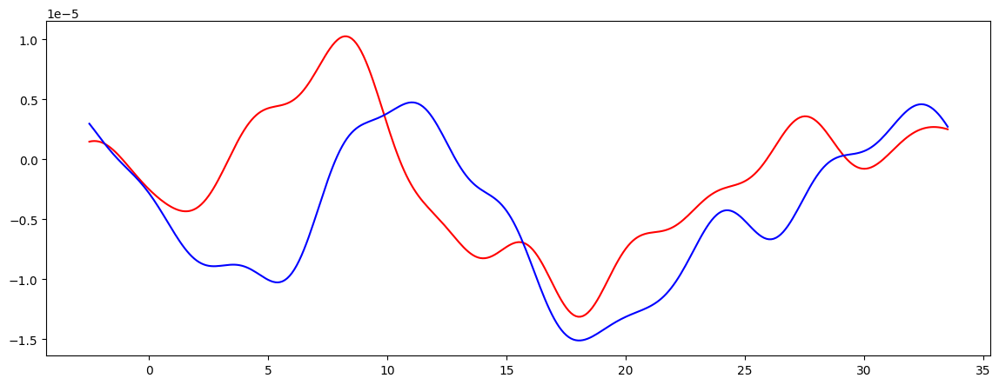

In [1139]:
for i in range(len(df_t)):

    fig, axes = plt.subplots(1, 1, figsize=(14, 5), sharey=True)

    df_t.iloc[i].plot(ax=axes, color='r')
    df_n.iloc[i].plot(ax=axes, color='b')
    
    axes.fill_between(times, t_epochs_means[i] - t_epochs_stds[i], t_epochs_means[i] + t_epochs_stds[i], color='r', alpha=0.2)
    axes.fill_between(times, n_epochs_means[i] - n_epochs_stds[i], n_epochs_means[i] + n_epochs_stds[i], color='b', alpha=0.2)

    # t_peak_locs, t_peak_mags = peak_finder(t_data[i])
    # for i in range(len(t_peak_locs)):
    #     if t_peak_locs[i]/10-0.5 > 2:
    #         axes.plot(t_peak_locs[i]/10-0.5, t_peak_mags[i]*1000000, 'r*')
    #         axes.text(t_peak_locs[i]/10-0.5, t_peak_mags[i]*1000000, f'{t_peak_mags[i]*1000000}', fontsize=8, color='r')
    #         axes.axvline(t_peak_locs[i]/10-0.5, color='r', linestyle='-')
    #         break
    
    # n_peak_locs, n_peak_mags = peak_finder(evoked_nontarget_data)
    # for i in range(len(n_peak_locs)):
    #     if n_peak_locs[i]/10-0.5 > 2:
    #         axes.plot(n_peak_locs[i]/10-0.5, n_peak_mags[i]*1000000, 'b*')
    #         axes.text(n_peak_locs[i]/10-0.5, n_peak_mags[i]*1000000, f'{n_peak_mags[i]*1000000}', fontsize=8, color='b')
    #         axes.axvline(n_peak_locs[i]/10-0.5, color='b', linestyle='-')

    axes.set_title(f'{channels[i]}')
    axes.legend(['Target', 'Non-target'], loc='upper right')

    axes.axvline(2, color='black', linestyle='--')


In [ ]:
for idx, ch_name in enumerate(channels):
    evoked_target = epochs["Target"].average(picks=ch_name)
    evoked_nontarget = epochs["Non-target"].average(picks=ch_name)


    fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)
    
    evoked_target.plot(axes=axes[0], spatial_colors=False, gfp=False, ylim=dict(hbo=[-20, 20], hbr=[-10, 10]), show=False)
    evoked_nontarget.plot(axes=axes[0], spatial_colors=True, gfp=False, ylim=dict(hbo=[-20, 20], hbr=[-10, 10]), show=False)
        
    evoked_target_data = evoked_target.get_data()[0]
    t_peak_locs, t_peak_mags = peak_finder(evoked_target_data)
    for i in range(len(t_peak_locs)):
        if t_peak_locs[i]/10-0.5 > 2:
            axes[0].plot(t_peak_locs[i]/10-0.5, t_peak_mags[i]*1000000, 'r*')
            axes[0].text(t_peak_locs[i]/10-0.5, t_peak_mags[i]*1000000, f'{t_peak_mags[i]*1000000}', fontsize=8, color='r')
            axes[0].axvline(t_peak_locs[i]/10-0.5, color='r', linestyle='-')
            break

    evoked_nontarget_data = evoked_nontarget.get_data()[0]
    n_peak_locs, n_peak_mags = peak_finder(evoked_nontarget_data)
    for i in range(len(n_peak_locs)):
        if n_peak_locs[i]/10-0.5 > 2:
            axes[0].plot(n_peak_locs[i]/10-0.5, n_peak_mags[i]*1000000, 'b*')
            axes[0].text(n_peak_locs[i]/10-0.5, n_peak_mags[i]*1000000, f'{n_peak_mags[i]*1000000}', fontsize=8, color='b')
            axes[0].axvline(n_peak_locs[i]/10-0.5, color='b', linestyle='-')
            break
    
    axes[0].axvline(2, color='black', linestyle='--')
    axes[0].fill_between([2, 14], -20, 20, color='grey', alpha=0.2)
    axes[0].fill_between([5, 11], -20, 20, color='black', alpha=0.2)
    axes[0].set_title(f'{ch_name}')

    lines = axes[0].get_lines()
    lines[0].set_color('r')  
    lines[1].set_color('b')  

    axes[0].legend(['Target', 'Non-target'], loc='upper left')
    
    # hide axes[1]
    axes[1].set_facecolor('none')
    axes[1].spines['top'].set_visible(False)
    axes[1].spines['right'].set_visible(False)
    axes[1].spines['bottom'].set_visible(False)
    axes[1].spines['left'].set_visible(False)
    axes[1].tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)

    plt.show()
